![](../assets/images/ga_logo.png)


-----

# Project: House Prices - Advanced Regression Techniques

 - Problem Identification
 - Data Exploration
 - Data Preprocessing and Feature Engineering
 - Modeling

# Goal
- Predict the sales price for each house.
- Submissions are evaluated on Root-Mean-Squared-Error (RMSE) between the logarithm of the predicted value and the logarithm of the observed sales price. (Taking logs means that errors in predicting expensive houses and cheap houses will affect the result equally.)

# Team:

| Team               |1                   |2                     |3                    |
|:-------------------|:------------------:|:--------------------:|:-------------------:|
|7                   |*Mohammed Al-Hamad* |*Najwa Al-Saadi*      |*Ragad Alabdullateef*|

Kaggel kernel: https://www.kaggle.com/imohtn/house-prices-rnm-eda-fe-modeling

---

In [2]:
# Imports
import pandas as pd 
import numpy as np 

#ploting
import seaborn as sns
import matplotlib.pyplot as plt
from IPython.display import set_matplotlib_formats

#Displaying options
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)

#Preprocessors and scorer
from sklearn.metrics import mean_squared_error
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split, GridSearchCV

#Models
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor
from sklearn.linear_model import LinearRegression, RidgeCV, LassoCV, ElasticNetCV, Ridge, Lasso, ElasticNet

#Set styles
%matplotlib inline
set_matplotlib_formats('retina')
plt.style.use('default')

#Ignore unwanted warnings
import warnings
warnings.filterwarnings('ignore')

---

# Read the data

In [3]:
# Read data
train = pd.read_csv('../data/house/house_train.csv')
test = pd.read_csv('../data/house/house_test.csv')

# EDA


In [4]:
train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [5]:
test.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Feedr,Norm,1Fam,1Story,5,6,1961,1961,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,468.0,LwQ,144.0,270.0,882.0,GasA,TA,Y,SBrkr,896,0,0,896,0.0,0.0,1,0,2,1,TA,5,Typ,0,NaN,Attchd,1961.0,Unf,1.0,730.0,TA,TA,Y,140,0,0,0,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,6,1958,1958,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,108.0,TA,TA,CBlock,TA,TA,No,ALQ,923.0,Unf,0.0,406.0,1329.0,GasA,TA,Y,SBrkr,1329,0,0,1329,0.0,0.0,1,1,3,1,Gd,6,Typ,0,NaN,Attchd,1958.0,Unf,1.0,312.0,TA,TA,Y,393,36,0,0,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,5,5,1997,1998,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,GLQ,791.0,Unf,0.0,137.0,928.0,GasA,Gd,Y,SBrkr,928,701,0,1629,0.0,0.0,2,1,3,1,TA,6,Typ,1,TA,Attchd,1997.0,Fin,2.0,482.0,TA,TA,Y,212,34,0,0,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,6,1998,1998,Gable,CompShg,VinylSd,VinylSd,BrkFace,20.0,TA,TA,PConc,TA,TA,No,GLQ,602.0,Unf,0.0,324.0,926.0,GasA,Ex,Y,SBrkr,926,678,0,1604,0.0,0.0,2,1,3,1,Gd,7,Typ,1,Gd,Attchd,1998.0,Fin,2.0,470.0,TA,TA,Y,360,36,0,0,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,Inside,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1992,1992,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,PConc,Gd,TA,No,ALQ,263.0,Unf,0.0,1017.0,1280.0,GasA,Ex,Y,SBrkr,1280,0,0,1280,0.0,0.0,2,0,2,1,Gd,5,Typ,0,NaN,Attchd,1992.0,RFn,2.0,506.0,TA,TA,Y,0,82,0,0,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal


In [6]:
train.shape, test.shape

((1460, 81), (1459, 80))

## Null values:

In [7]:
train.isnull().sum()

Id                  0
MSSubClass          0
MSZoning            0
LotFrontage       259
LotArea             0
Street              0
Alley            1369
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          8
MasVnrArea          8
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           37
BsmtCond           37
BsmtExposure       38
BsmtFinType1       37
BsmtFinSF1          0
BsmtFinType2       38
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          1
1stFlrSF            0
2ndFlrSF            0
LowQualFin

 let's do Heatmap for Nulls

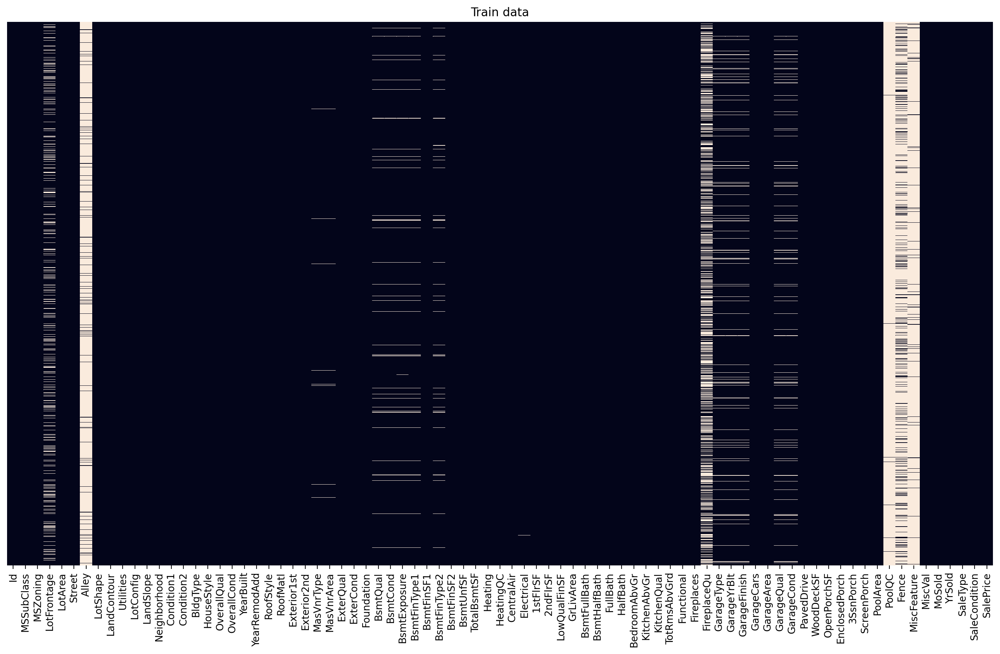

In [8]:
fig, ax = plt.subplots(figsize = (18, 10))

# train data 
sns.heatmap(train.isnull(), yticklabels=False, cbar=False)
ax.set_title('Train data');

We have a lot of Null values in train data, let's extract the columns name

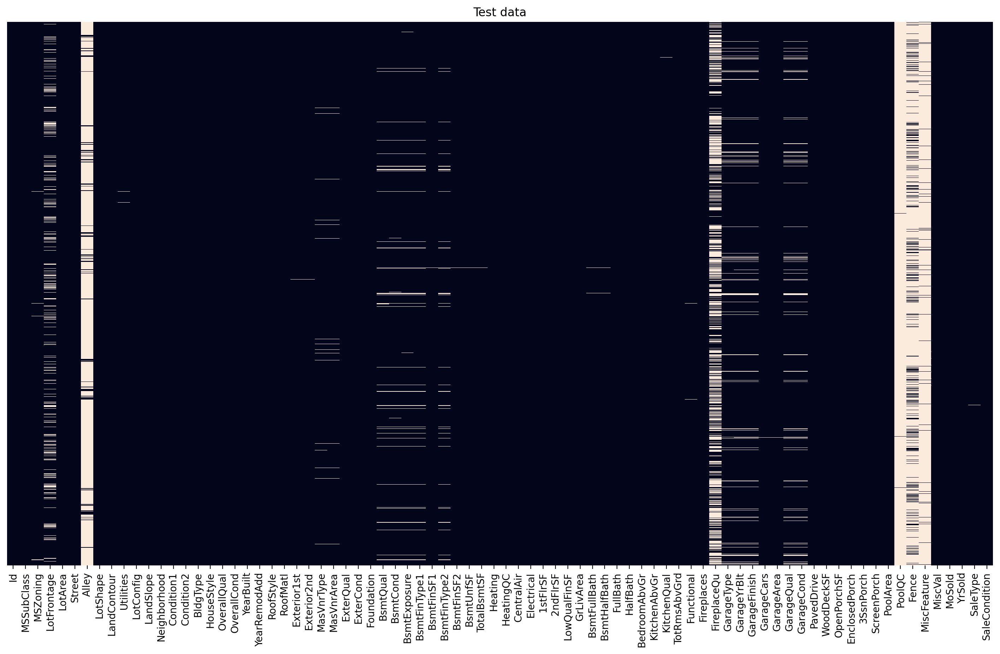

In [9]:
fig, ax = plt.subplots(figsize = (18, 10))

# train data 
sns.heatmap(test.isnull(), yticklabels=False, cbar=False)
ax.set_title('Test data');

We have a lot of Null values in test data also. we will deal with nan later.

In [10]:
#Get the Nan the columns name, if any colum have nan > 1 
na_feature = [col for col in train.columns if train[col].isna().sum()>=1]
na_feature

['LotFrontage',
 'Alley',
 'MasVnrType',
 'MasVnrArea',
 'BsmtQual',
 'BsmtCond',
 'BsmtExposure',
 'BsmtFinType1',
 'BsmtFinType2',
 'Electrical',
 'FireplaceQu',
 'GarageType',
 'GarageYrBlt',
 'GarageFinish',
 'GarageQual',
 'GarageCond',
 'PoolQC',
 'Fence',
 'MiscFeature']

In [11]:
def perc_nan(df):
    """Function return the column names and the oercent of nans in each columns with the number, params: dataframe""" 
    # missing values as %
    percent = df.isnull().sum() *100 / df.shape[0]
    
    return  pd.concat([df.isnull().sum(), percent[percent > 0]],keys=["No_NaN","Percent"],
                                                                      axis=1).dropna().sort_values('Percent')

In [12]:
perc_nan(train)

,No_NaN,Percent
Electrical,1,0.068493
MasVnrType,8,0.547945
MasVnrArea,8,0.547945
BsmtQual,37,2.534247
BsmtCond,37,2.534247
BsmtFinType1,37,2.534247
BsmtExposure,38,2.602740
BsmtFinType2,38,2.602740
GarageCond,81,5.547945
GarageQual,81,5.547945


In [13]:
perc_nan(test)

,No_NaN,Percent
TotalBsmtSF,1,0.068540
GarageArea,1,0.068540
GarageCars,1,0.068540
KitchenQual,1,0.068540
BsmtUnfSF,1,0.068540
BsmtFinSF2,1,0.068540
BsmtFinSF1,1,0.068540
SaleType,1,0.068540
Exterior1st,1,0.068540
Exterior2nd,1,0.068540


# Relation between NaNs features and SalePrice (Target):

1 = NaN, 0 = value


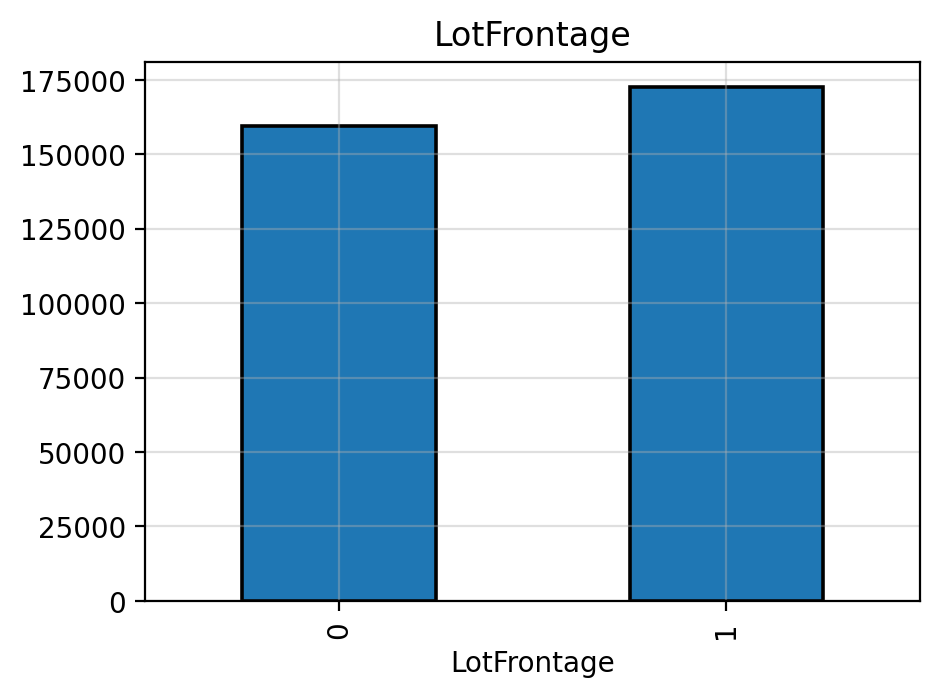

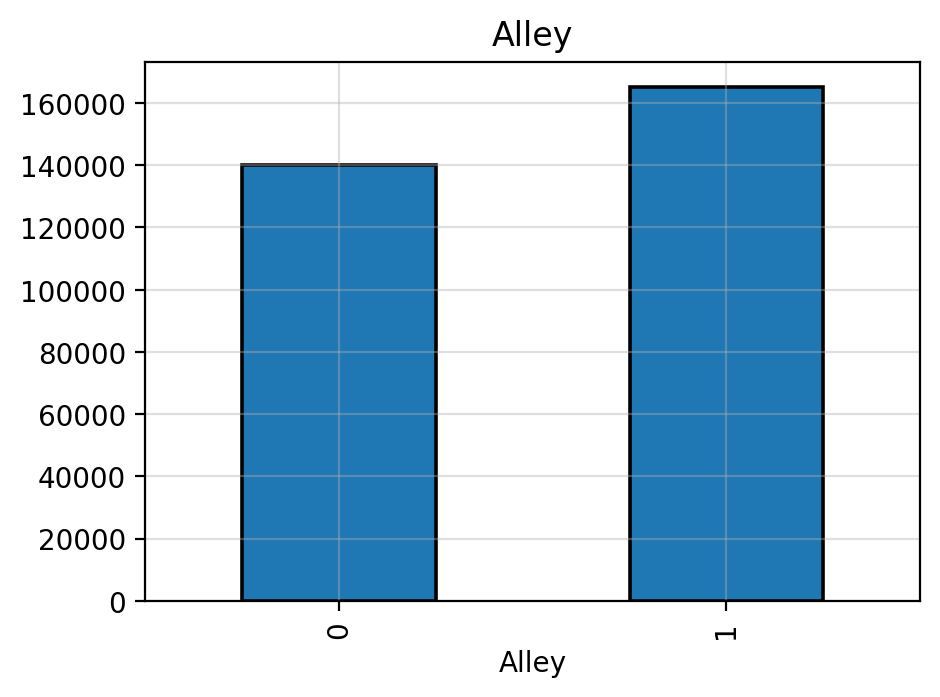

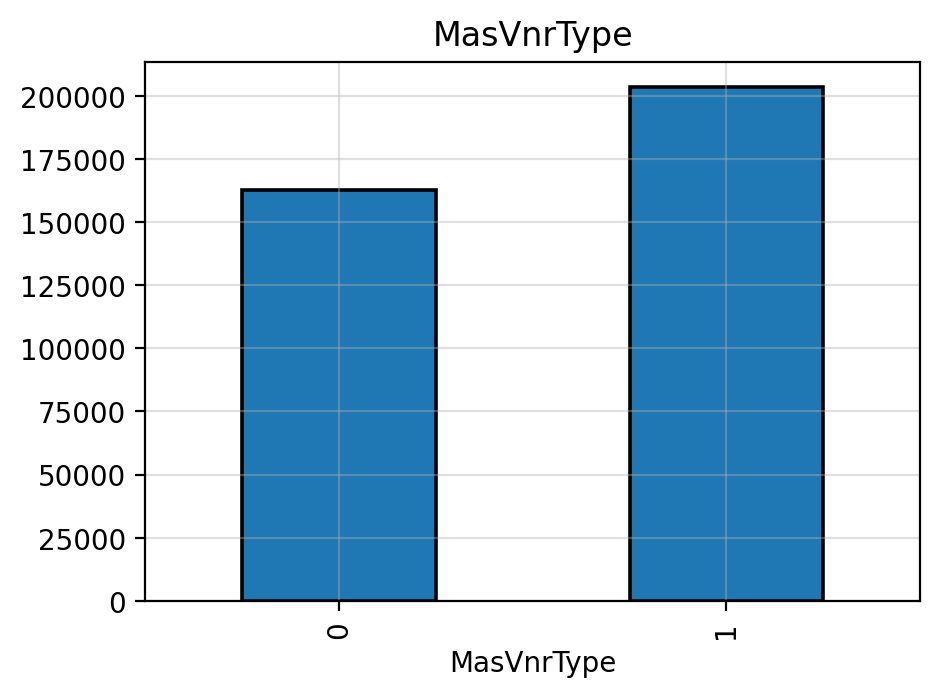

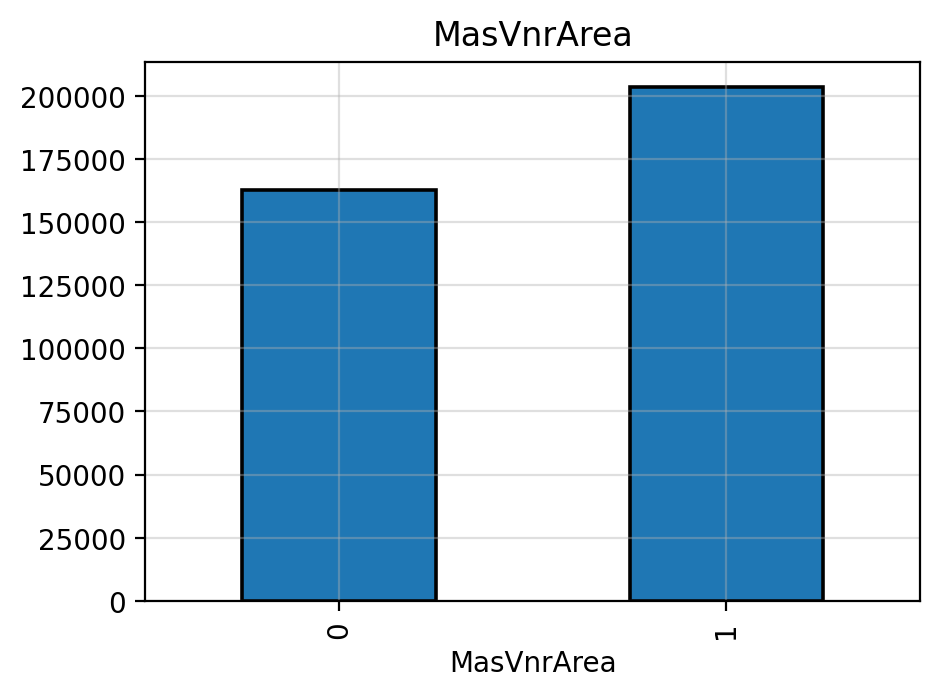

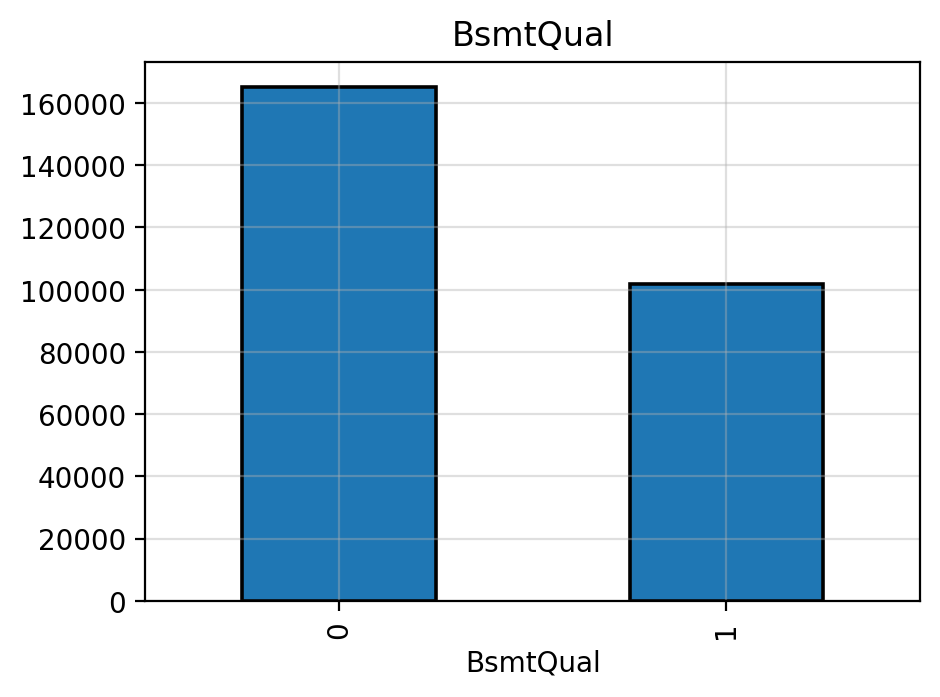

...

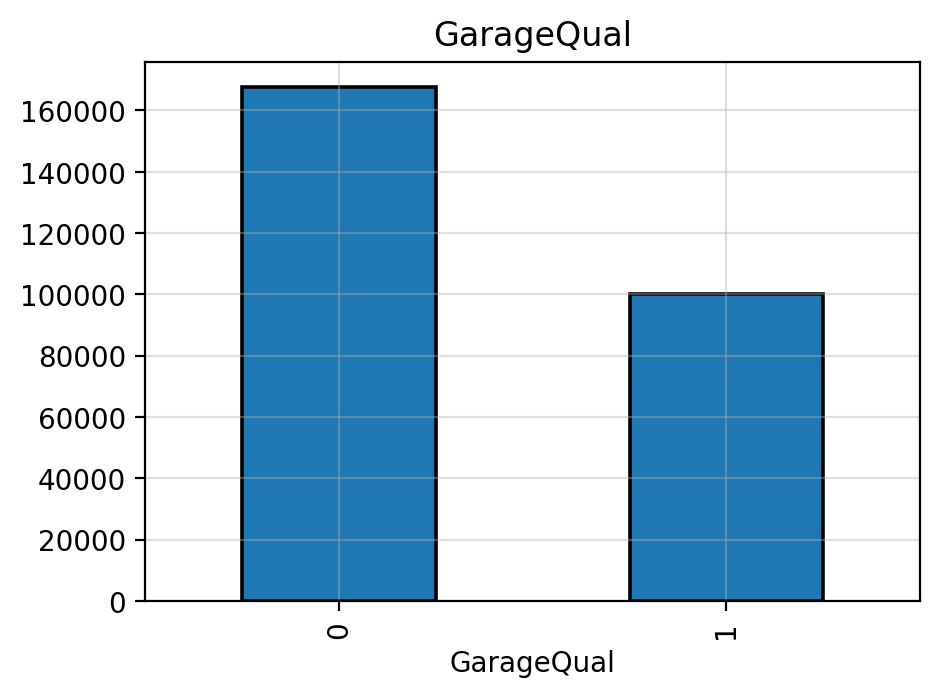

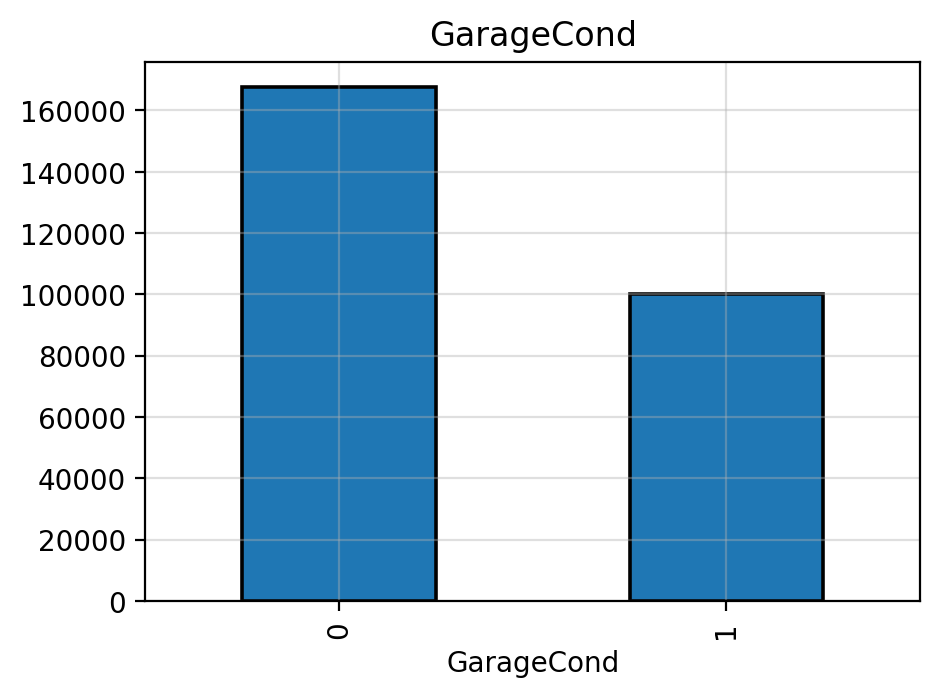

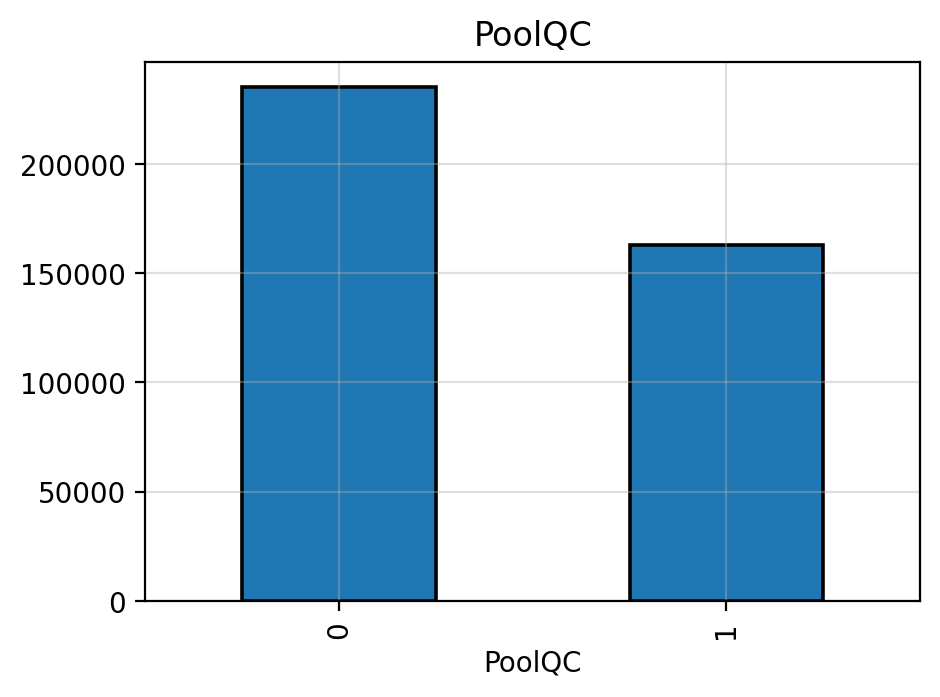

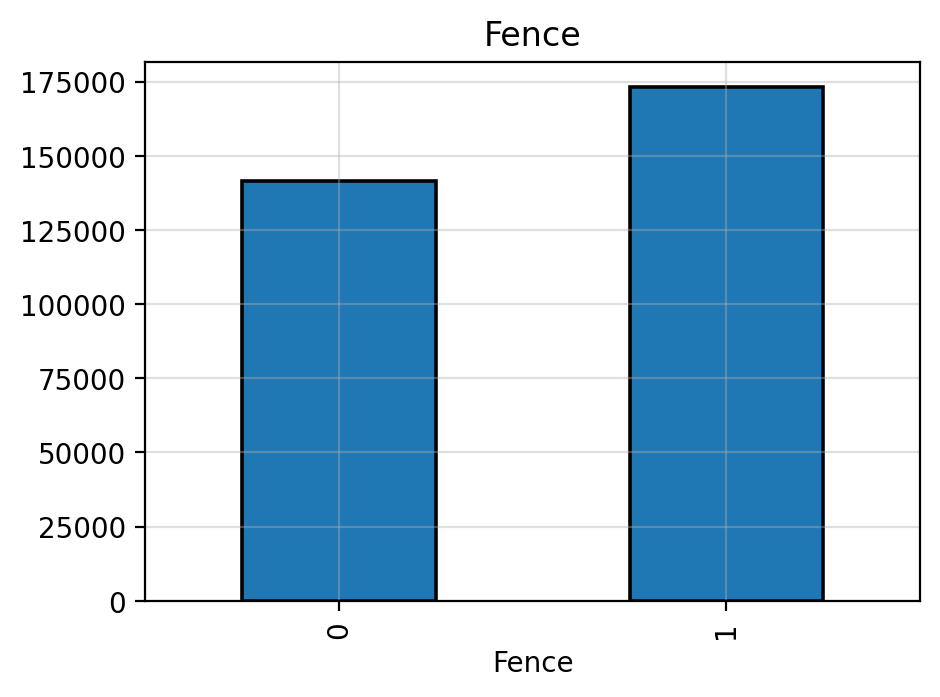

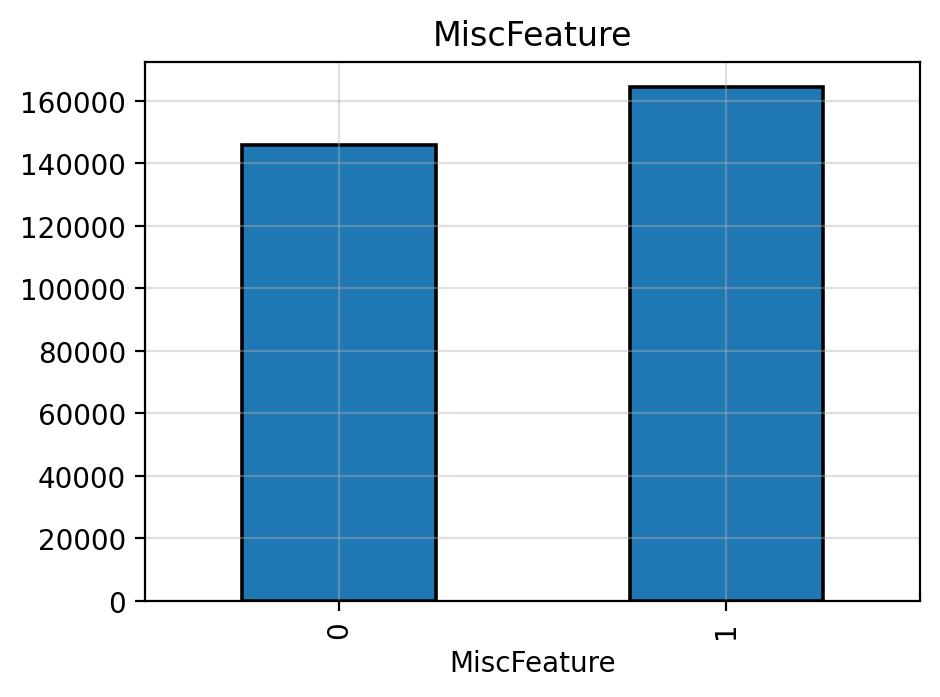

In [14]:
#Plot each column with nan and see it's relation with our target (SalePrice) 0 = nan , 1 = any value
for each in na_feature:
    
    #Deep copy of df - (Not by reference)
    df_copy = train.copy(deep=True) 
    
    #Mask the values, 1 = NaN, 0 = Any value
    df_copy[each] = np.where(df_copy[each].isnull(), 1, 0)
    
    #Groupby the feature based on SalePrice median and plot
    plt.figure(figsize=(5,3.5))
    
    df_copy.groupby(each)['SalePrice'].median().plot.bar(edgecolor = 'black', linewidth=1.3)
    
    plt.title(each)
    plt.grid(alpha=0.4)
    plt.ticklabel_format(style='plain', axis='y') #Disable scientific notation;
    plt.show
    
print('1 = NaN, 0 = value')

Most of the NaN are affecting the SalePrice itself. We can see that by the bar of 0's in some columns greater than the values it self.

---

We need to know our data types:

- **Numerical : values are numbers**
 - Discrete Data 
 - Continuous Data<br><br>
 
- **Categorical : values are categories**
 - Norminal Data 
 - Ordinal Data

# Numeric features

In [15]:
#Take the target
y = train[['SalePrice']]

#Drop Id column(useless) and target
train.drop('Id', axis=1 ,inplace=True)

In [16]:
#Get the numeric columns only in a list
numeric_features = train.select_dtypes('number').columns
numeric_features

Index(['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond',
       'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
       'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces',
       'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
       'MoSold', 'YrSold', 'SalePrice'],
      dtype='object')

In [17]:
print('Number of numeric features = ', len(train[numeric_features].columns))
train[numeric_features].head()

Number of numeric features =  37


,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,60,65.0,8450,7,5,2003,2003,196.0,706,0,150,856,856,854,0,1710,1,0,2,1,3,1,8,0,2003.0,2,548,0,61,0,0,0,0,0,2,2008,208500
1,20,80.0,9600,6,8,1976,1976,0.0,978,0,284,1262,1262,0,0,1262,0,1,2,0,3,1,6,1,1976.0,2,460,298,0,0,0,0,0,0,5,2007,181500
2,60,68.0,11250,7,5,2001,2002,162.0,486,0,434,920,920,866,0,1786,1,0,2,1,3,1,6,1,2001.0,2,608,0,42,0,0,0,0,0,9,2008,223500
3,70,60.0,9550,7,5,1915,1970,0.0,216,0,540,756,961,756,0,1717,1,0,1,0,3,1,7,1,1998.0,3,642,0,35,272,0,0,0,0,2,2006,140000
4,60,84.0,14260,8,5,2000,2000,350.0,655,0,490,1145,1145,1053,0,2198,1,0,2,1,4,1,9,1,2000.0,3,836,192,84,0,0,0,0,0,12,2008,250000


*YearBuilt | YearRemodAdd | GarageYrBlt | YrSold* - are year fetures, we can make a use of them like see the relation of YearBuilt and YrSold, or YearBuilt wiht SalePrice, etc.. 
<br><br>

# Name  of features contain year

In [18]:
#Get a list of the Year features for Feature engineering section
year_features = [col_name for col_name in train.columns if 'Yr' in col_name or 'Year' in col_name]
year_features

['YearBuilt', 'YearRemodAdd', 'GarageYrBlt', 'YrSold']

# Unique years in each year feature

In [19]:
#Get the unique values for each year feature
for feature in year_features:
    print('\n', feature, 'Unique\'s:\n', train[feature].unique())


 YearBuilt Unique's:
 [2003 1976 2001 1915 2000 1993 2004 1973 1931 1939 1965 2005 1962 2006
 1960 1929 1970 1967 1958 1930 2002 1968 2007 1951 1957 1927 1920 1966
 1959 1994 1954 1953 1955 1983 1975 1997 1934 1963 1981 1964 1999 1972
 1921 1945 1982 1998 1956 1948 1910 1995 1991 2009 1950 1961 1977 1985
 1979 1885 1919 1990 1969 1935 1988 1971 1952 1936 1923 1924 1984 1926
 1940 1941 1987 1986 2008 1908 1892 1916 1932 1918 1912 1947 1925 1900
 1980 1989 1992 1949 1880 1928 1978 1922 1996 2010 1946 1913 1937 1942
 1938 1974 1893 1914 1906 1890 1898 1904 1882 1875 1911 1917 1872 1905]

 YearRemodAdd Unique's:
 [2003 1976 2002 1970 2000 1995 2005 1973 1950 1965 2006 1962 2007 1960
 2001 1967 2004 2008 1997 1959 1990 1955 1983 1980 1966 1963 1987 1964
 1972 1996 1998 1989 1953 1956 1968 1981 1992 2009 1982 1961 1993 1999
 1985 1979 1977 1969 1958 1991 1971 1952 1975 2010 1984 1986 1994 1988
 1954 1957 1951 1978 1974]

 GarageYrBlt Unique's:
 [2003. 1976. 2001. 1998. 2000. 1993. 2004. 197

All of the houses sold in between 2006 and 2010, even for houses that built in past years (ex. 90's)

As I see these are all years we have in our data, and we have some **beautiful** NaNs in GarageYrBlt

In [20]:
train.GarageYrBlt.isna().sum()

81

In [21]:
train.GarageYrBlt.sort_values(ascending=True).unique()

array([1900., 1906., 1908., 1910., 1914., 1915., 1916., 1918., 1920.,
       1921., 1922., 1923., 1924., 1925., 1926., 1927., 1928., 1929.,
       1930., 1931., 1932., 1933., 1934., 1935., 1936., 1937., 1938.,
       1939., 1940., 1941., 1942., 1945., 1946., 1947., 1948., 1949.,
       1950., 1951., 1952., 1953., 1954., 1955., 1956., 1957., 1958.,
       1959., 1960., 1961., 1962., 1963., 1964., 1965., 1966., 1967.,
       1968., 1969., 1970., 1971., 1972., 1973., 1974., 1975., 1976.,
       1977., 1978., 1979., 1980., 1981., 1982., 1983., 1984., 1985.,
       1986., 1987., 1988., 1989., 1990., 1991., 1992., 1993., 1994.,
       1995., 1996., 1997., 1998., 1999., 2000., 2001., 2002., 2003.,
       2004., 2005., 2006., 2007., 2008., 2009., 2010.,   nan])

80 years values are missing in GarageYrBlt feature.

# Plot each year features aginst SalePrice

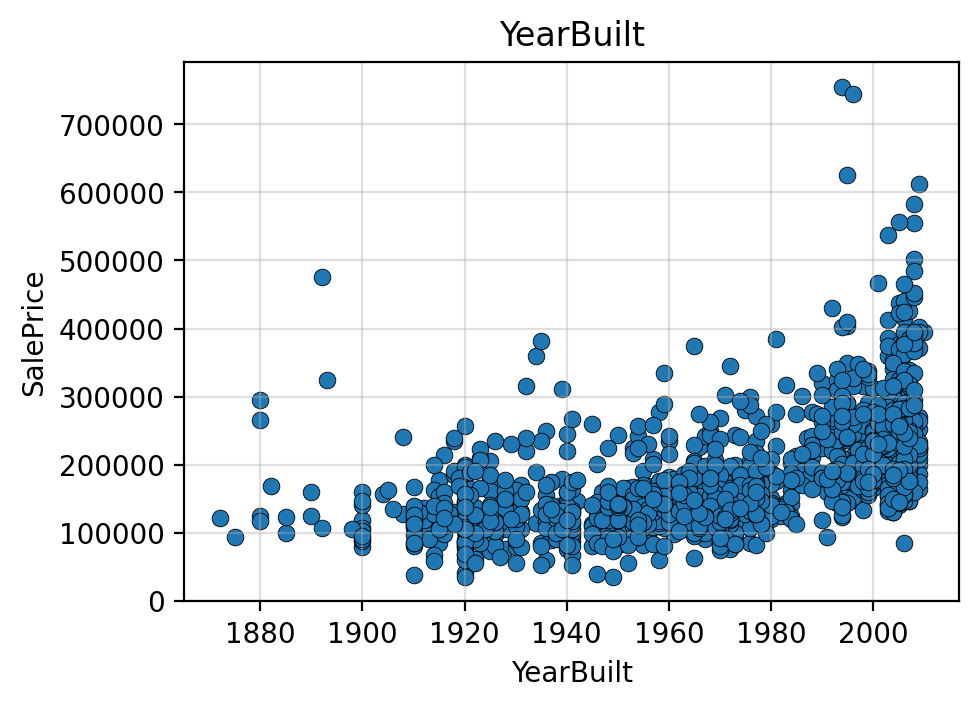

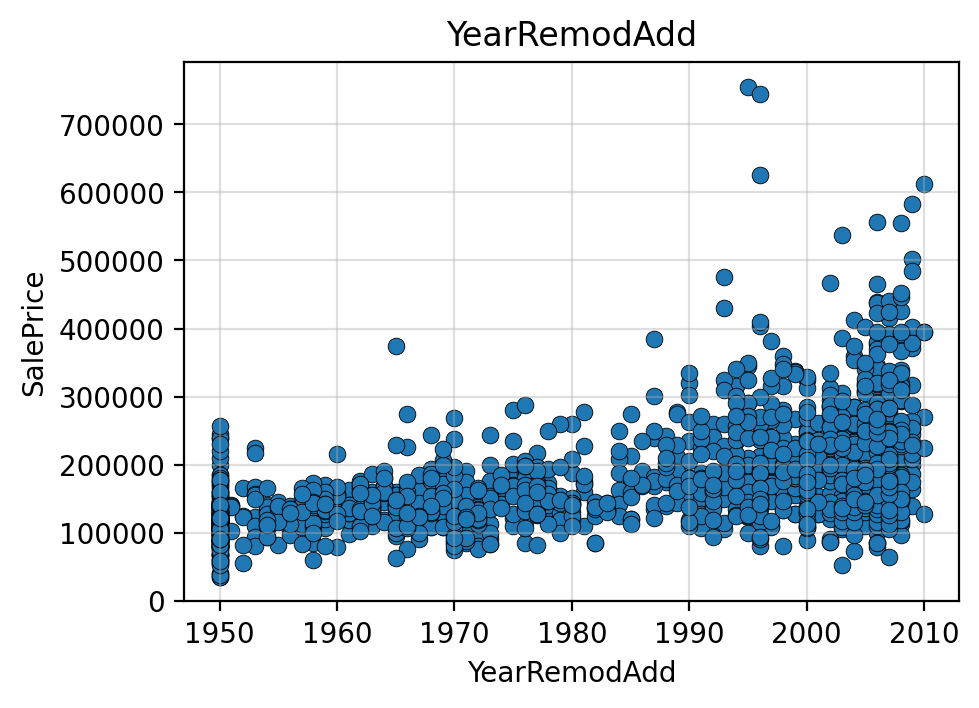

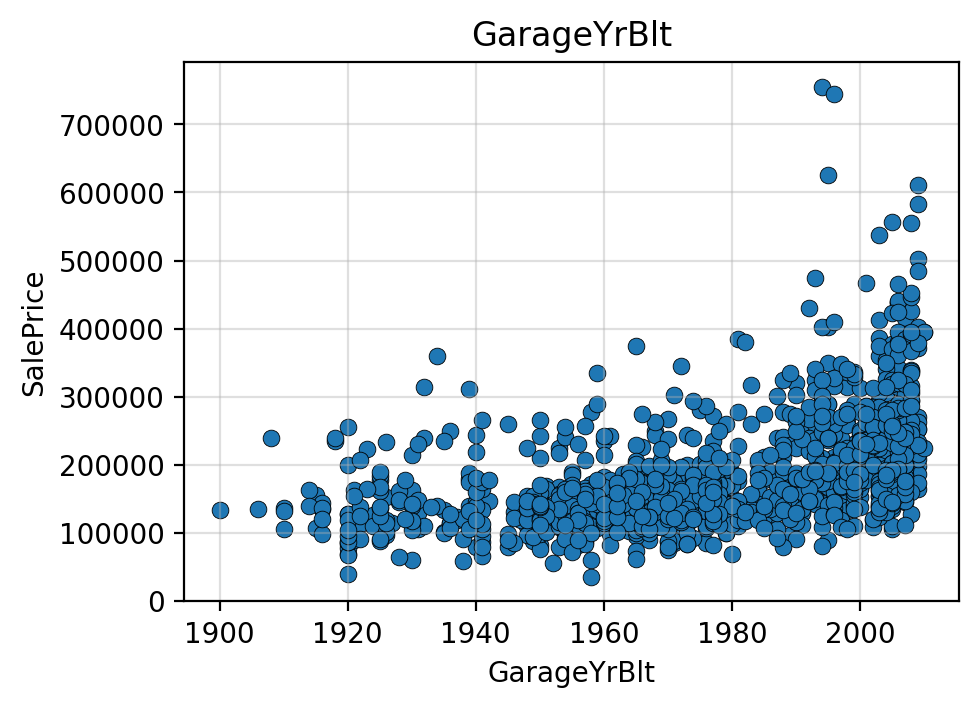

In [22]:
#Compare each year column with SalePrice:
for each in year_features[:3]:
    #Deep copy of df - (Not by reference)
    df_copy = train.copy(deep=True) 
    
    plt.figure(figsize=(5, 3.5))
    sns.scatterplot(x = df_copy[each], y = train.SalePrice, edgecolor='black', linewidth=0.3)
    
    plt.title(each)
    plt.grid(alpha=0.4)
    plt.ticklabel_format(style='plain', axis='y') #Disable scientific notation;
    plt.show

**i took the log of the houses so the price don't get affected by high prices and affect the shape or the relation. We can see new houses sold at higher price**

# Plot sum of sales for each month Vs SalesPrice

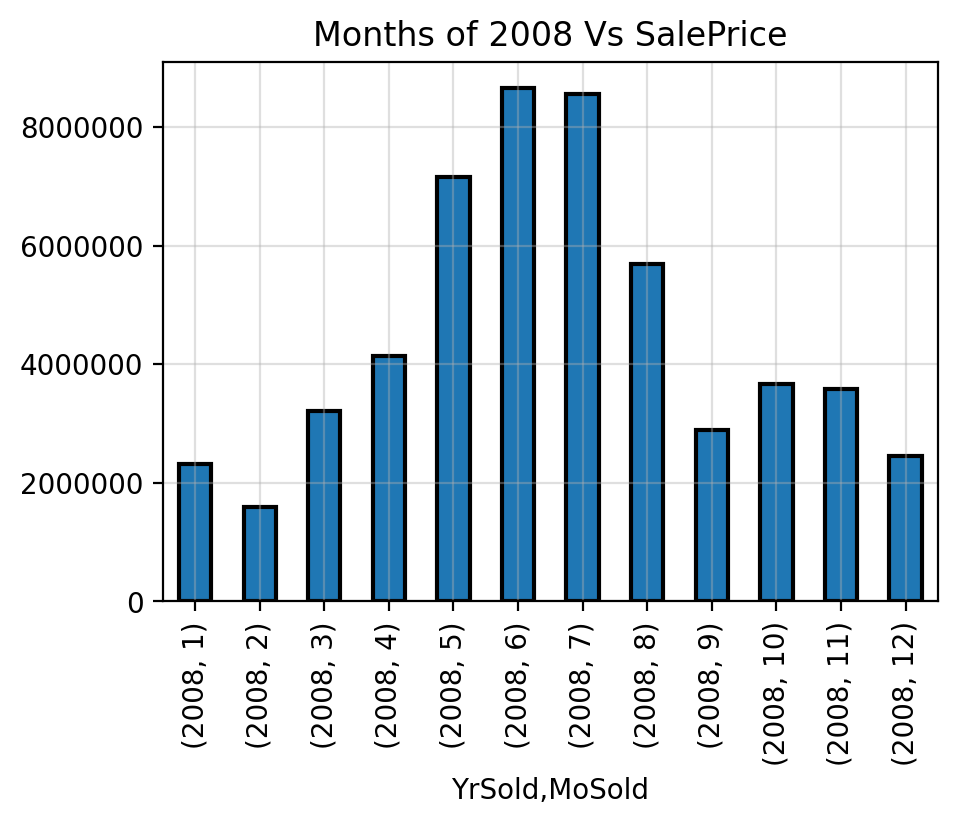

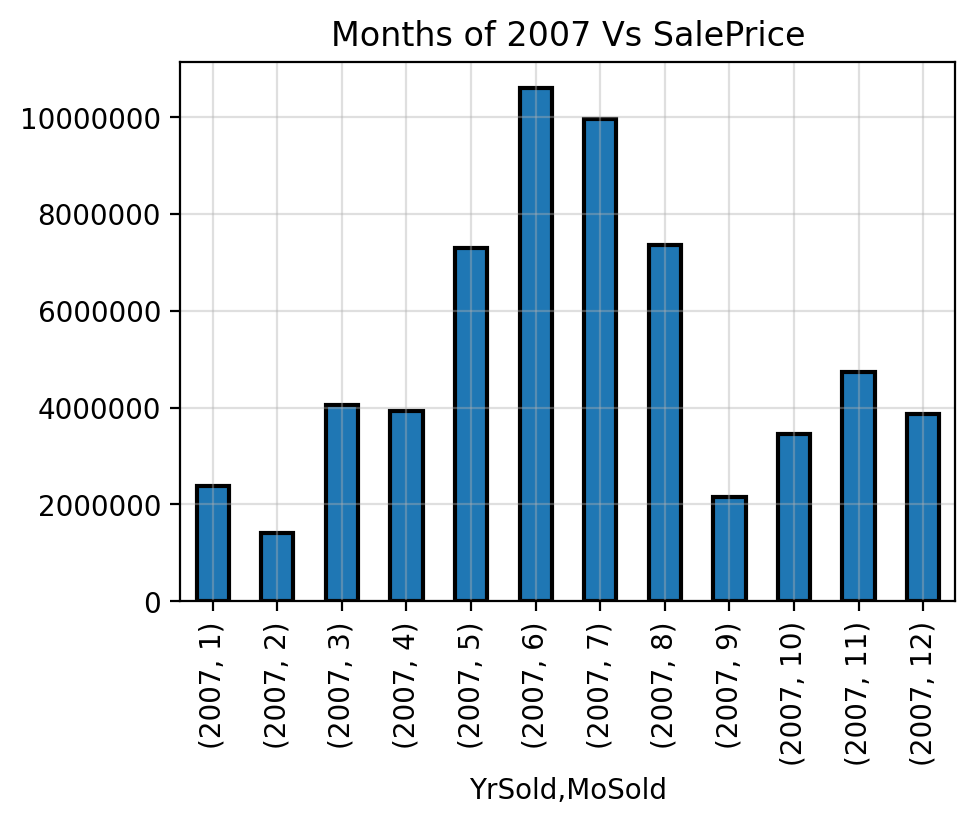

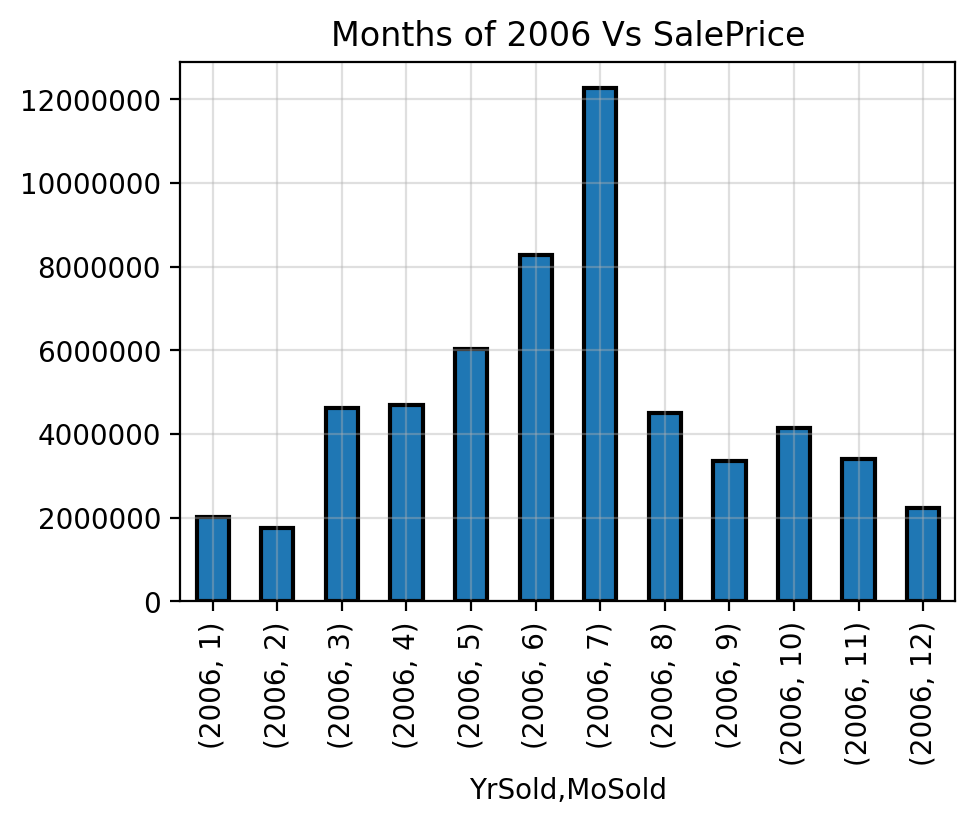

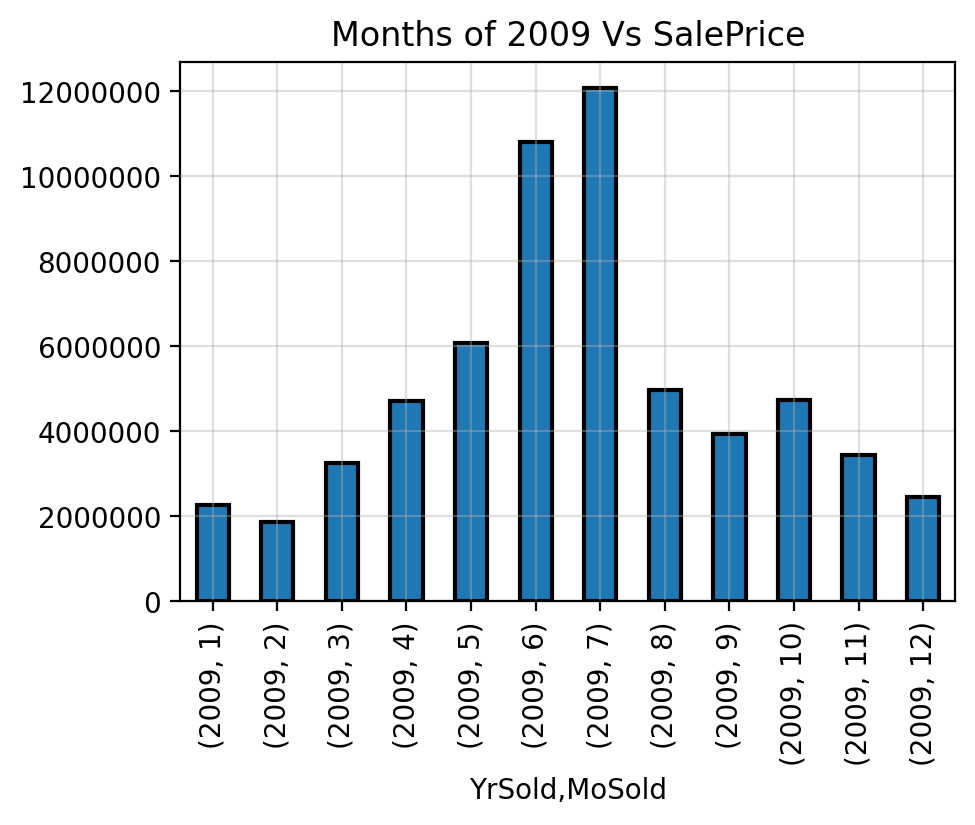

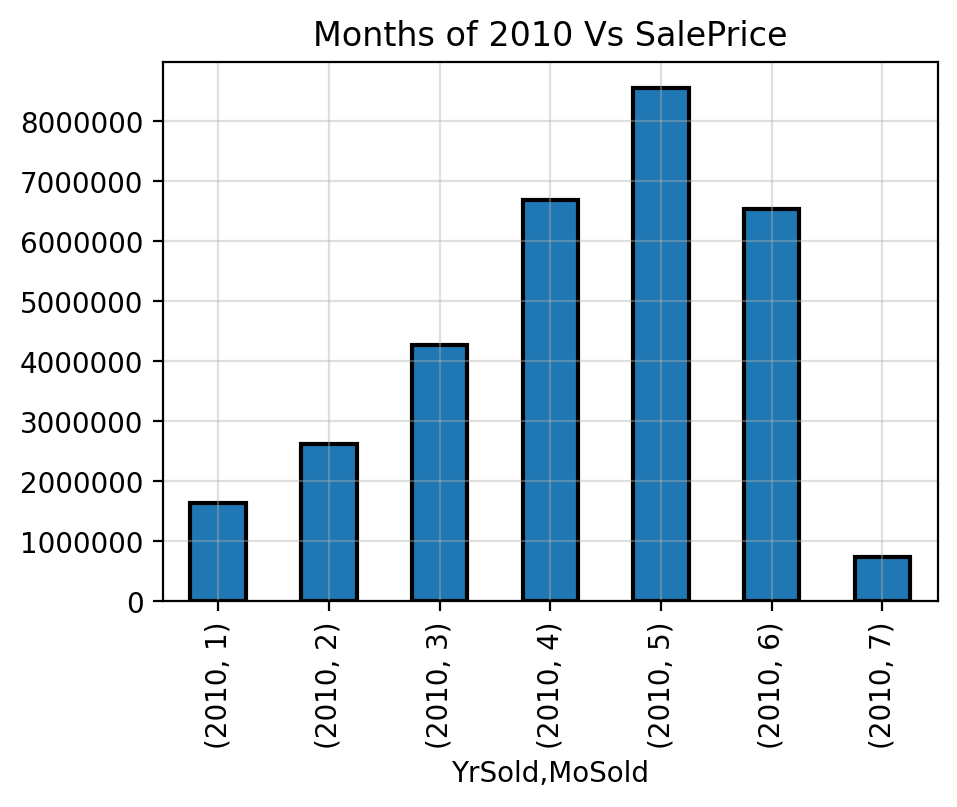

In [23]:
#Plot each column with nan and see it's relation with our target (SalePrice)

for each in train.YrSold.unique():
    
    #Deep copy of df - (Not by reference)
    df_copy = train.copy(deep=True)

    #Groupby the feature based on SalePrice median and plot
    plt.figure(figsize=(5,3.5))
    
    df_copy[df_copy.YrSold == each].groupby(['YrSold',
                                             'MoSold'])['SalePrice'].sum().plot(kind='bar', 
                                                                                   edgecolor = 'black',
                                                                                   linewidth=1.5)
    plt.title(f'Months of {each} Vs SalePrice')
    plt.ticklabel_format(style='plain', axis='y') #Disable scientific notation;
    plt.grid(alpha=0.4)
    plt.show

We can see that in this middle of the year the sells are higher most of the time except 2010.

---

# Quantitative data

## Discrete Data


Get the discrete features

In [24]:
#When a feature has <25 nunique items it will be counted as discrete else continuous
disc_features = [x for x in numeric_features if train[x].nunique() < 25 and x not in year_features]
print(disc_features)

['MSSubClass', 'OverallQual', 'OverallCond', 'LowQualFinSF', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', '3SsnPorch', 'PoolArea', 'MiscVal', 'MoSold']


## Visualize the relationship between discrete features and Target

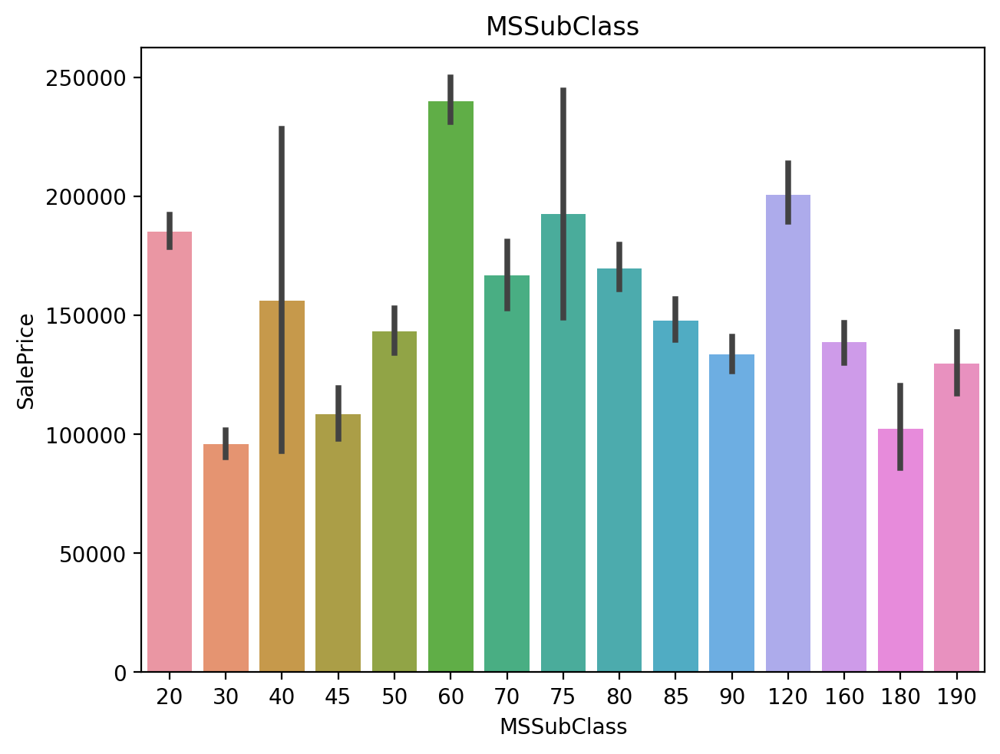

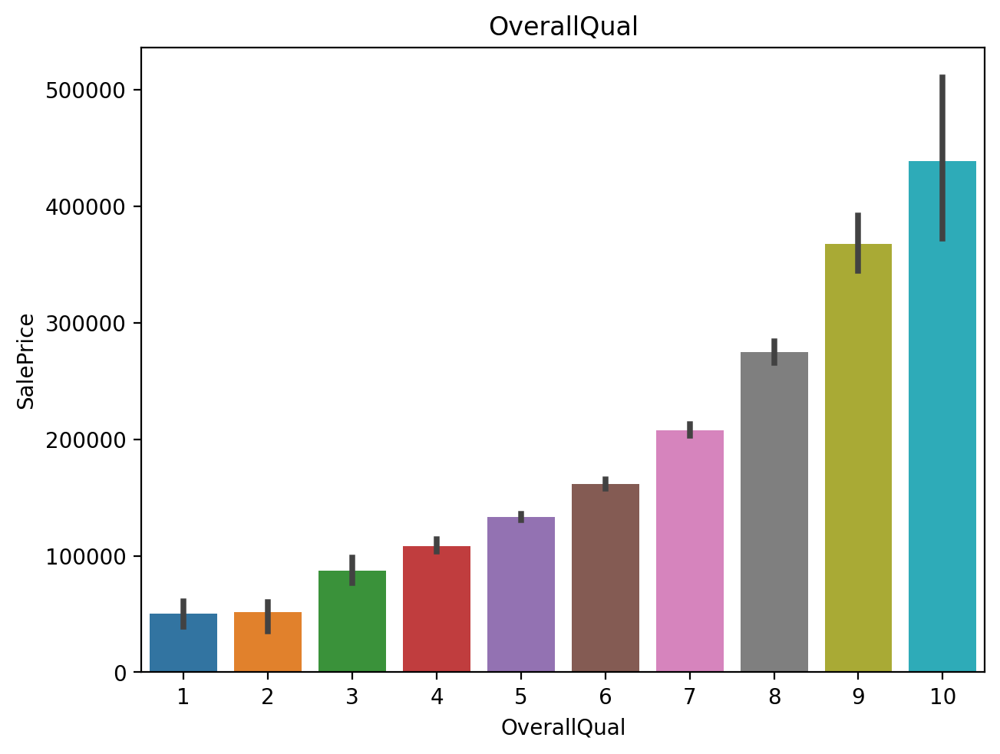

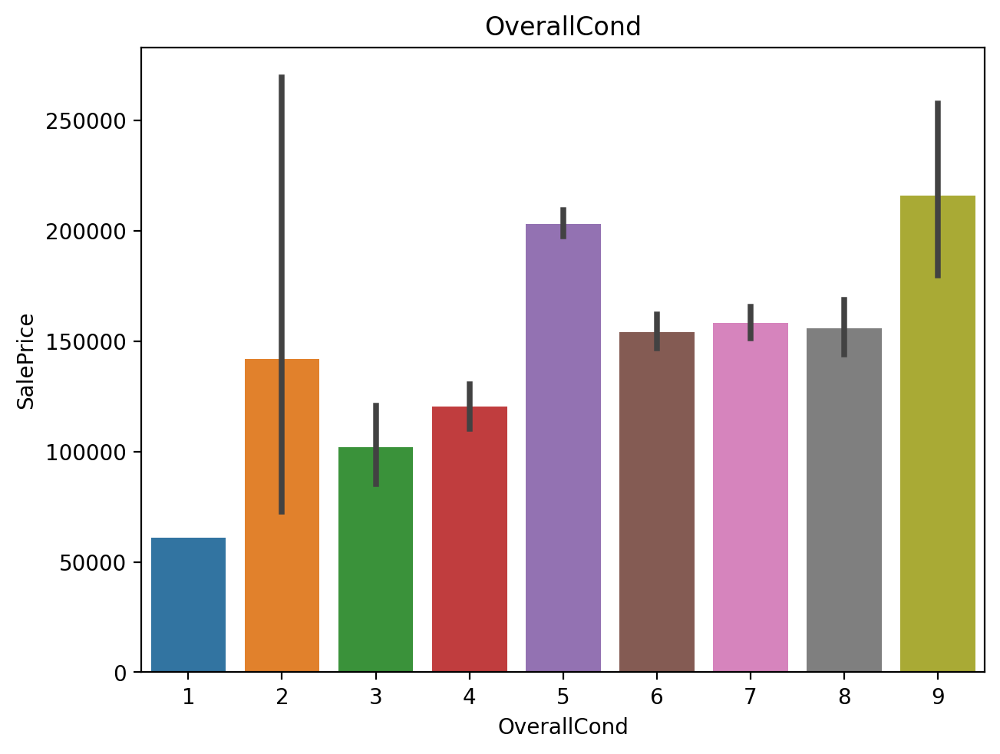

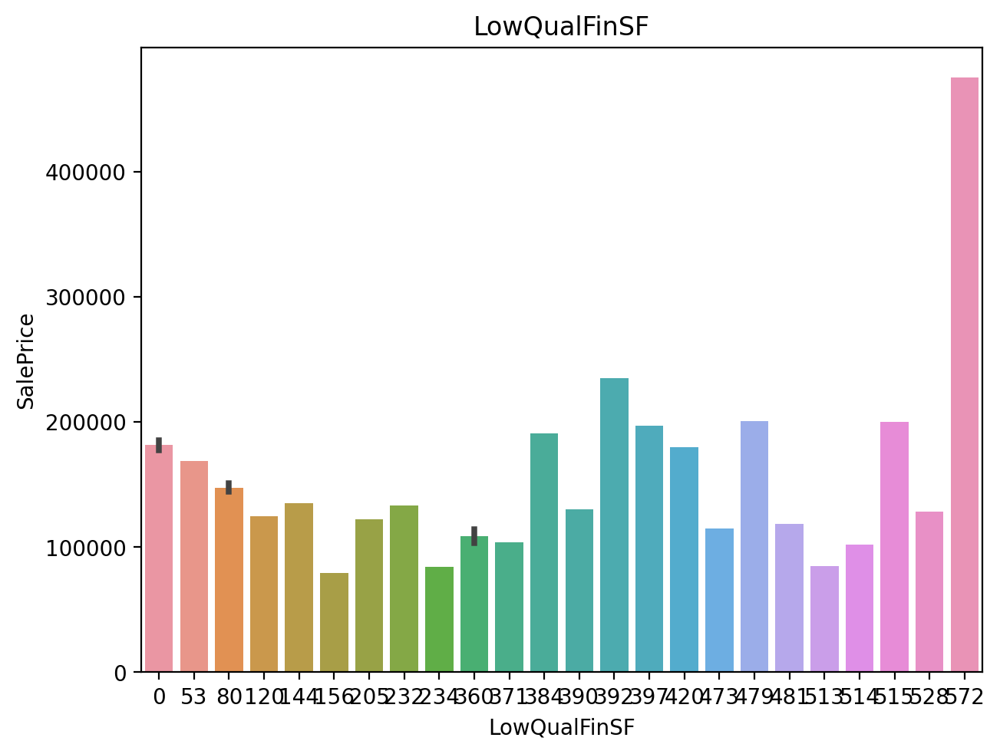

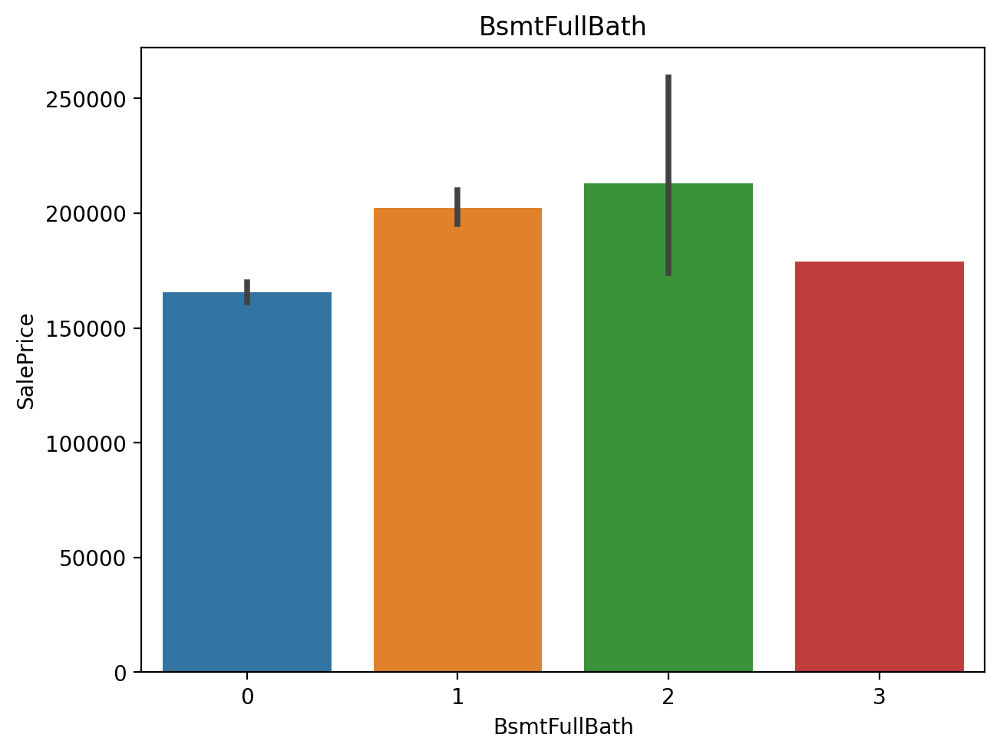

...

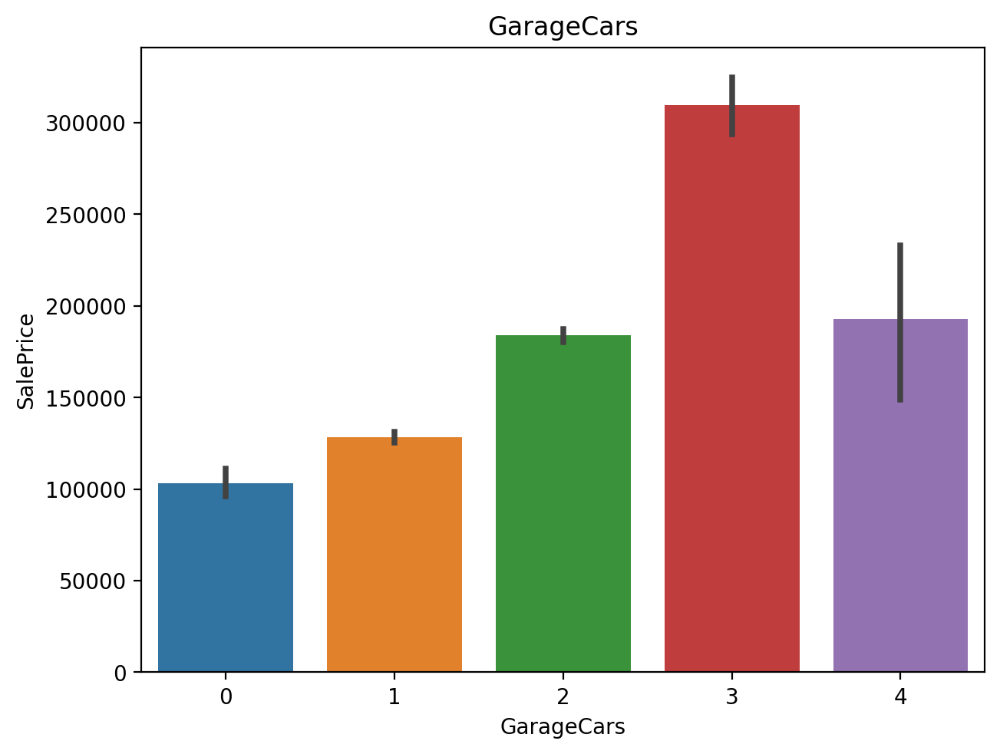

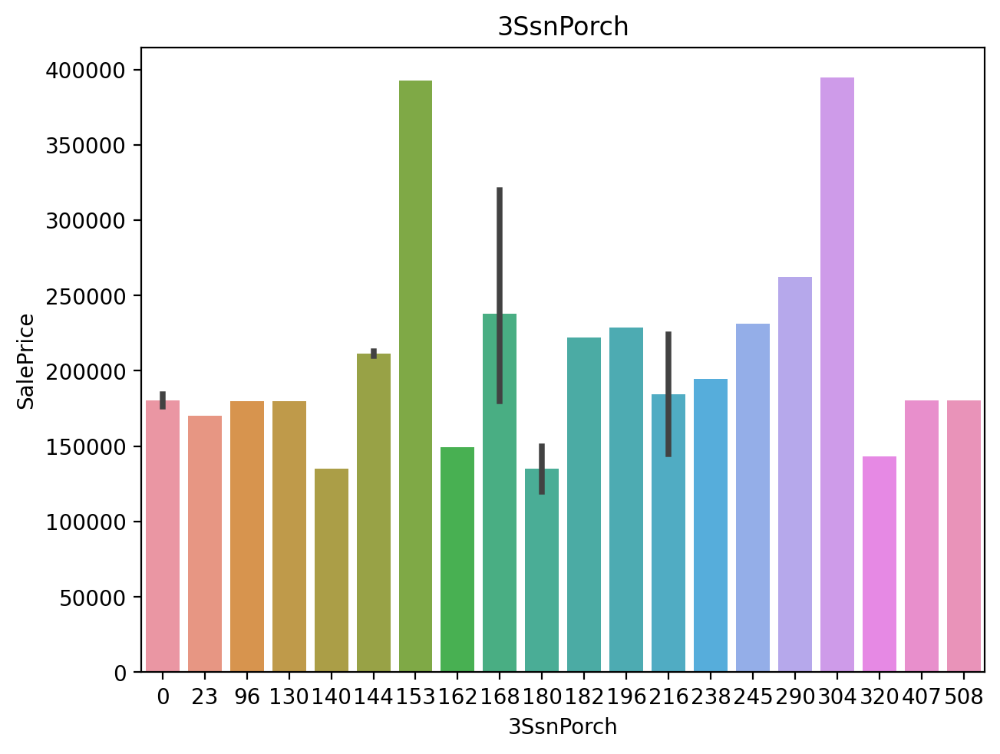

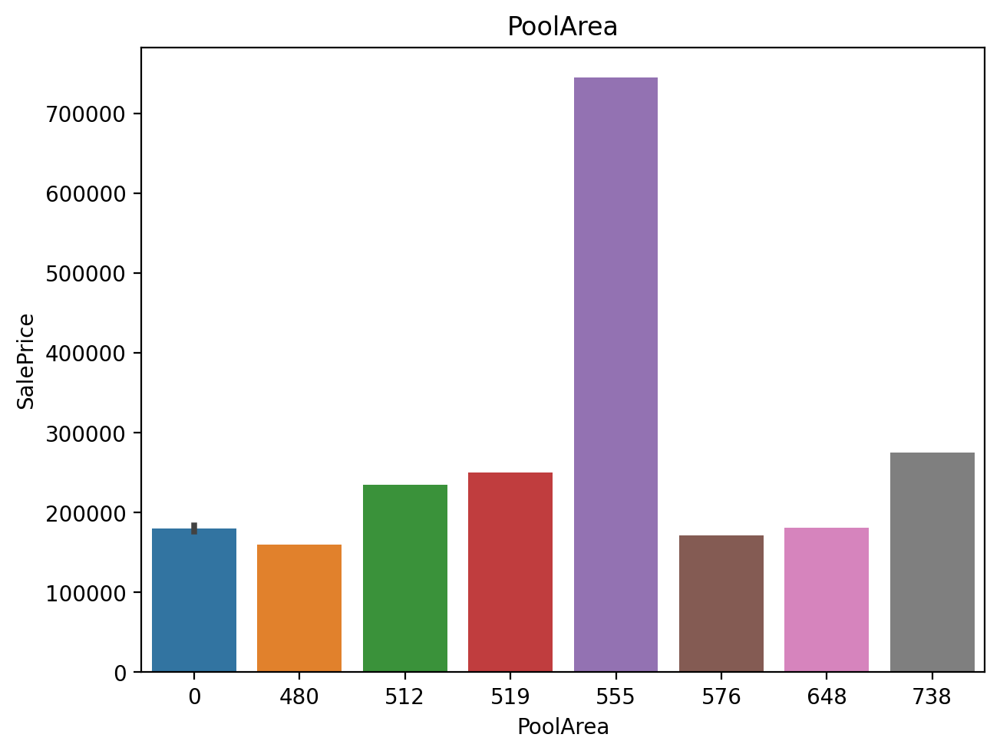

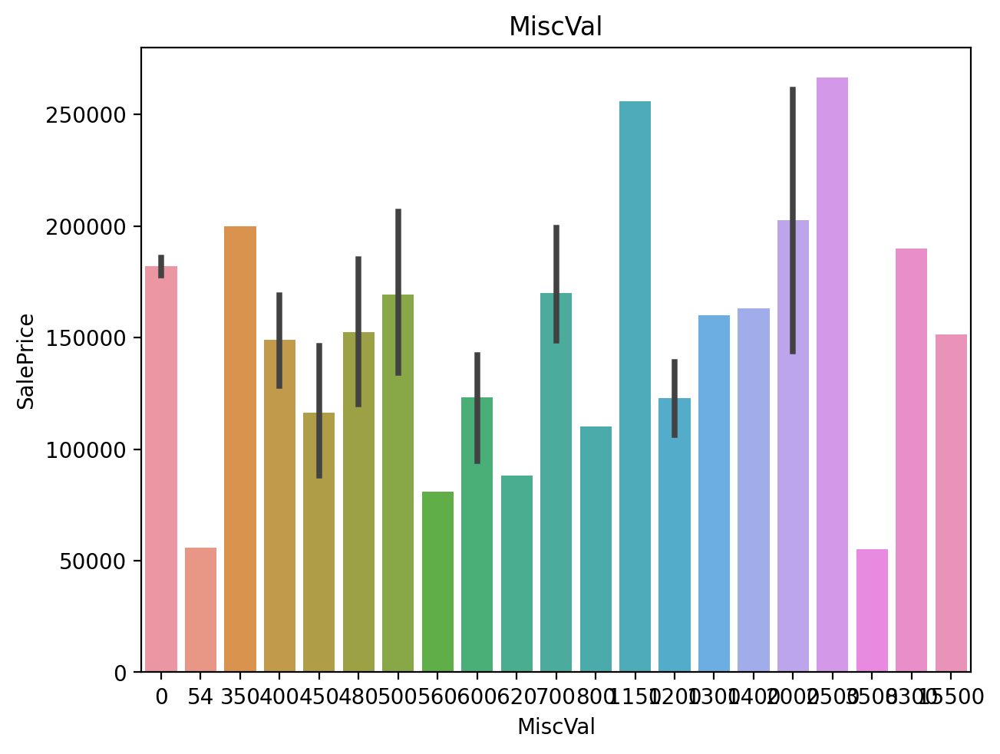

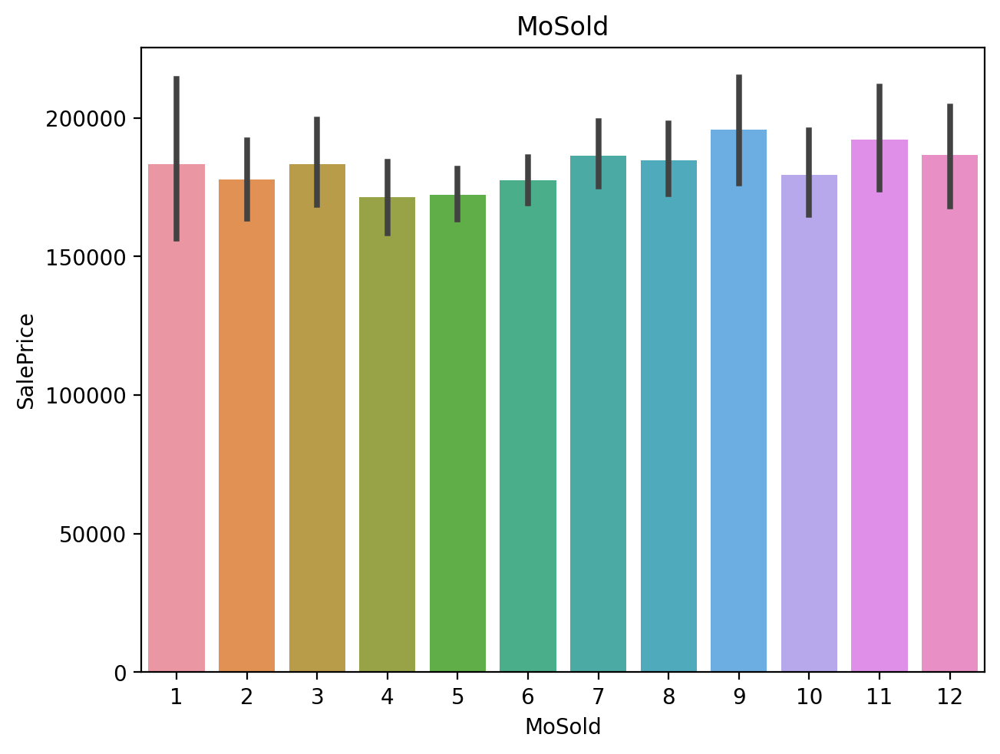

In [25]:
for feat in disc_features:
    plt.figure(constrained_layout=True)
    sns.barplot(train[feat], train.SalePrice)
    plt.title(feat)
    plt.ticklabel_format(style='plain', axis='y') #Disable scientific notation;
    plt.show() 

OverallQual, OverallCond, FullBath, TotRmsAbvGrd and GarageCars have stong relation with SalePrice.

---

# Continuous Data

In [26]:
#Get the cont features
cont_features = [x for x in numeric_features if x not in disc_features and x not in year_features]
print(f'Continuous features count = {len(cont_features)}\n\n {cont_features}')

Continuous features count = 16

 ['LotFrontage', 'LotArea', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', 'ScreenPorch', 'SalePrice']


## Plot the distribution of Cont features

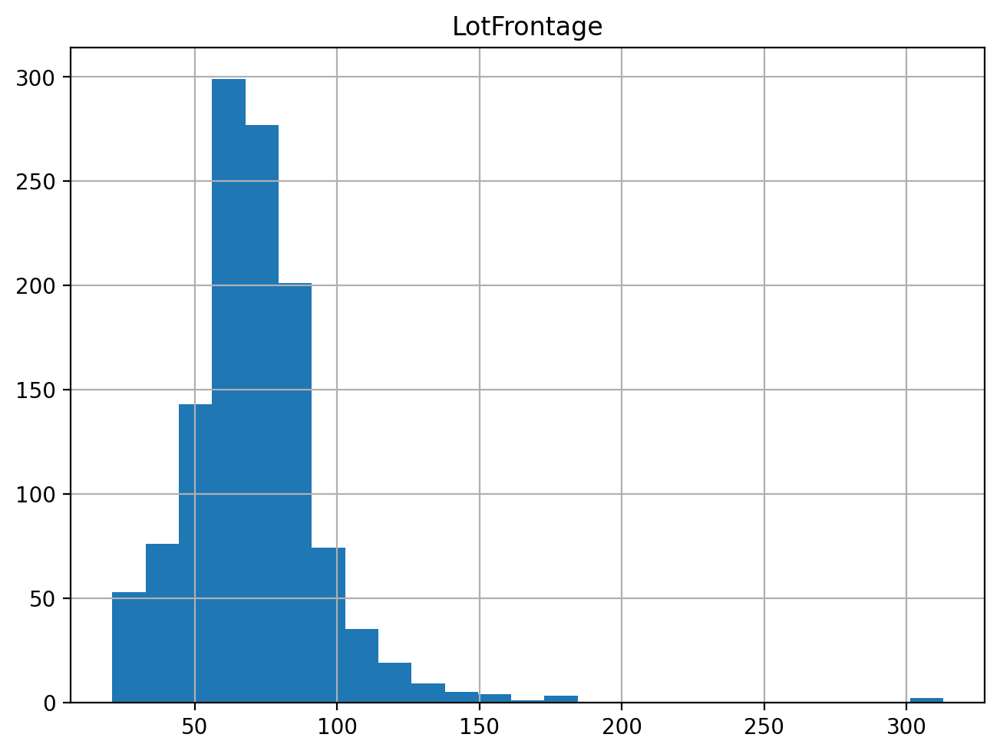

LotFrontage skew is = 2.163569142324884


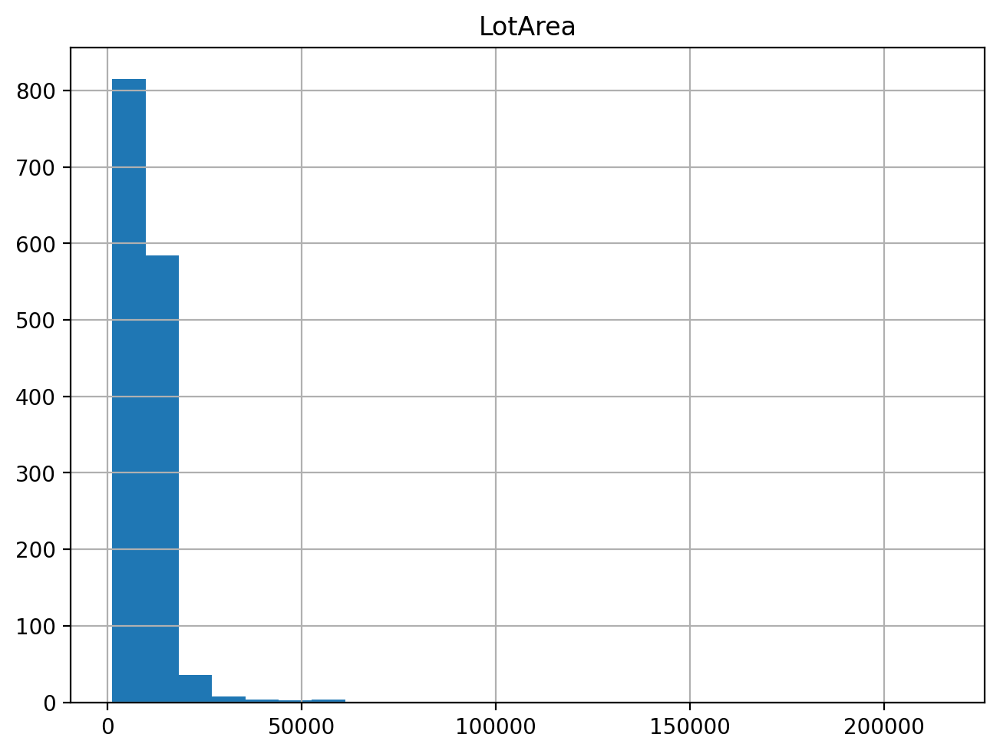

LotArea skew is = 12.207687851233496


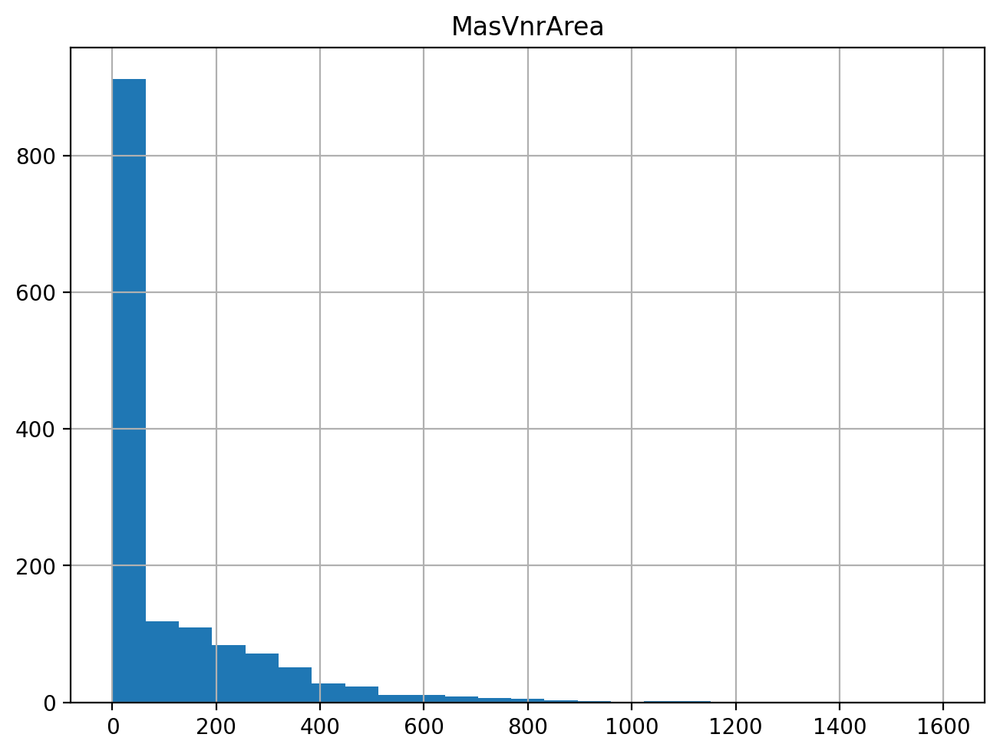

MasVnrArea skew is = 2.669084210182863


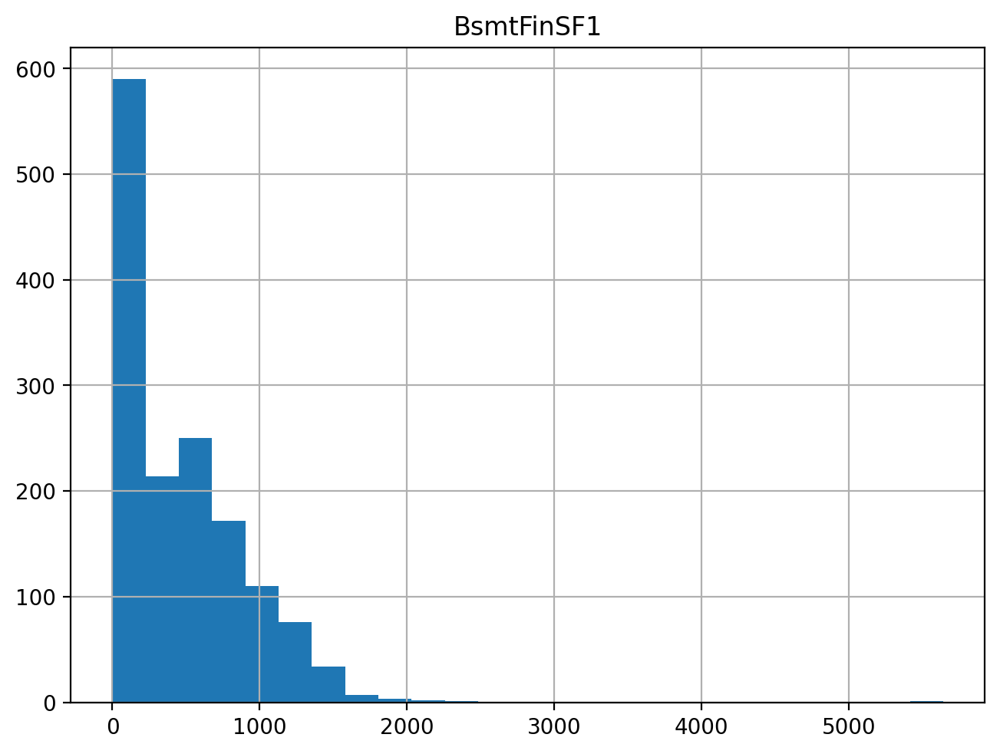

BsmtFinSF1 skew is = 1.685503071910789


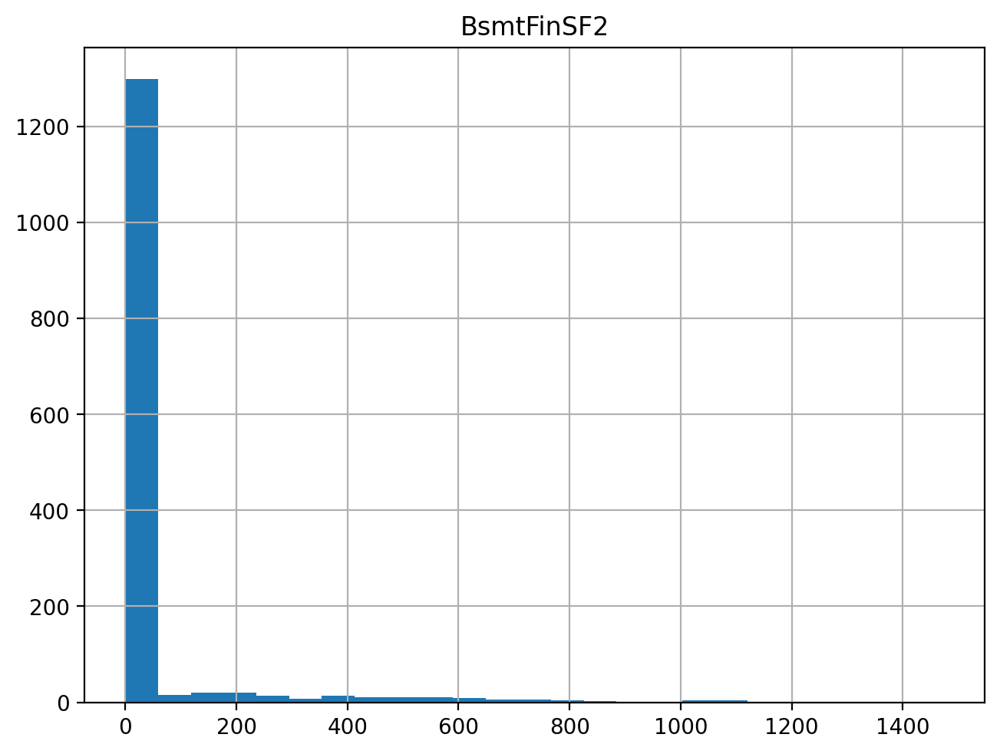

BsmtFinSF2 skew is = 4.255261108933303


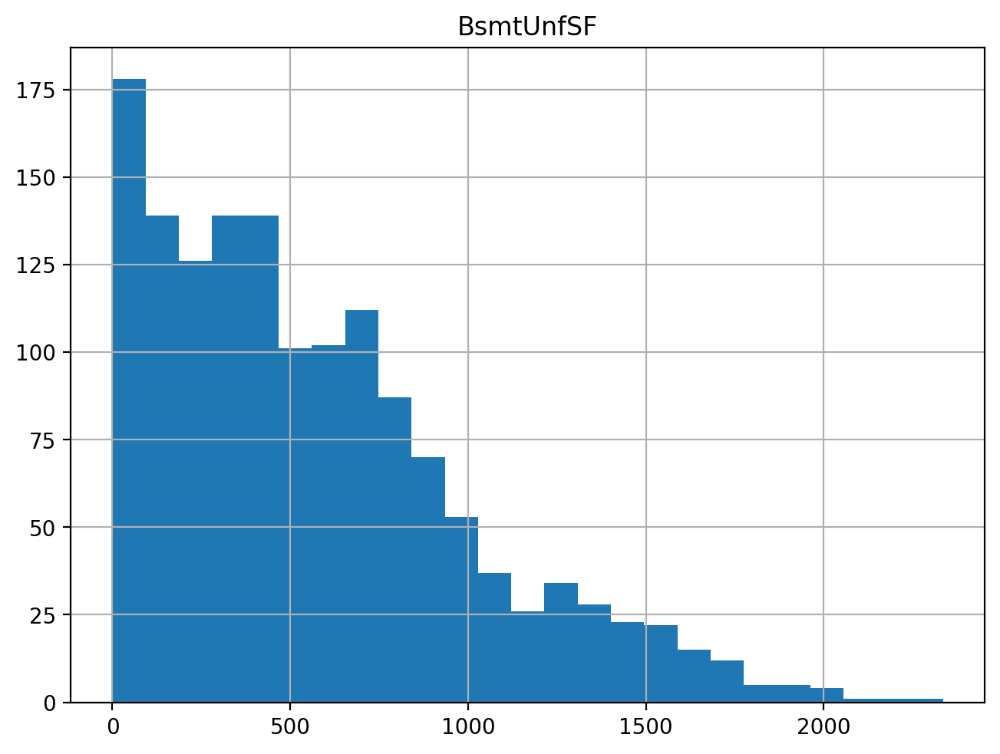

BsmtUnfSF skew is = 0.9202684528039037


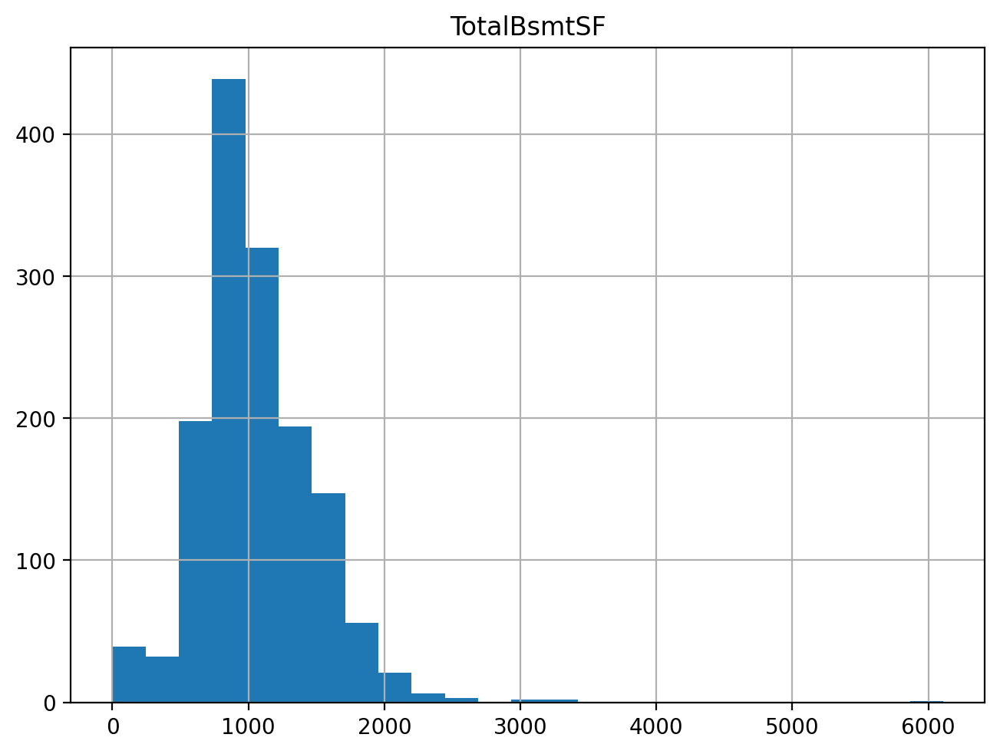

TotalBsmtSF skew is = 1.5242545490627664


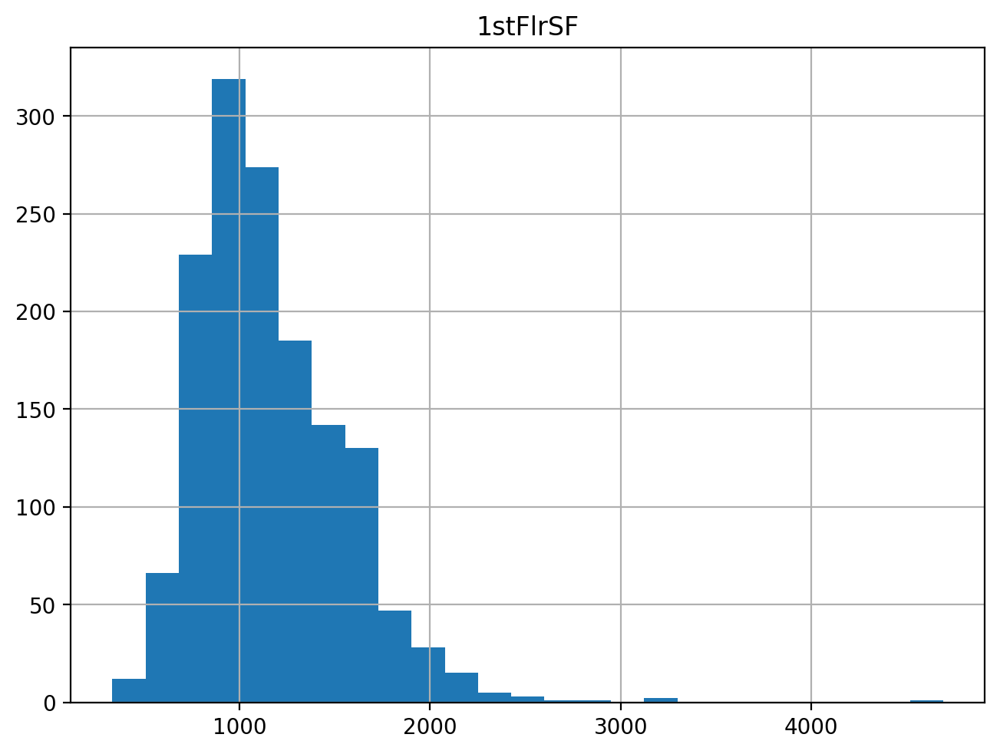

1stFlrSF skew is = 1.3767566220336365


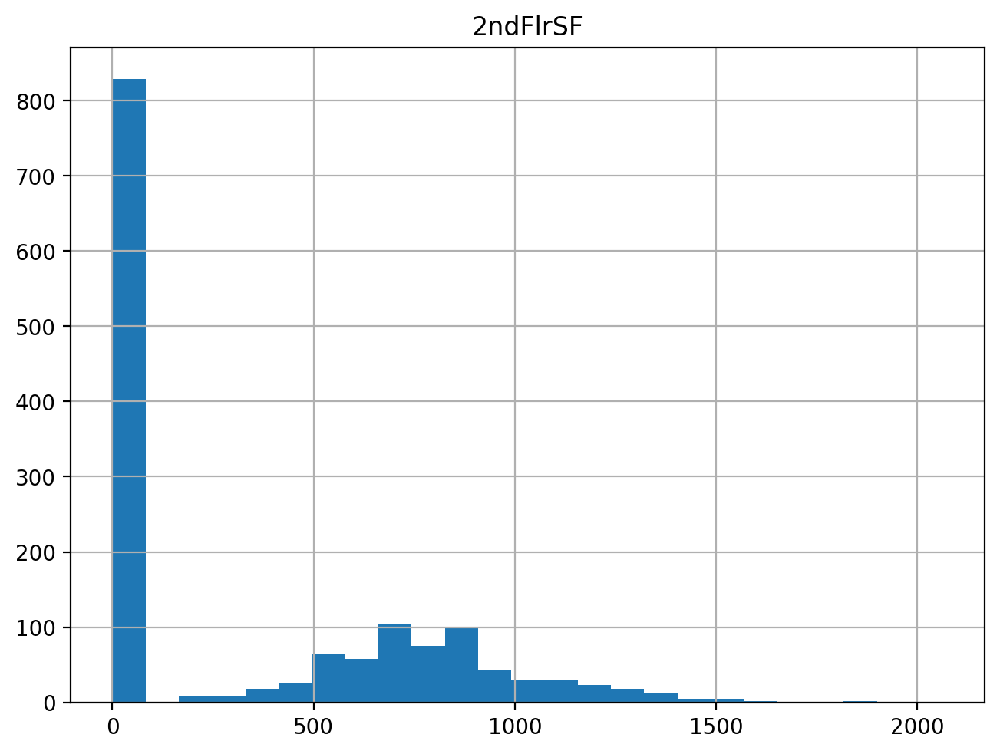

2ndFlrSF skew is = 0.8130298163023265


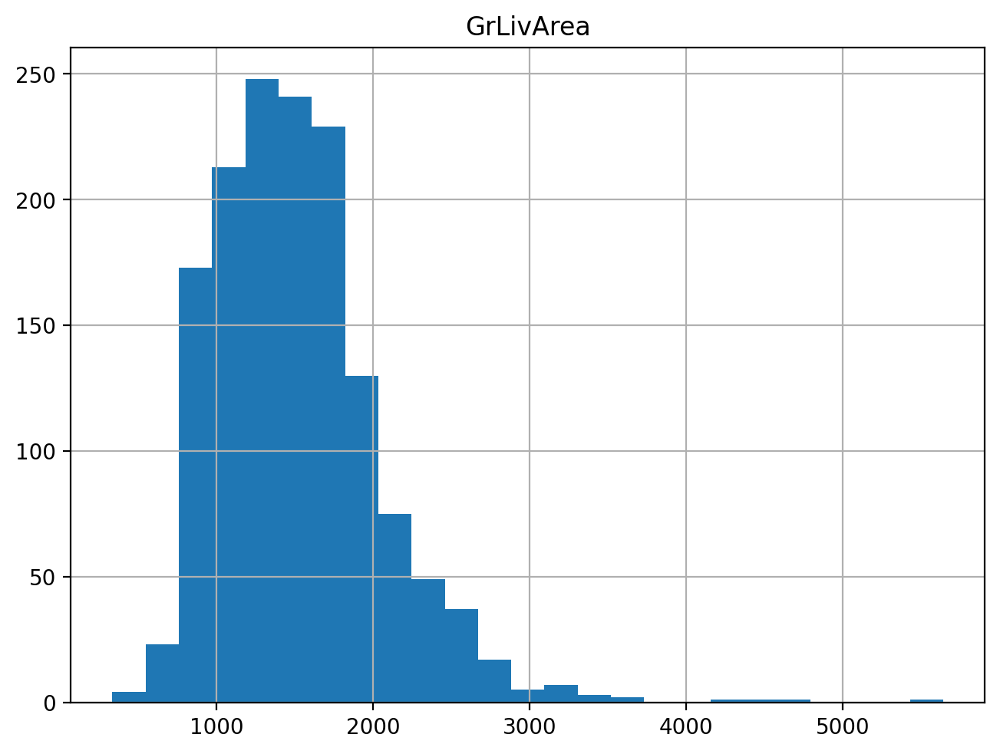

GrLivArea skew is = 1.3665603560164552


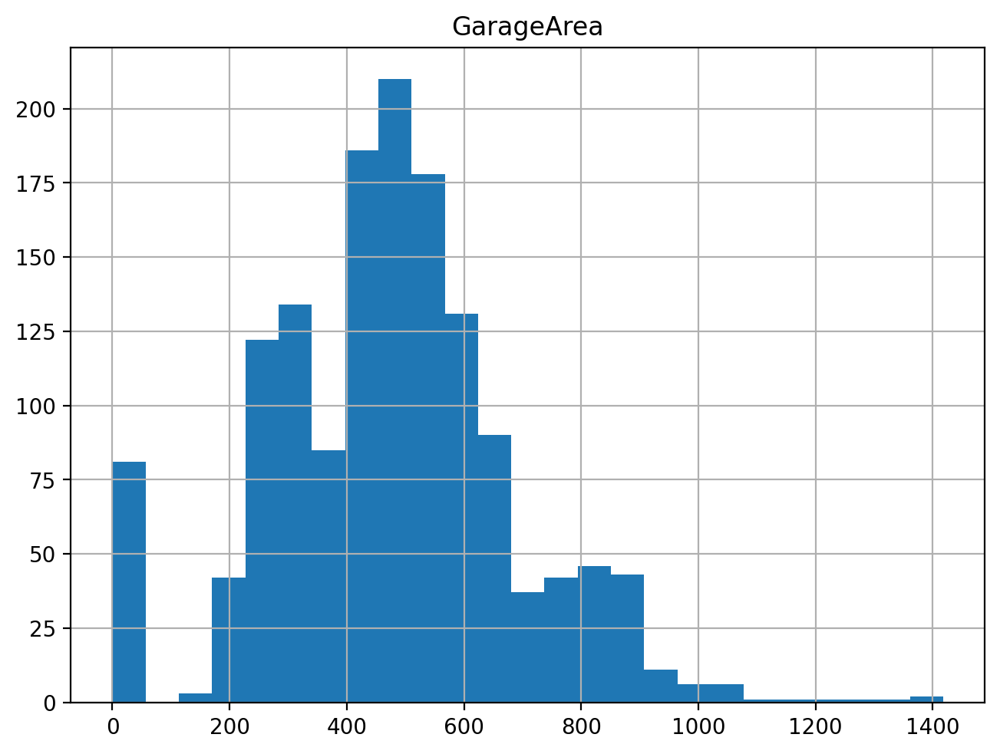

GarageArea skew is = 0.17998090674623907


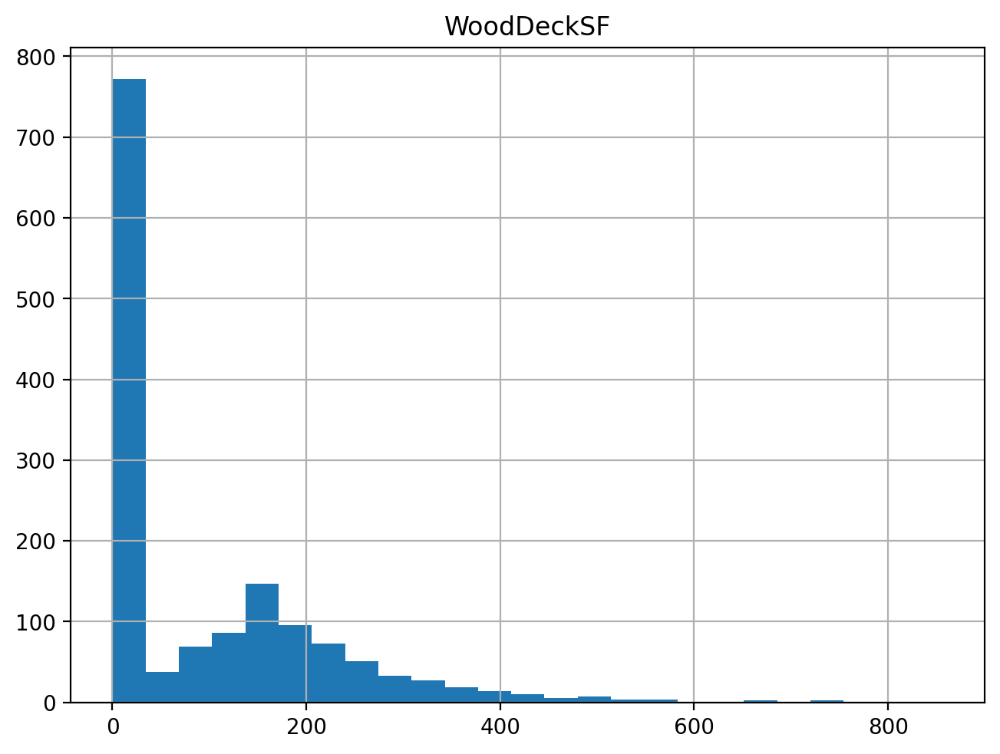

WoodDeckSF skew is = 1.5413757571931312


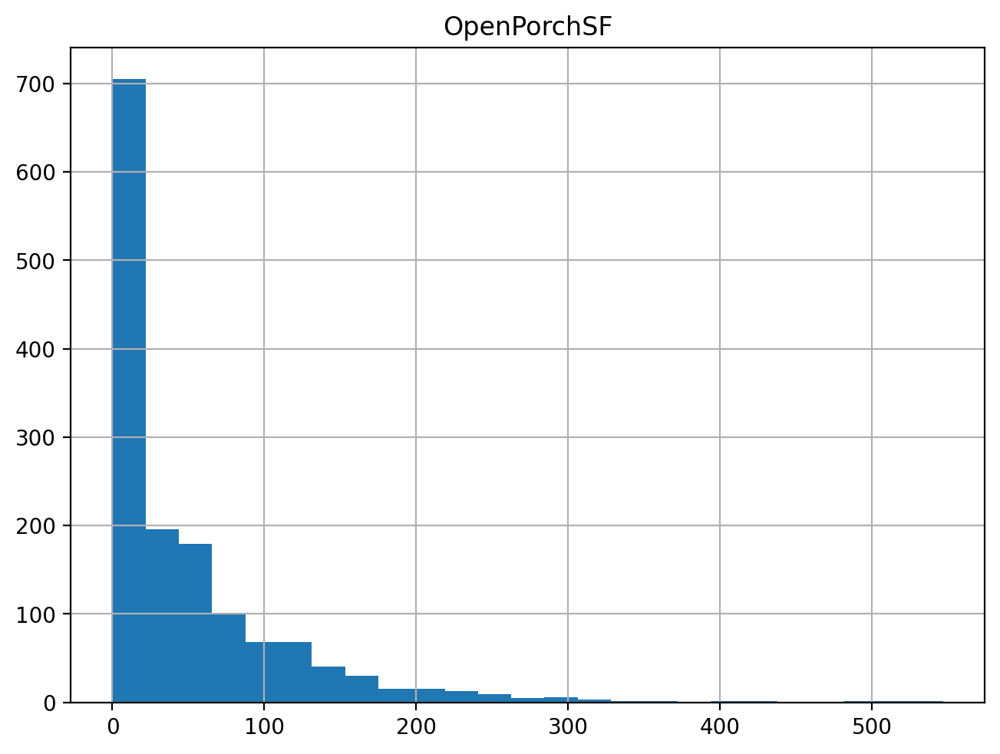

OpenPorchSF skew is = 2.3643417403694404


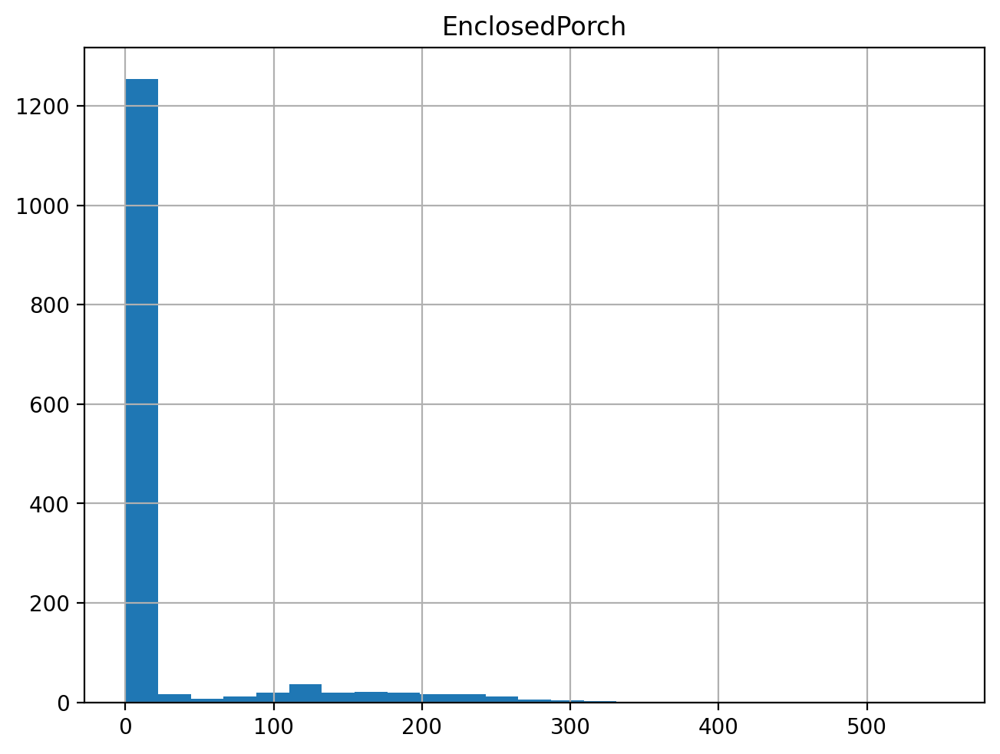

EnclosedPorch skew is = 3.08987190371177


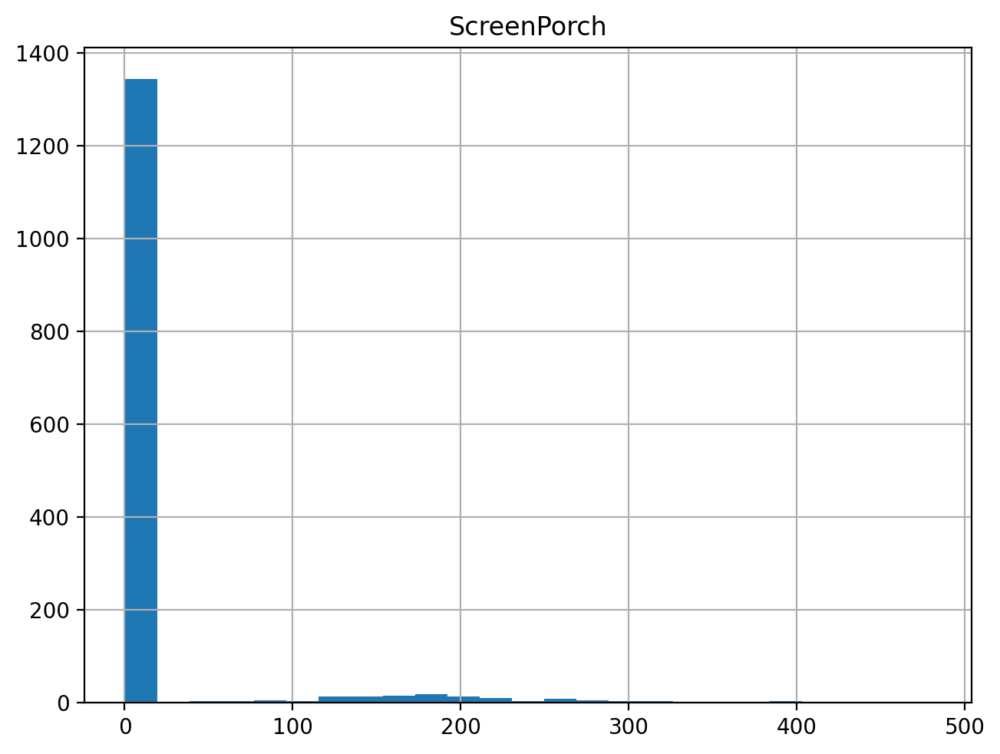

ScreenPorch skew is = 4.122213743143115


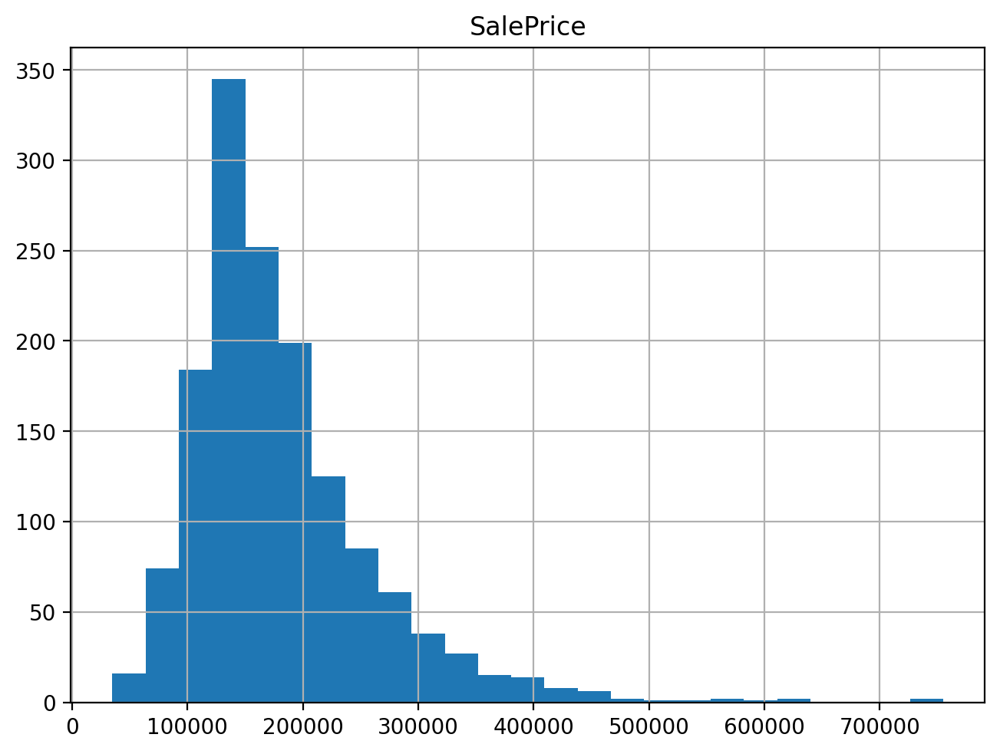

SalePrice skew is = 1.8828757597682129


In [27]:
#plot every column sin the lsit
for feat in cont_features:
    plt.figure(constrained_layout=True)
    train[feat].hist(bins=25)
    plt.title(feat)
    plt.ticklabel_format(style='plain', axis='y') #Disable scientific notation;
    plt.show() 
    print(f'{feat} skew is = {train[feat].skew()}')

Most of our data is skewed, and it's right skewed. So we need to do Standrize, or transform it. because it will be helpful whenever we're doing a Linear regression model.

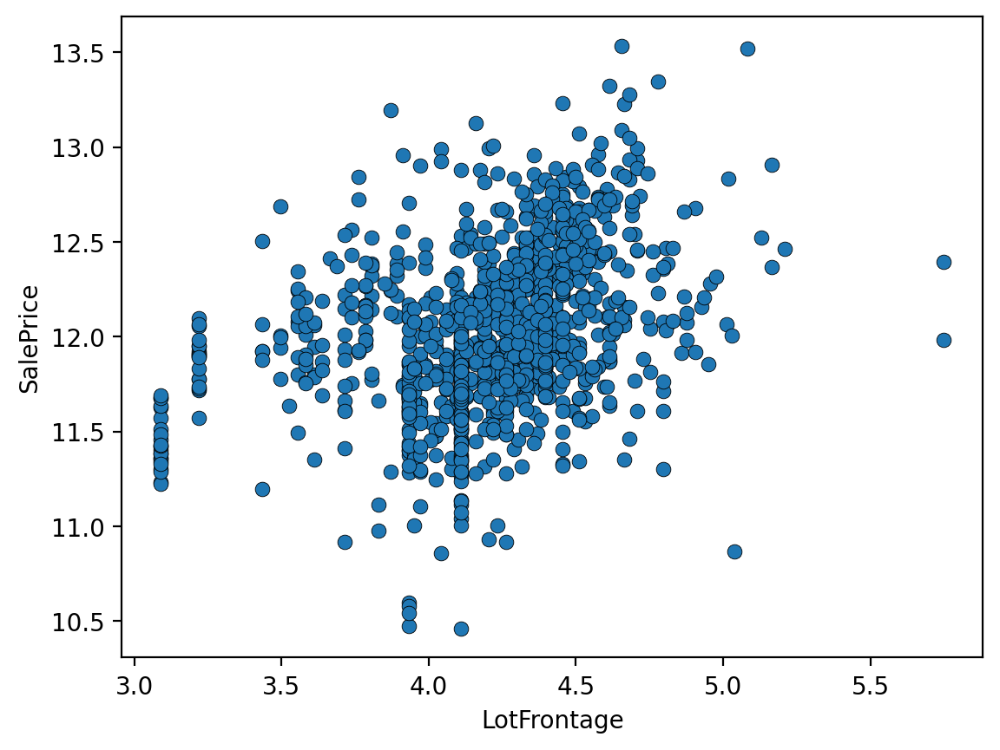

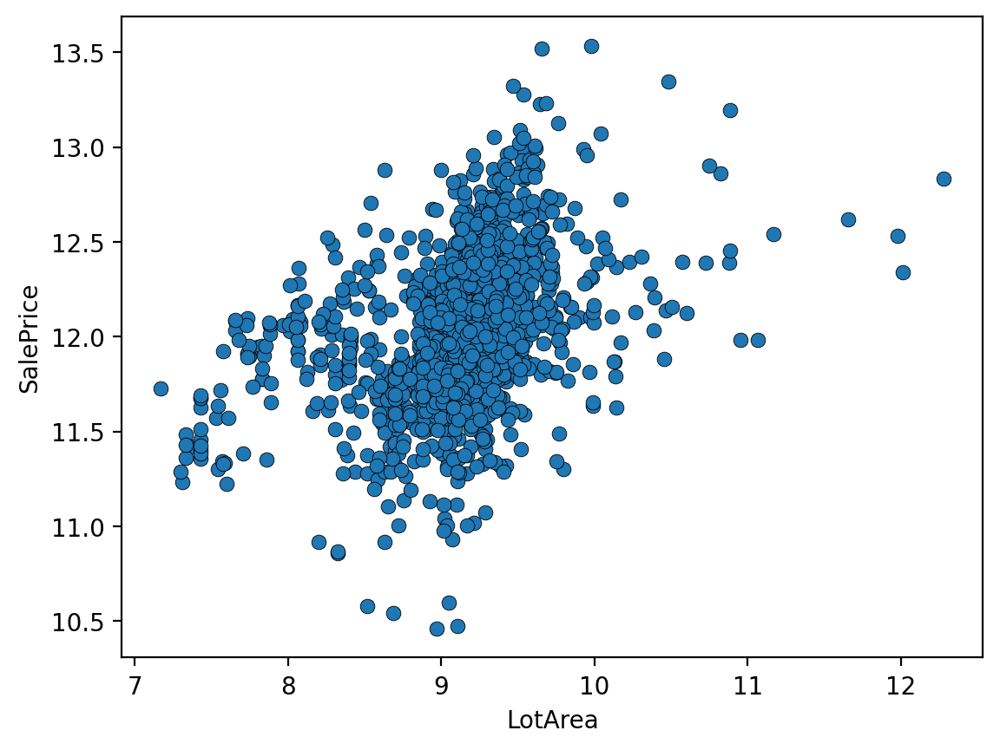

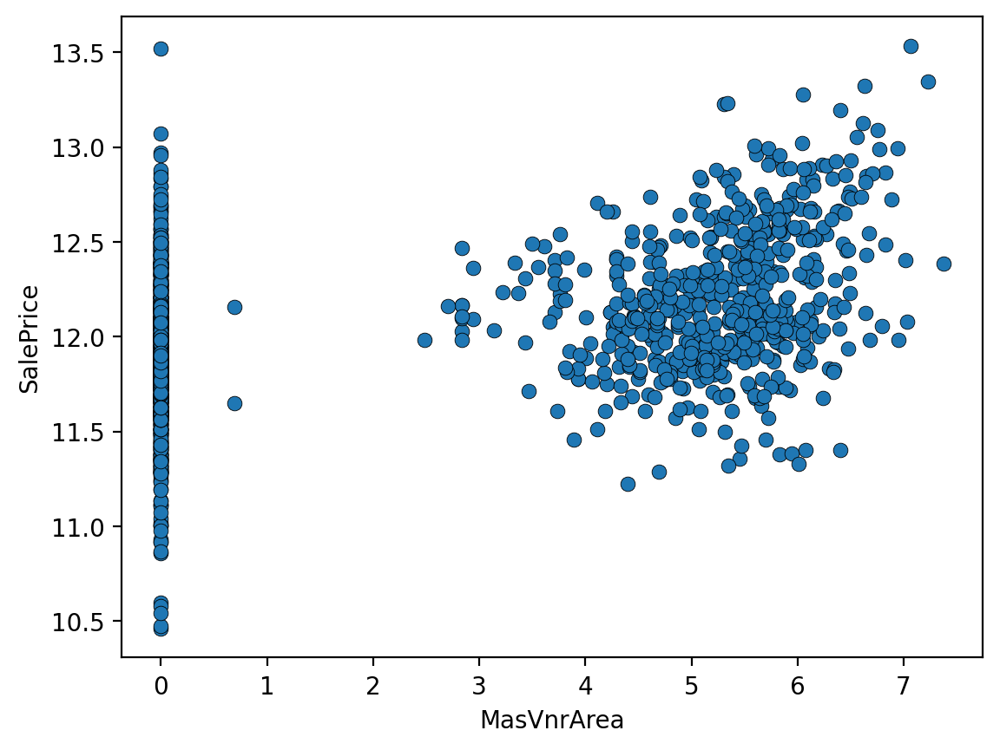

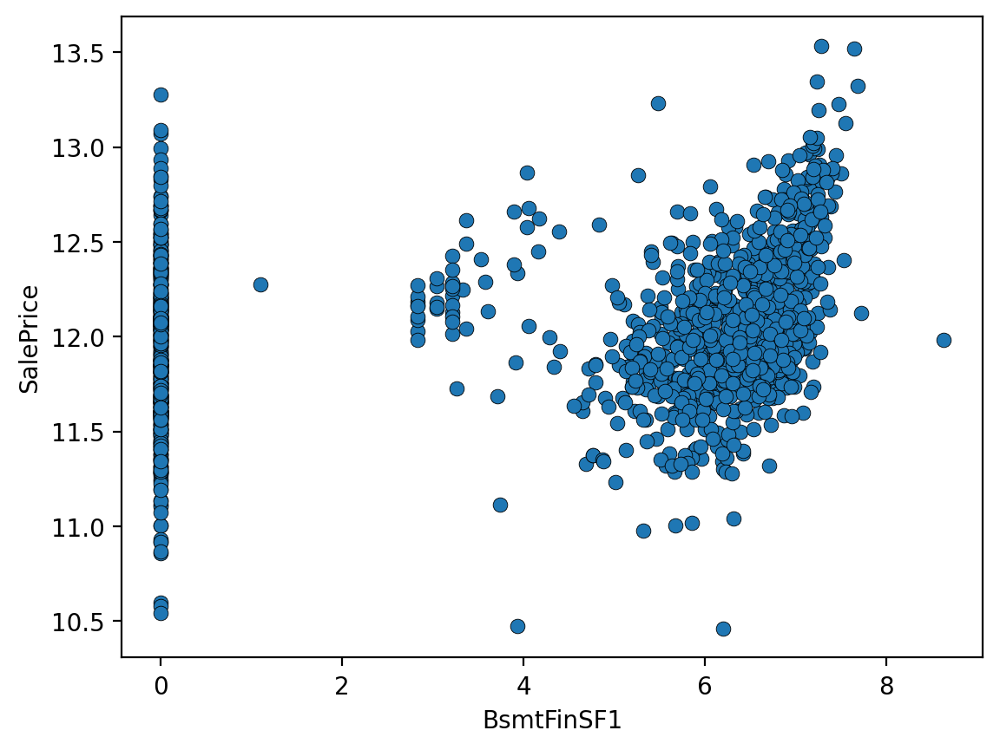

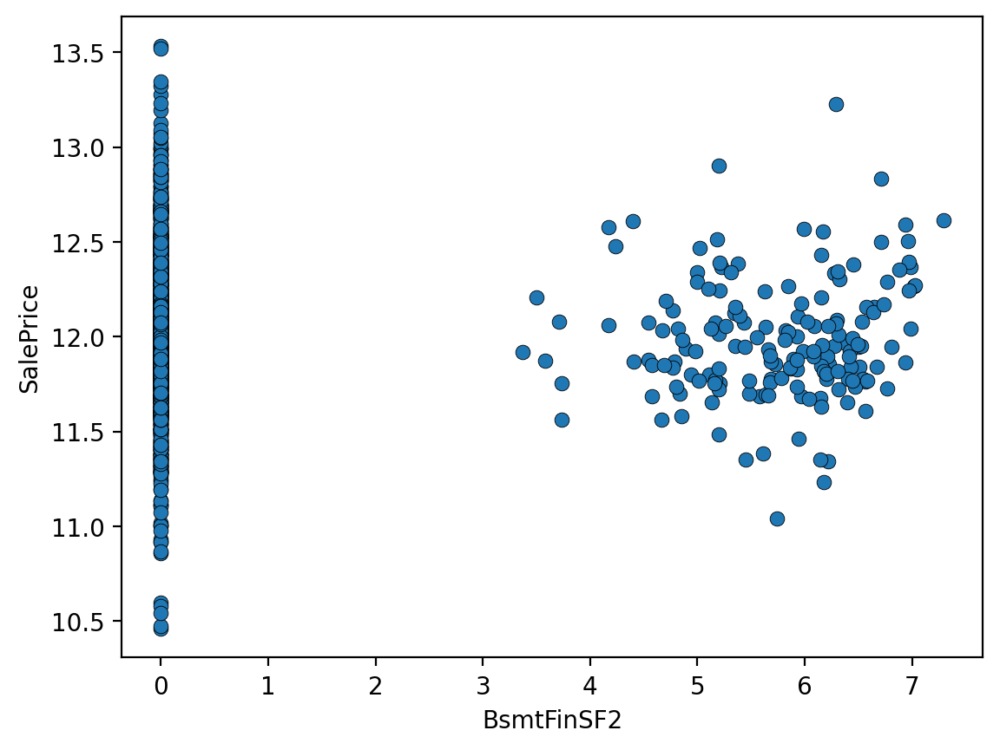

...

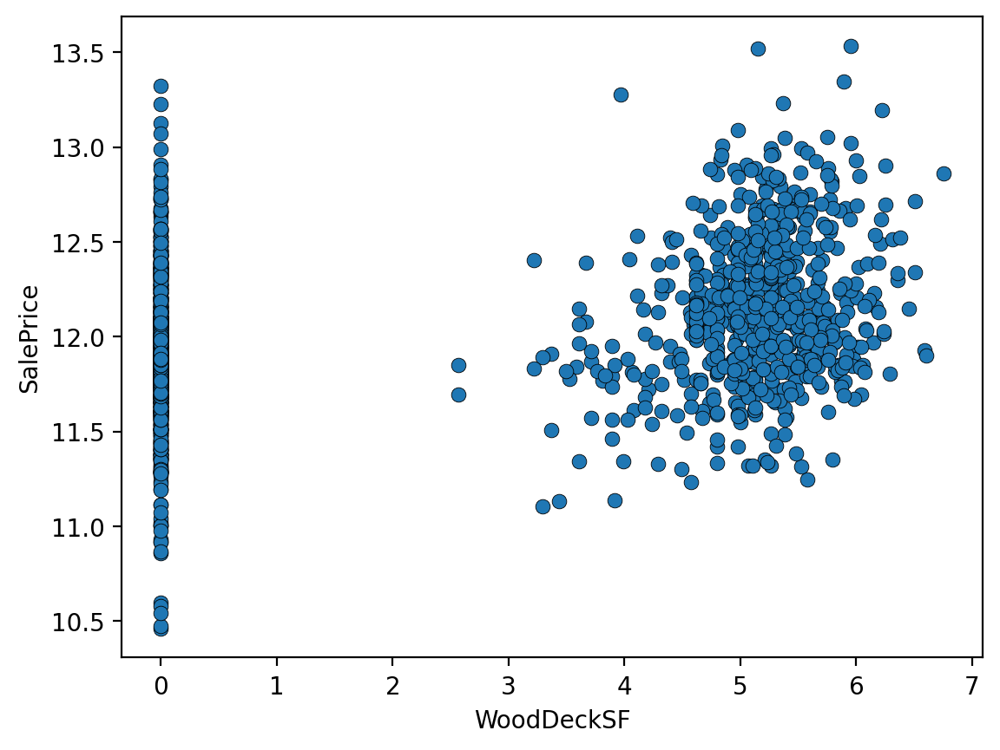

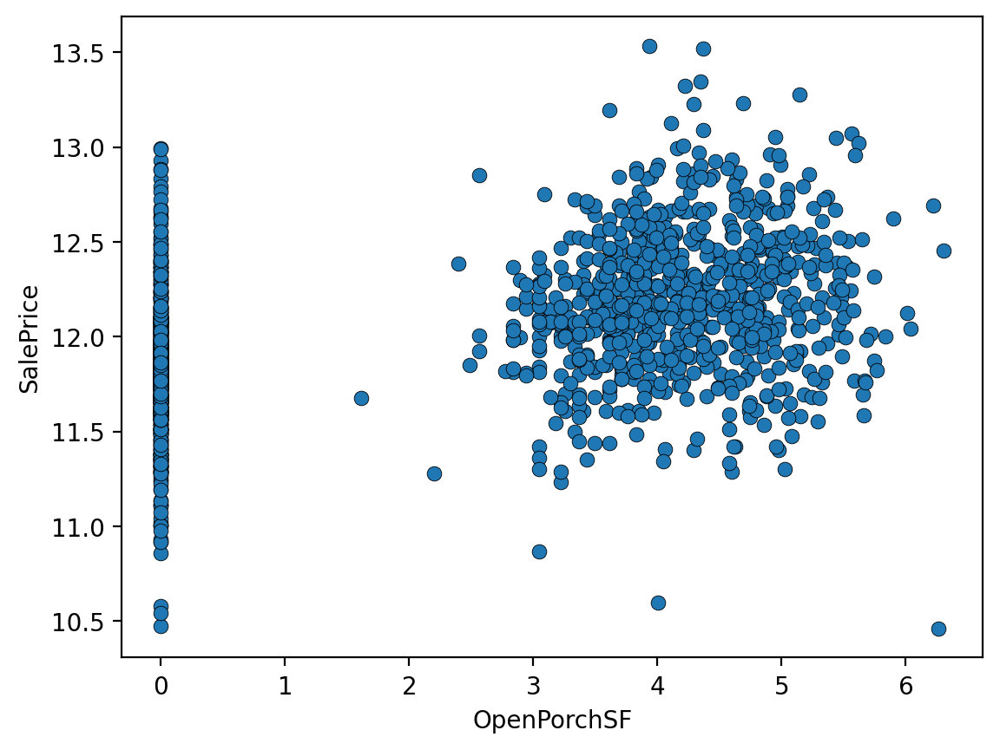

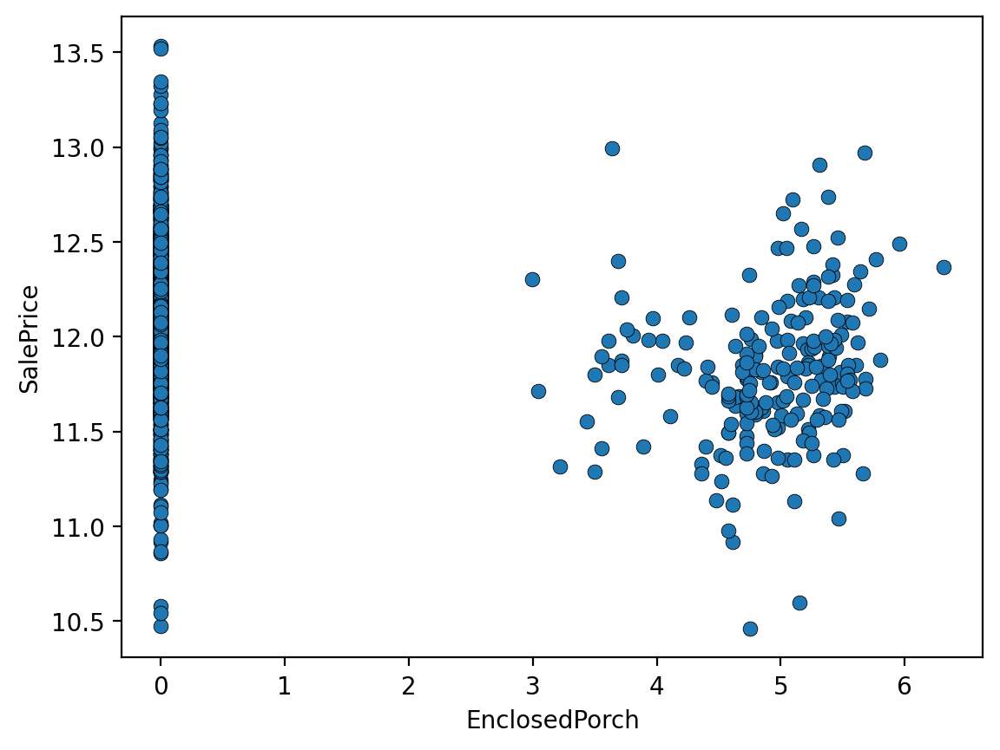

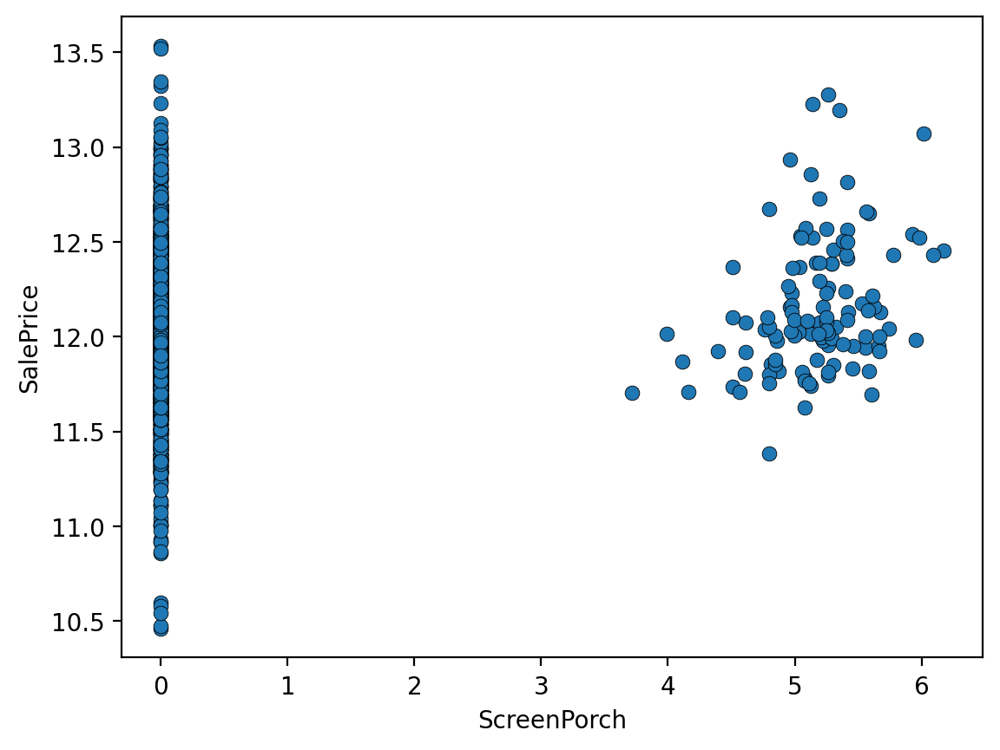

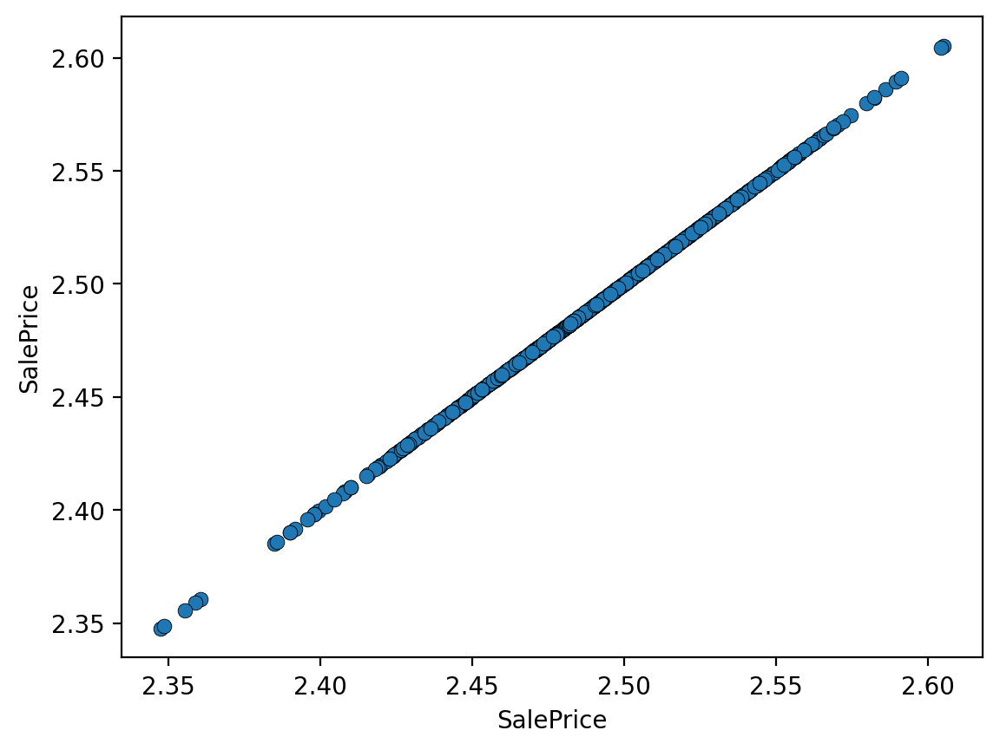

In [28]:
#transform the data by taking the log1p of each column
for feat in cont_features:
    data = train.copy(deep=True)
    
    # applying logarithm function
    data[feat] = np.log1p(data[feat])
    data['SalePrice'] = np.log(data['SalePrice'])

    sns.scatterplot(data[feat], data['SalePrice'], edgecolor='black', linewidth=0.3)

    plt.xlabel(feat)
    plt.ylabel('SalePrice')
    plt.show()

It looks better now, and readbale, whenever the value increase the price increase, the stright line of points is where thier values are 0's.

# Collinearity and MultiCol

In [29]:
# Generate a mask for the upper triangle (taken from seaborn example gallery)
mask = np.zeros_like(train.corr(), dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

plt.figure(figsize=(50, 40))

sns.heatmap(train.corr(), 
            annot=True,
            fmt=".3f",
            cmap='PiYG',
            annot_kws = {"size":19, "va": "center_baseline", "color":"black"}, 
            mask=mask,
            cbar_kws={"shrink": 1},
            linewidths=1,
            linecolor='black')

plt.xticks(horizontalalignment='center', fontsize=30)
plt.yticks(verticalalignment='center', fontsize=30);

**High and Multi**
- OverallQual and SalePrice  = 0.791
- 1stFlrSF and TotalBsmtSF   = 0.820
- GrLivArea and SalePrice    = 0.709
- TotRmsAbvGrd and GrLivArea = 0.825
- GarageYrBlt and YearBuilt  = 0.826
- GarageArea and GarageCars  = 0.882

----

# Categorical


In [30]:
categ_feature = [x for x in train.columns if train[x].dtypes == 'O']
print(categ_feature)

['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature', 'SaleType', 'SaleCondition']


In [31]:
train[categ_feature].head(0)

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition


In [32]:
#Print the number of categories per feature
pd.DataFrame(columns=["No_Categ"], data=train[categ_feature].nunique()).sort_values('No_Categ', ascending=False)

,No_Categ
Neighborhood,25
Exterior2nd,16
Exterior1st,15
SaleType,9
Condition1,9
Condition2,8
HouseStyle,8
RoofMatl,8
Functional,7
BsmtFinType2,6


### Visualize the relation of each category aginst target

In [1]:
for x in categ_feature:
    train.groupby(x)[['SalePrice']].median().sort_values('SalePrice').plot.bar( palette='RdBu', edgecolor='black', linewidth=2)

NameError: name 'categ_feature' is not defined

See summary

---

# Outliers

In [36]:
def stand_data(var):
    standard_data = (var-var.mean())/var.std() #standardization formula
    return standard_data

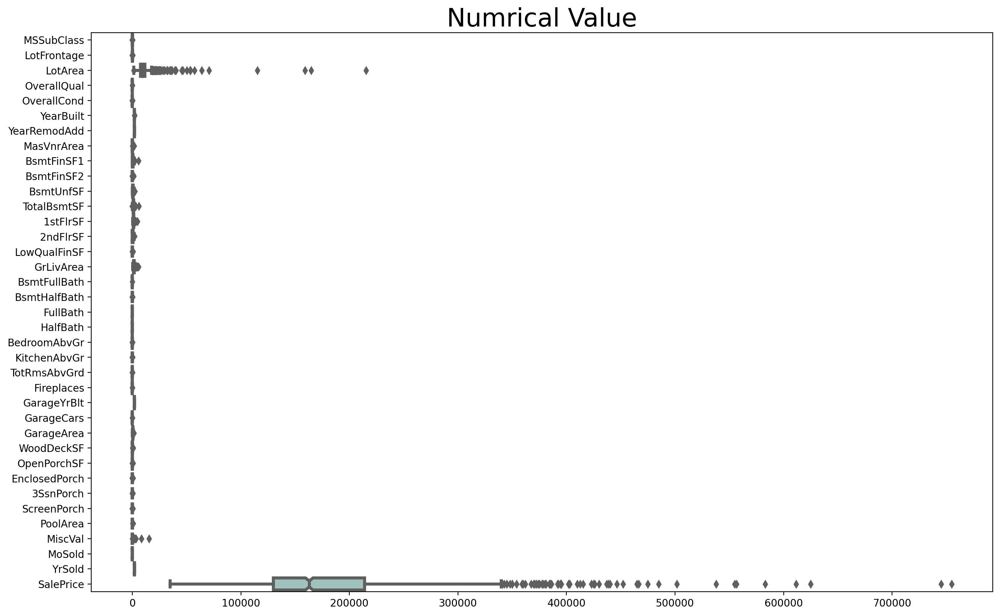

In [37]:
fig,ax=plt.subplots(figsize=(16,10))

sns.boxplot(data=train[numeric_features], orient='h', fliersize=5, palette="Set3", linewidth=3,
            notch=True, saturation=0.5, ax=ax)

plt.title('Numrical Value', fontsize = 25,color='black');


Let's standrize our data so our scale will be the same.

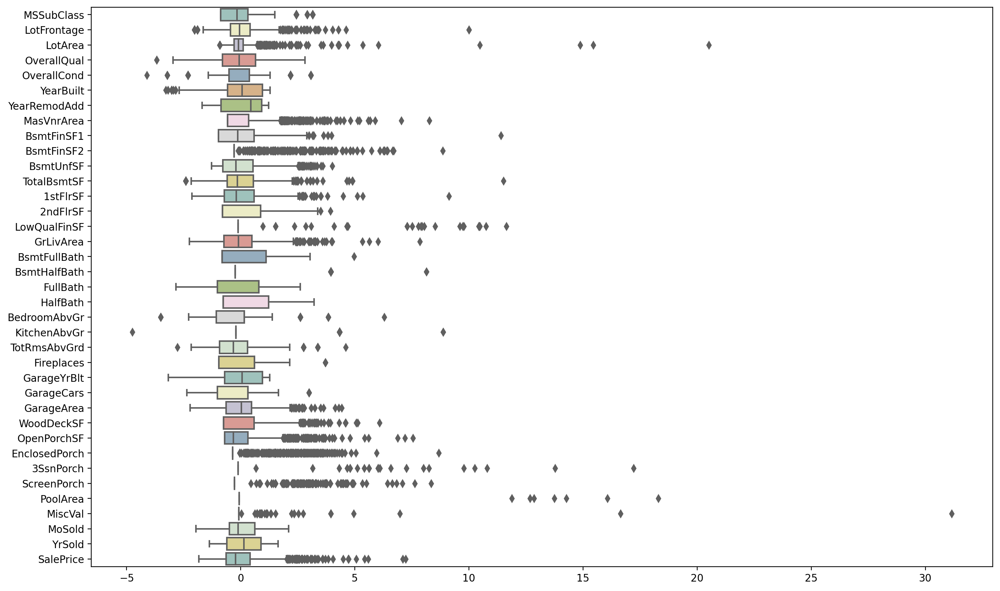

In [38]:
fig,ax=plt.subplots(figsize=(16,10))

sns.boxplot(data=stand_data(train[numeric_features]), orient='h' ,fliersize=5, palette="Set3", linewidth=1.5,
            saturation=0.5, ax=ax);

We will handel outliers in next section.

---

# Data Preprocessing and Feature Engineering

# Goal
- Data Preprocessing and Feature Engineering

# Read the data

In [39]:
train.head(2)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500


In [40]:
test.head(2)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Feedr,Norm,1Fam,1Story,5,6,1961,1961,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,468.0,LwQ,144.0,270.0,882.0,GasA,TA,Y,SBrkr,896,0,0,896,0.0,0.0,1,0,2,1,TA,5,Typ,0,NaN,Attchd,1961.0,Unf,1.0,730.0,TA,TA,Y,140,0,0,0,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,6,1958,1958,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,108.0,TA,TA,CBlock,TA,TA,No,ALQ,923.0,Unf,0.0,406.0,1329.0,GasA,TA,Y,SBrkr,1329,0,0,1329,0.0,0.0,1,1,3,1,Gd,6,Typ,0,NaN,Attchd,1958.0,Unf,1.0,312.0,TA,TA,Y,393,36,0,0,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal


**Combine the two datasets to work at the same time and then split themn again**

In [41]:
 train.shape, test.shape

((1460, 80), (1459, 80))

In [42]:
#Check the info
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1460 non-null   int64  
 1   MSZoning       1460 non-null   object 
 2   LotFrontage    1201 non-null   float64
 3   LotArea        1460 non-null   int64  
 4   Street         1460 non-null   object 
 5   Alley          91 non-null     object 
 6   LotShape       1460 non-null   object 
 7   LandContour    1460 non-null   object 
 8   Utilities      1460 non-null   object 
 9   LotConfig      1460 non-null   object 
 10  LandSlope      1460 non-null   object 
 11  Neighborhood   1460 non-null   object 
 12  Condition1     1460 non-null   object 
 13  Condition2     1460 non-null   object 
 14  BldgType       1460 non-null   object 
 15  HouseStyle     1460 non-null   object 
 16  OverallQual    1460 non-null   int64  
 17  OverallCond    1460 non-null   int64  
 18  YearBuil

---

# Missing values

In [43]:
def perc_nan(df, feat_list):
    """
    This function will return the percent of nans and the number of nans with columns, Parms: dataframe, featurelist.
    """
    # missing values as %
    percent = df[feat_list].isnull().sum()*100 / df[feat_list].shape[0]
    
    #retur the concat between number of nans with the percent
    return pd.concat([df[feat_list].isnull().sum(), percent[percent > 0]],keys=["No_NaN",
                                                                                   "Percent"],
                                                                                    axis=1).dropna().sort_values('Percent',
                                                                                                                 ascending=False)

In [44]:
#NaNs in train
perc_nan(train, train.columns)

,No_NaN,Percent
PoolQC,1453,99.520548
MiscFeature,1406,96.301370
Alley,1369,93.767123
Fence,1179,80.753425
FireplaceQu,690,47.260274
LotFrontage,259,17.739726
GarageType,81,5.547945
GarageYrBlt,81,5.547945
GarageFinish,81,5.547945
GarageQual,81,5.547945


In [45]:
#NaNs in test
perc_nan(test, test.columns)

,No_NaN,Percent
PoolQC,1456,99.794380
MiscFeature,1408,96.504455
Alley,1352,92.666210
Fence,1169,80.123372
FireplaceQu,730,50.034270
LotFrontage,227,15.558602
GarageCond,78,5.346127
GarageYrBlt,78,5.346127
GarageQual,78,5.346127
GarageFinish,78,5.346127


In [46]:
#Get target on y
y = train["SalePrice"]

#concat train and test
combined_df = pd.concat([train, test], axis=0).reset_index(drop=True)

#drop sale price and id we don't need them
combined_df = combined_df.drop(["SalePrice","Id"],axis=1)

combined_df.shape

(2919, 79)

# NaNs for Categorical

In [47]:
#Get the categ features
categ_feature = [x for x in combined_df.columns if combined_df[x].isna().sum()>0 and combined_df[x].dtypes == 'O']
categ_feature

['MSZoning',
 'Alley',
 'Utilities',
 'Exterior1st',
 'Exterior2nd',
 'MasVnrType',
 'BsmtQual',
 'BsmtCond',
 'BsmtExposure',
 'BsmtFinType1',
 'BsmtFinType2',
 'Electrical',
 'KitchenQual',
 'Functional',
 'FireplaceQu',
 'GarageType',
 'GarageFinish',
 'GarageQual',
 'GarageCond',
 'PoolQC',
 'Fence',
 'MiscFeature',
 'SaleType']

In [48]:
#NaNs for categ
perc_nan(combined_df, categ_feature)

,No_NaN,Percent
PoolQC,2909,99.657417
MiscFeature,2814,96.402878
Alley,2721,93.216855
Fence,2348,80.438506
FireplaceQu,1420,48.646797
GarageQual,159,5.447071
GarageFinish,159,5.447071
GarageCond,159,5.447071
GarageType,157,5.378554
BsmtCond,82,2.809181


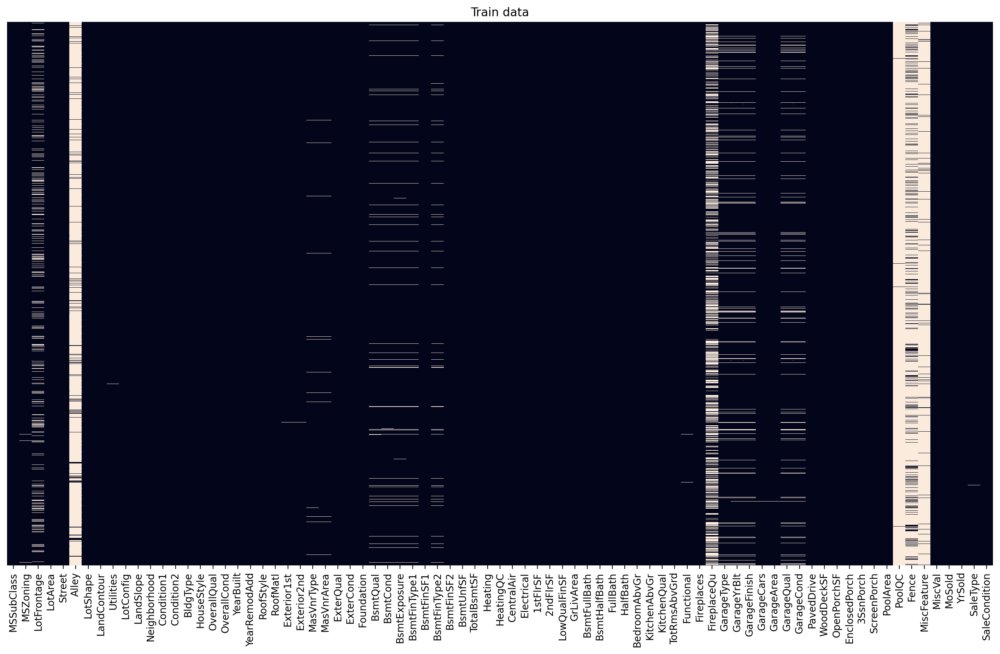

In [49]:
#Heat map before handling nans
fig, ax = plt.subplots(figsize = (18, 10))

# train data 
sns.heatmap(combined_df.isnull(), yticklabels=False, cbar=False)
ax.set_title('Train data');

---

### imputing NaNs

In [50]:
def cat_feat_replace(data, col,rep_val):
    """ A function that replace NaNs with any value, Parm: dataframe, column name, replaced value """
    
    #Print the feature name
    print(f'#################################\nFeature [{col}]:\n________________________________')    
    
    #print sum of nans and not nans
    print(f'NaN values = {data[col].isnull().sum()}')
    print(f'Not NaN values = {data[col].notnull().sum()}\n________________________________')
    
    #fill nans with rep_val
    data[col].fillna(value=rep_val, inplace=True)
    
    #Print the replaced value
    print(f'Replace NaN values with \'{rep_val}\'\n________________________________')
    
    #count the nans in dataframe
    print(f'NaN values = {data[col].isnull().sum()}\n________________________________')
    
    #Print the .value_counts() of the dataframe
    print(f'{data[col].value_counts()}\n')

In [51]:
#Replace the valeus from the meta data for NaNs that was assigned
repl_nan_dict = {'MasVnrType': 'None',
                 'BsmtQual': 'None',
                 'BsmtCond': 'None',
                 'BsmtExposure': 'None',
                 'BsmtFinType1': 'None',
                 'BsmtFinType2': 'None',
                 'GarageType': 'None',
                 'GarageFinish':'None',
                 'GarageQual': 'None',
                 'GarageCond': 'None',
                 'MiscFeature': 'None',
                 'PoolQC': 'None',
                 'Alley': 'None',
                 'FireplaceQu': 'None',
                 'Fence': 'None'}

In [52]:
for key in repl_nan_dict:
    cat_feat_replace(combined_df, key, repl_nan_dict[key])

#################################
Feature [MasVnrType]:
________________________________
NaN values = 24
Not NaN values = 2895
________________________________
Replace NaN values with 'None'
________________________________
NaN values = 0
________________________________
None       1766
BrkFace     879
Stone       249
BrkCmn       25
Name: MasVnrType, dtype: int64

#################################
Feature [BsmtQual]:
________________________________
NaN values = 81
Not NaN values = 2838
________________________________
Replace NaN values with 'None'
________________________________
NaN values = 0
________________________________
TA      1283
Gd      1209
Ex       258
Fa        88
None      81
Name: BsmtQual, dtype: int64

#################################
Feature [BsmtCond]:
________________________________
NaN values = 82
Not NaN values = 2837
________________________________
Replace NaN values with 'None'
________________________________
NaN values = 0
______________________________

### Percent of NaNs after

In [53]:
perc_nan(combined_df, combined_df.columns)

,No_NaN,Percent
LotFrontage,486,16.649538
GarageYrBlt,159,5.447071
MasVnrArea,23,0.787941
MSZoning,4,0.137033
BsmtFullBath,2,0.068517
Utilities,2,0.068517
Functional,2,0.068517
BsmtHalfBath,2,0.068517
GarageArea,1,0.034258
GarageCars,1,0.034258


### Heat map of NaNs

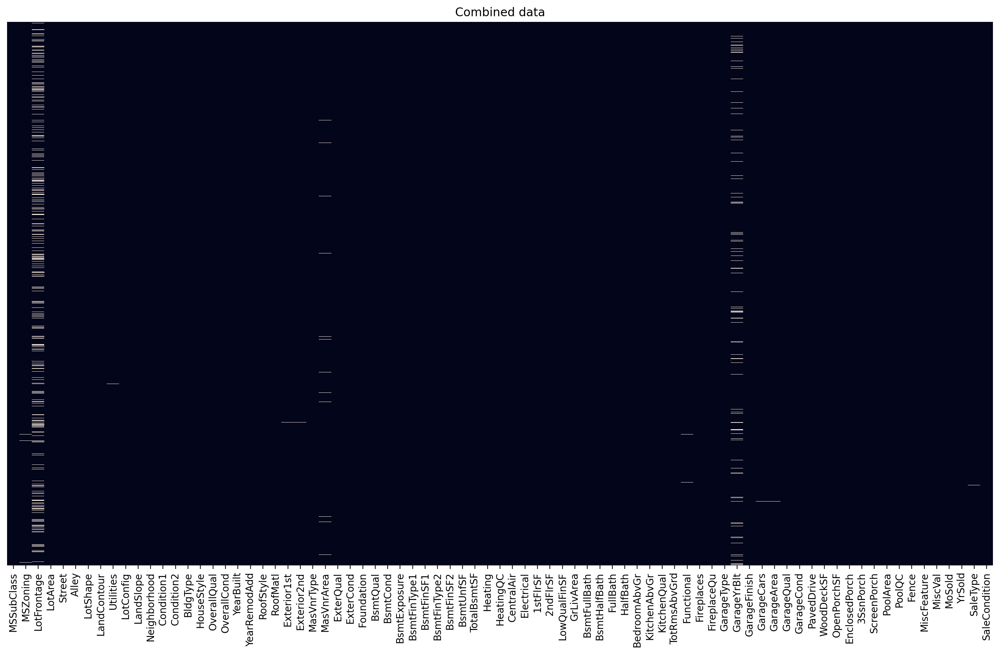

In [54]:
fig, ax = plt.subplots(figsize = (18, 10))

# train data 
sns.heatmap(combined_df.isnull(), yticklabels=False, cbar=False)
ax.set_title('Combined data');

---

# Numeric NaNs

In [55]:
#Get the categ features
numric_feature_nan = [x for x in train.columns if train[x].isnull().sum()>1 and train[x].dtypes != 'O']
numric_feature_nan

['LotFrontage', 'MasVnrArea', 'GarageYrBlt']

In [56]:
#All numeric features with nan
perc_nan(combined_df, numric_feature_nan)

,No_NaN,Percent
LotFrontage,486,16.649538
GarageYrBlt,159,5.447071
MasVnrArea,23,0.787941


### Imputing NaNs

In [57]:
# houses in an area maybe have same area
combined_df["LotFrontage"] = combined_df.groupby("Neighborhood")["LotFrontage"].transform(lambda x:x.fillna(x.median()))

#same
combined_df["MasVnrArea"] = combined_df.groupby("Neighborhood")["MasVnrArea"].transform(lambda x: x.fillna(x.median()))


#same
combined_df["MSZoning"] = combined_df.groupby("MSSubClass")["MSZoning"].transform(lambda x: x.fillna(x.mode()[0]))


#same, but here we're replacing any garage that have year buld and the garage finish is none with the year it self
#I'm assuming all houses came with a garage so if it's the same BulidYear it will be the same, if different it will take
#Garg YearBulid
combined_df.loc[combined_df["GarageFinish"] == "None" , "GarageYrBlt"] = combined_df["YearBuilt"]

In [58]:
#All numeric features with nan
perc_nan(combined_df, combined_df.columns)

,No_NaN,Percent
Utilities,2,0.068517
BsmtFullBath,2,0.068517
BsmtHalfBath,2,0.068517
Functional,2,0.068517
Exterior1st,1,0.034258
Exterior2nd,1,0.034258
BsmtFinSF1,1,0.034258
BsmtFinSF2,1,0.034258
BsmtUnfSF,1,0.034258
TotalBsmtSF,1,0.034258


### Heat map after

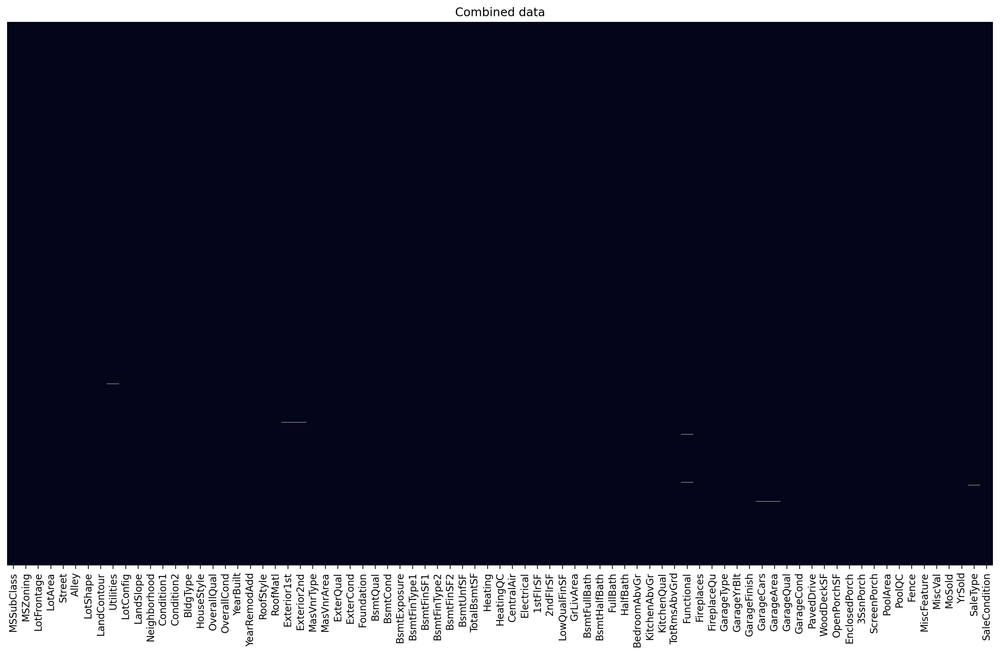

In [59]:
fig, ax = plt.subplots(figsize = (18, 10))

# train data 
sns.heatmap(combined_df.isnull(), yticklabels=False, cbar=False)
ax.set_title('Combined data');

In [60]:
#Get the feature that contain nans
nan_feat = perc_nan(combined_df, combined_df.columns).index
nan_feat

Index(['Utilities', 'BsmtFullBath', 'BsmtHalfBath', 'Functional',
       'Exterior1st', 'Exterior2nd', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF',
       'TotalBsmtSF', 'Electrical', 'KitchenQual', 'GarageCars', 'GarageArea',
       'SaleType'],
      dtype='object')

In [61]:
#Get the categ features
nan_categ_feature = [x for x in nan_feat if combined_df[x].isna().sum()>0 and combined_df[x].dtypes == 'O']
nan_categ_feature

['Utilities',
 'Functional',
 'Exterior1st',
 'Exterior2nd',
 'Electrical',
 'KitchenQual',
 'SaleType']

In [62]:
# numeric feature
nan_numric_feature = [feat for feat in nan_feat if feat not in categ_feature]
nan_numric_feature

['BsmtFullBath',
 'BsmtHalfBath',
 'BsmtFinSF1',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 'GarageCars',
 'GarageArea']

In [63]:
#Replace the valeus from the meta data for NaNs that was assigned
repl_nan_dict = {'Utilities': combined_df['Utilities'].mode()[0],
                 'Functional': combined_df['Functional'].mode()[0],
                 'Exterior1st': combined_df['Exterior1st'].mode()[0],
                 'Exterior2nd': combined_df['Exterior2nd'].mode()[0],
                 'Electrical': combined_df['Electrical'].mode()[0],
                 'KitchenQual': combined_df['KitchenQual'].mode()[0],
                 'SaleType': combined_df['SaleType'].mode()[0],
                 'BsmtFullBath': combined_df['BsmtFullBath'].median(),
                 'BsmtHalfBath': combined_df['BsmtHalfBath'].median(),
                 'BsmtFinSF1':combined_df['BsmtFinSF1'].median(),
                 'BsmtFinSF2': combined_df['BsmtFinSF2'].median(),
                 'BsmtUnfSF': combined_df['BsmtUnfSF'].median(),
                 'TotalBsmtSF': combined_df['TotalBsmtSF'].median(),
                 'GarageCars': combined_df['GarageCars'].median(),
                 'GarageArea': combined_df['GarageArea'].median()} 

In [64]:
for key in repl_nan_dict:
    cat_feat_replace(combined_df, key, repl_nan_dict[key])

#################################
Feature [Utilities]:
________________________________
NaN values = 2
Not NaN values = 2917
________________________________
Replace NaN values with 'AllPub'
________________________________
NaN values = 0
________________________________
AllPub    2918
NoSeWa       1
Name: Utilities, dtype: int64

#################################
Feature [Functional]:
________________________________
NaN values = 2
Not NaN values = 2917
________________________________
Replace NaN values with 'Typ'
________________________________
NaN values = 0
________________________________
Typ     2719
Min2      70
Min1      65
Mod       35
Maj1      19
Maj2       9
Sev        2
Name: Functional, dtype: int64

#################################
Feature [Exterior1st]:
________________________________
NaN values = 1
Not NaN values = 2918
________________________________
Replace NaN values with 'VinylSd'
________________________________
NaN values = 0
________________________________

In [65]:
perc_nan(combined_df, combined_df.columns)

,No_NaN,Percent


### Heat map of NaNs after

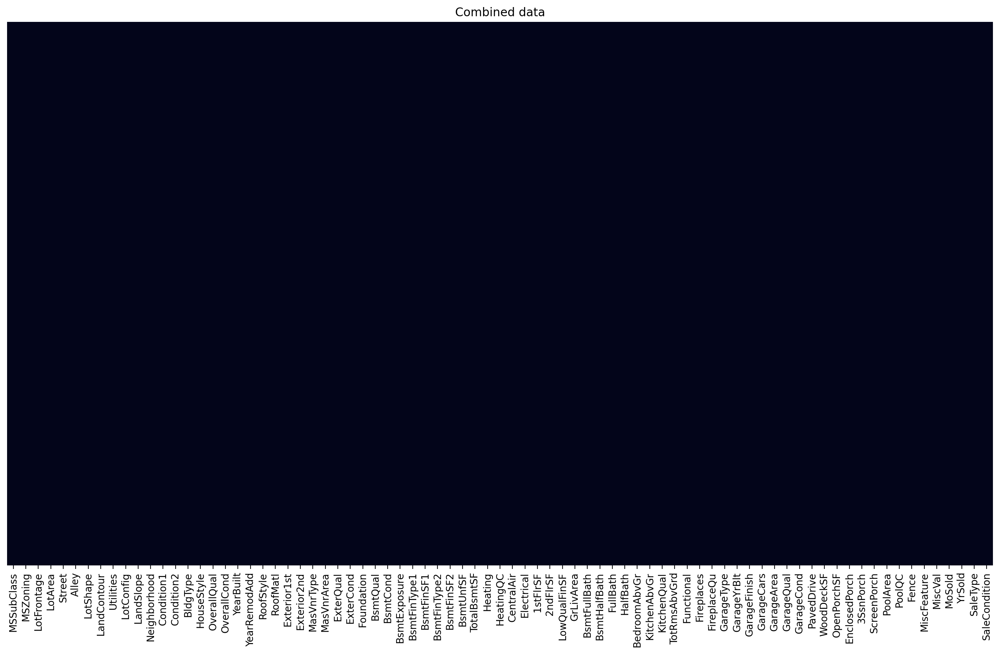

In [66]:
fig, ax = plt.subplots(figsize = (18, 10))

# train data 
sns.heatmap(combined_df.isnull(), yticklabels=False, cbar=False)
ax.set_title('Combined data');

### Year features

In [67]:
#convert M&y to str features

combined_df["MoSold"] = combined_df["MoSold"].astype(str)

combined_df["YrSold"] = combined_df["YrSold"].astype(str)

combined_df["YearBuilt"] = combined_df["YearBuilt"].astype(str)

combined_df["YearRemodAdd"] = combined_df["YearRemodAdd"].astype(str)

# New features

In [68]:
# We have some columsn with areas but most of the areas were 0, so it will be good to convert it ot 0 or 1, have or not

#PoolArea
combined_df["Haspool"] = combined_df["PoolArea"].transform(lambda x: 1 if x > 0 else 0)

#2ndFlrSF
combined_df["Has2ndFlr"] = combined_df["2ndFlrSF"].transform(lambda x: 1 if x > 0 else 0)

#GarageArea
combined_df["Hasgarage"] = combined_df["GarageArea"].transform(lambda x: 1 if x > 0 else 0)

#TotalBsmtSF
combined_df["Hasbsmt"] = combined_df["TotalBsmtSF"].transform(lambda x: 1 if x > 0 else 0)

#Fireplaces
combined_df["Hasfireplace"] = combined_df["Fireplaces"].transform(lambda x: 1 if x > 0 else 0)

---

In [69]:
combined_df.Utilities.value_counts()

AllPub    2918
NoSeWa       1
Name: Utilities, dtype: int64

In [70]:

combined_df.drop('Utilities', inplace=True, axis=1)

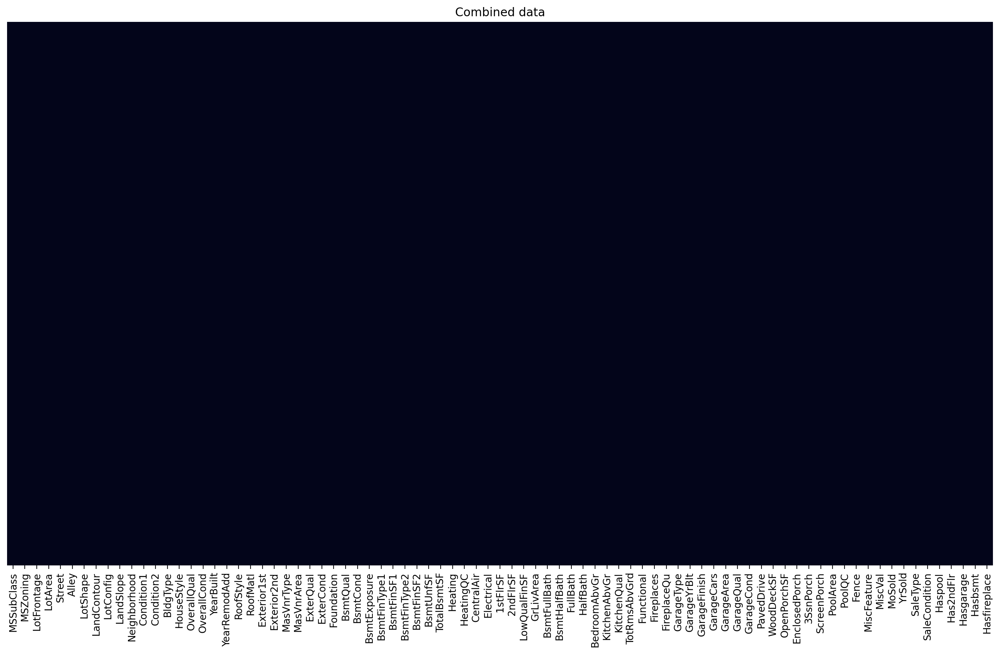

In [71]:
fig, ax = plt.subplots(figsize = (18, 10))

# train data 
sns.heatmap(combined_df.isnull(), yticklabels=False, cbar=False)
ax.set_title('Combined data');

**No NULLS**

----

# Skewed data

In [72]:
#List of object numeric_features
numeric_features = [fet for fet in combined_df.columns if combined_df[fet].dtype != 'O']
numeric_features

['MSSubClass',
 'LotFrontage',
 'LotArea',
 'OverallQual',
 'OverallCond',
 'MasVnrArea',
 'BsmtFinSF1',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 '1stFlrSF',
 '2ndFlrSF',
 'LowQualFinSF',
 'GrLivArea',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'TotRmsAbvGrd',
 'Fireplaces',
 'GarageYrBlt',
 'GarageCars',
 'GarageArea',
 'WoodDeckSF',
 'OpenPorchSF',
 'EnclosedPorch',
 '3SsnPorch',
 'ScreenPorch',
 'PoolArea',
 'MiscVal',
 'Haspool',
 'Has2ndFlr',
 'Hasgarage',
 'Hasbsmt',
 'Hasfireplace']

Skew is =  1.3761646373261713


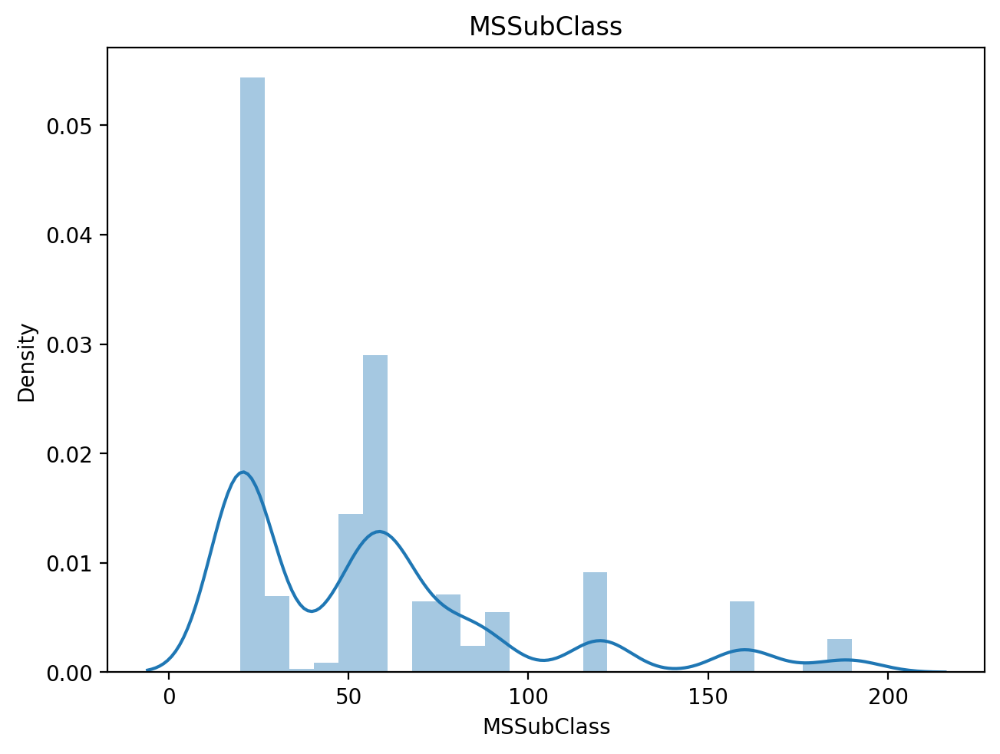

Skew is =  1.5064780938156954


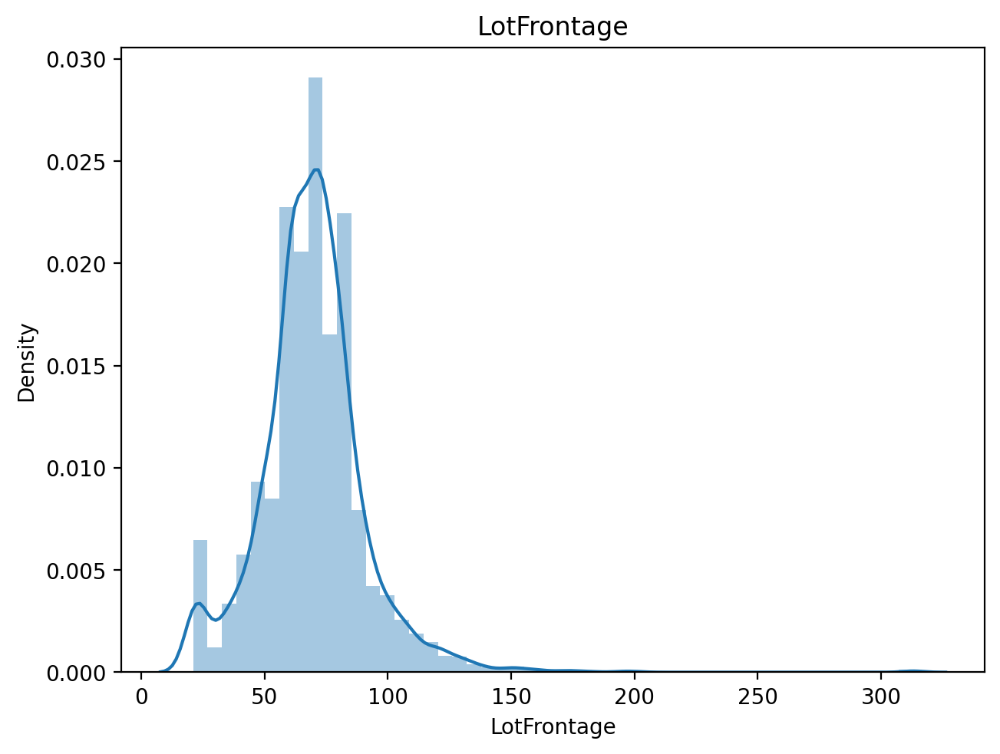

Skew is =  12.829024853018762


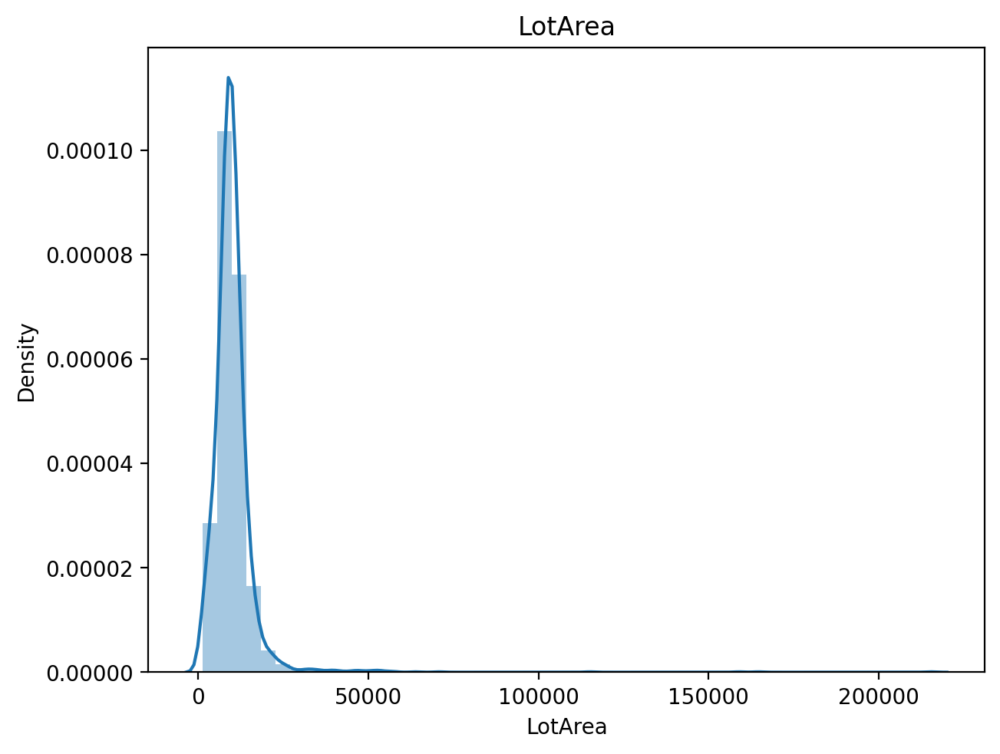

Skew is =  0.5706053117352524


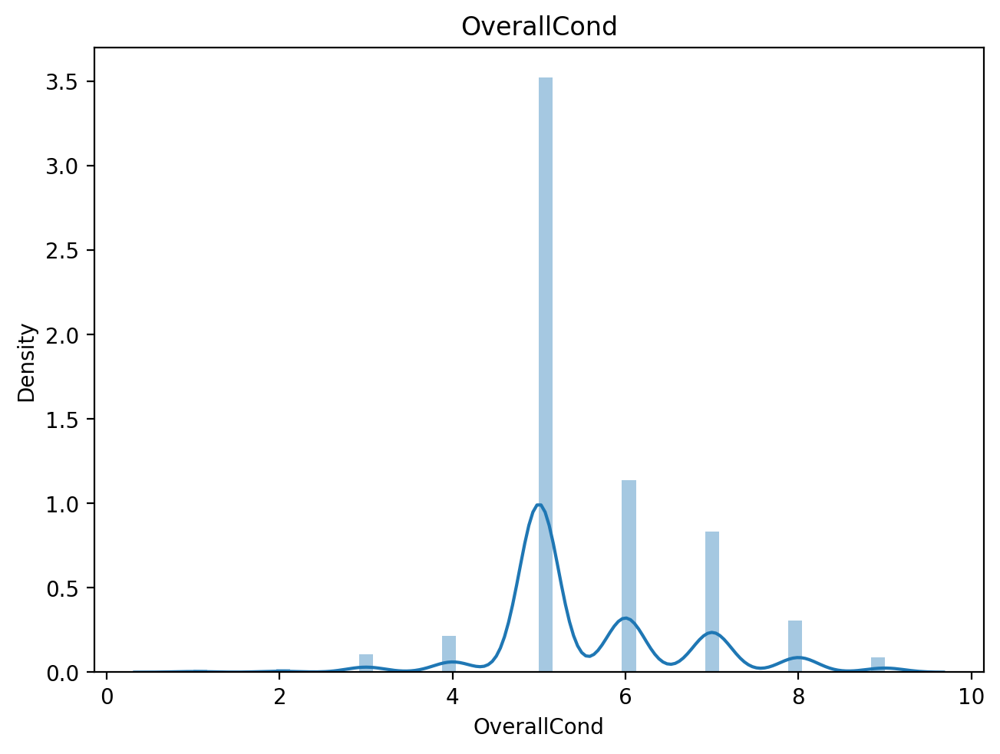

Skew is =  2.6112275367003313


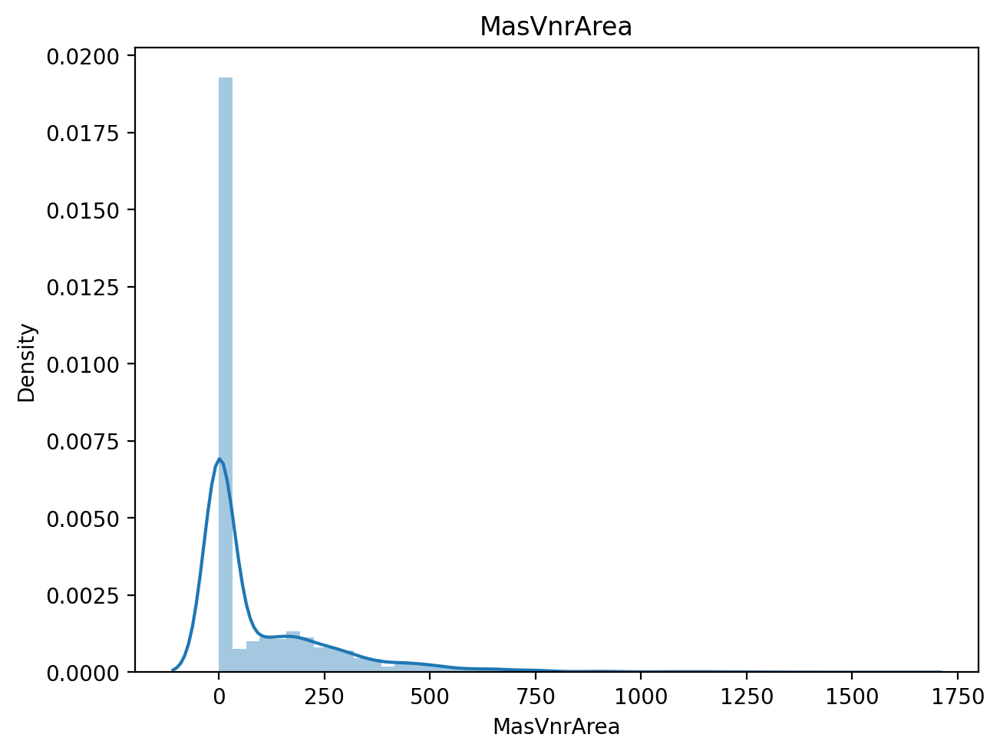

Skew is =  1.4261107660173202


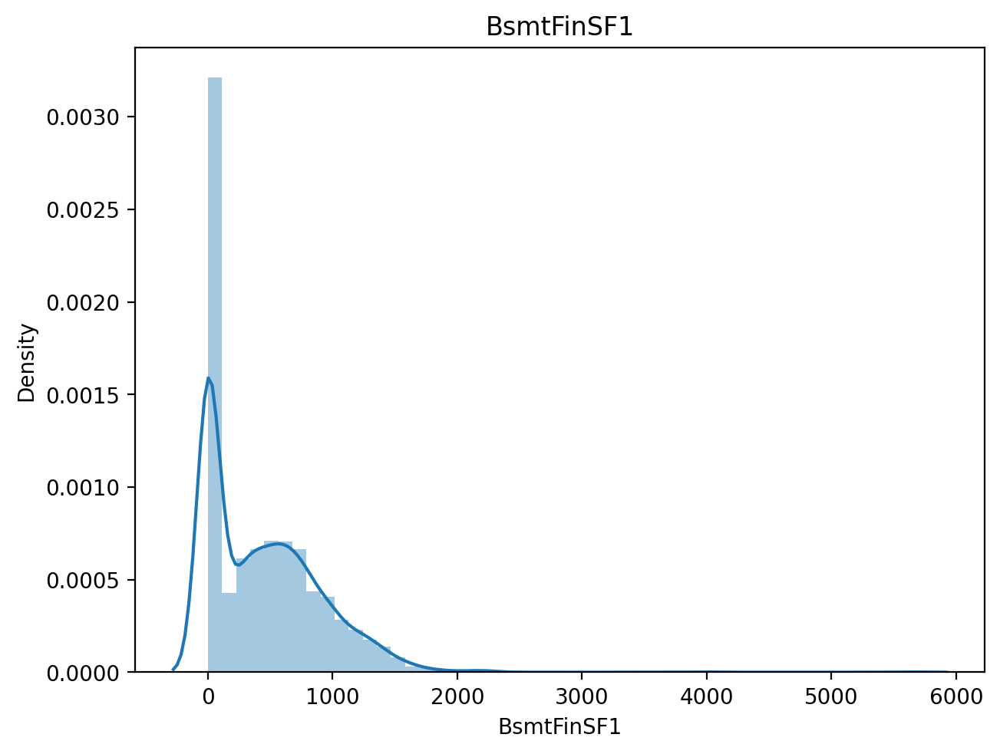

Skew is =  4.148275267275402


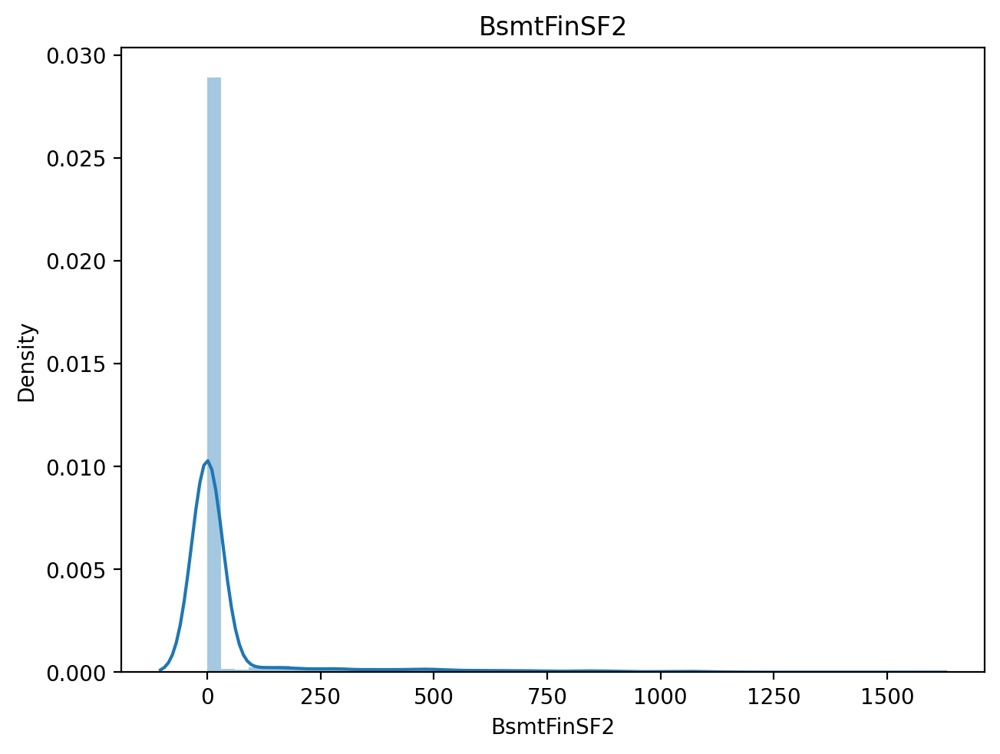

Skew is =  0.9201757246843627


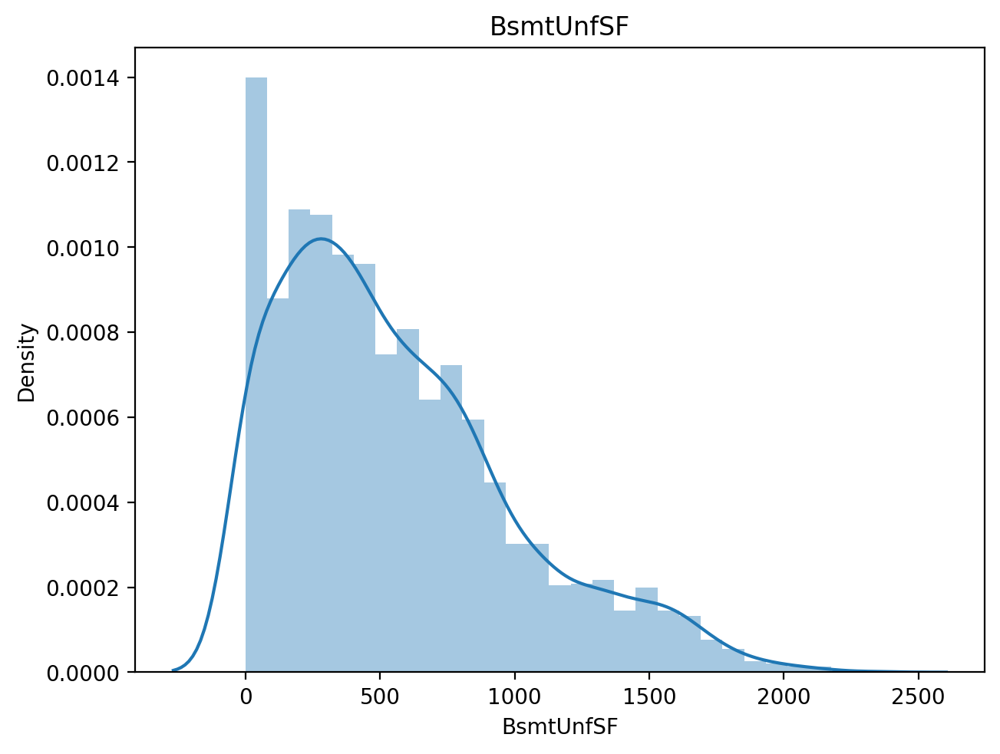

Skew is =  1.1632139475611367


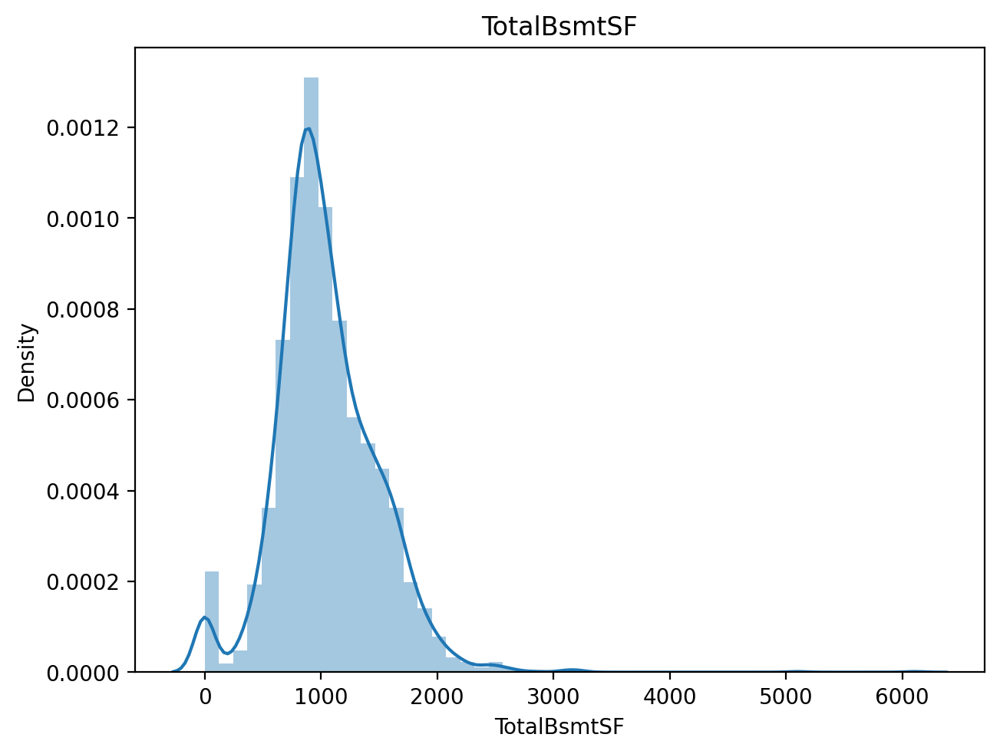

Skew is =  1.4703601055379227


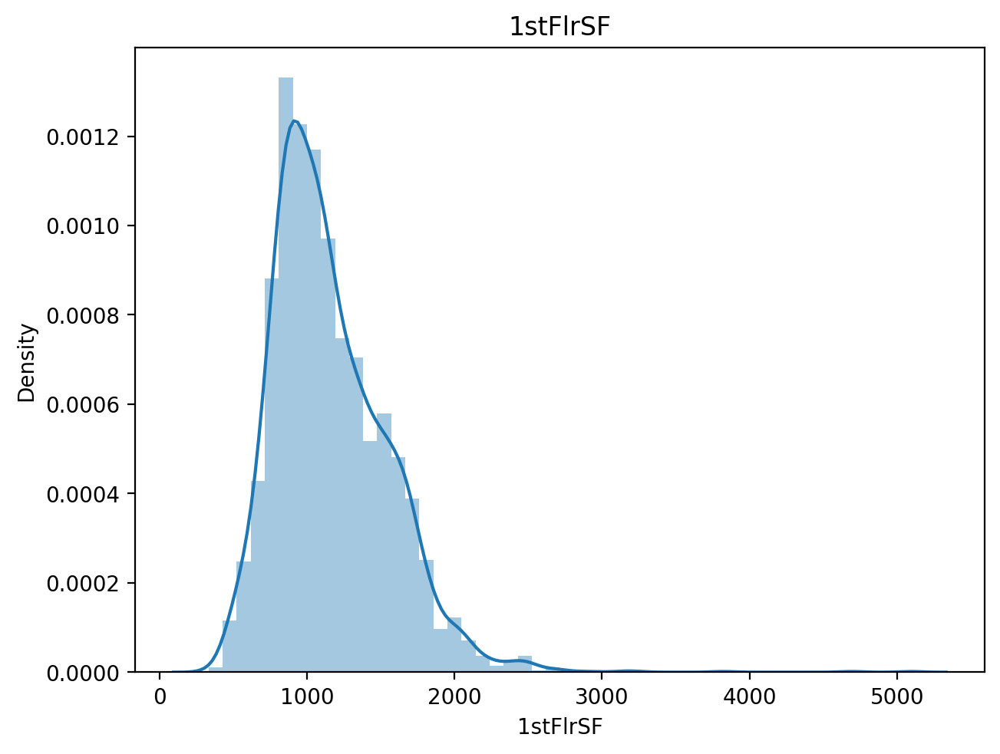

Skew is =  0.8621178325657642


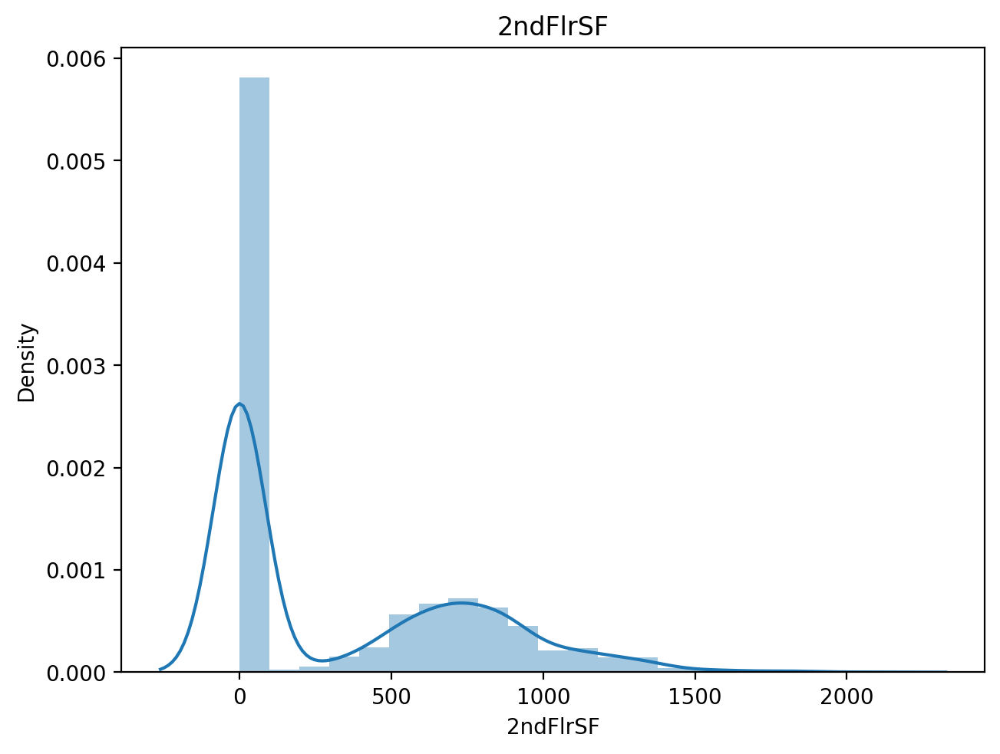

Skew is =  12.094977192517302


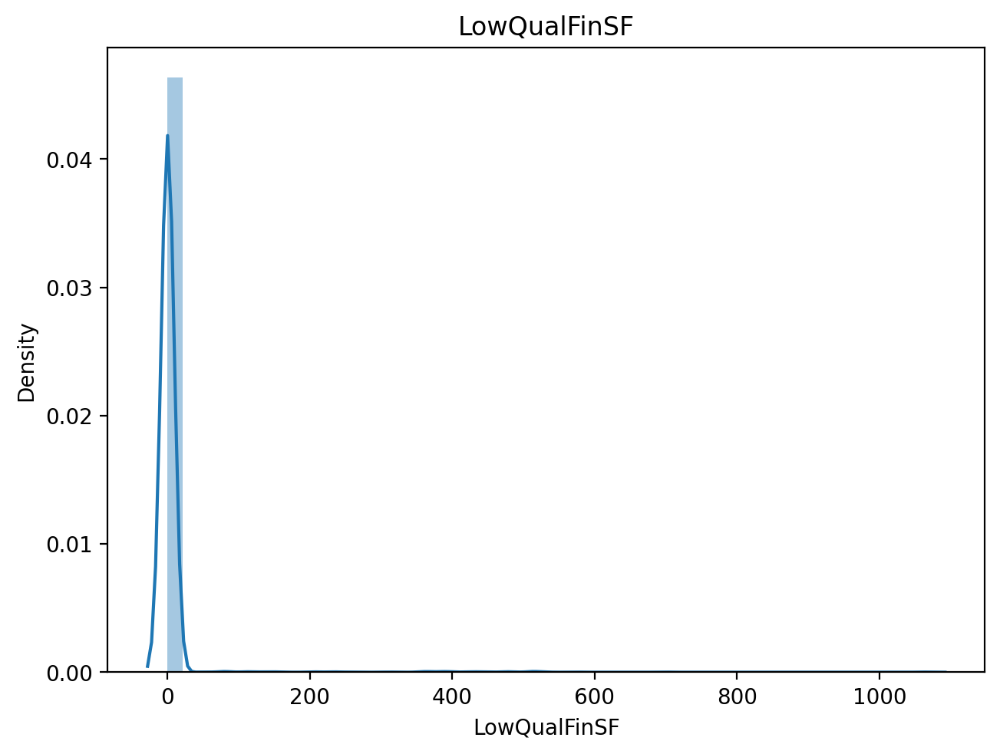

Skew is =  1.2700104075191514


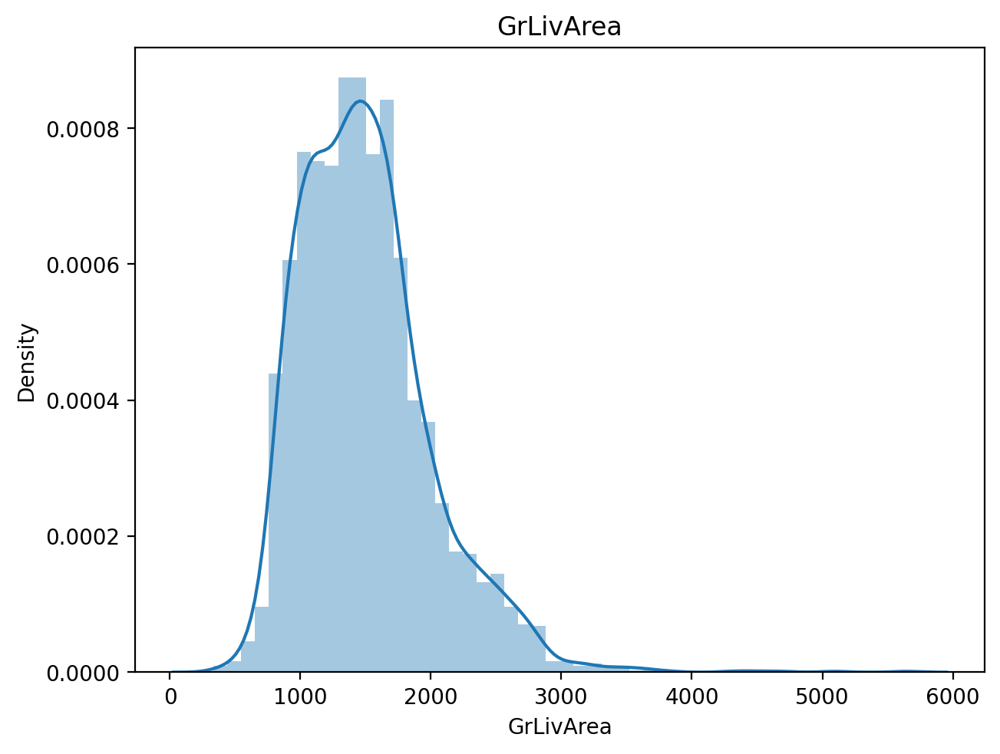

Skew is =  0.6251534098798688


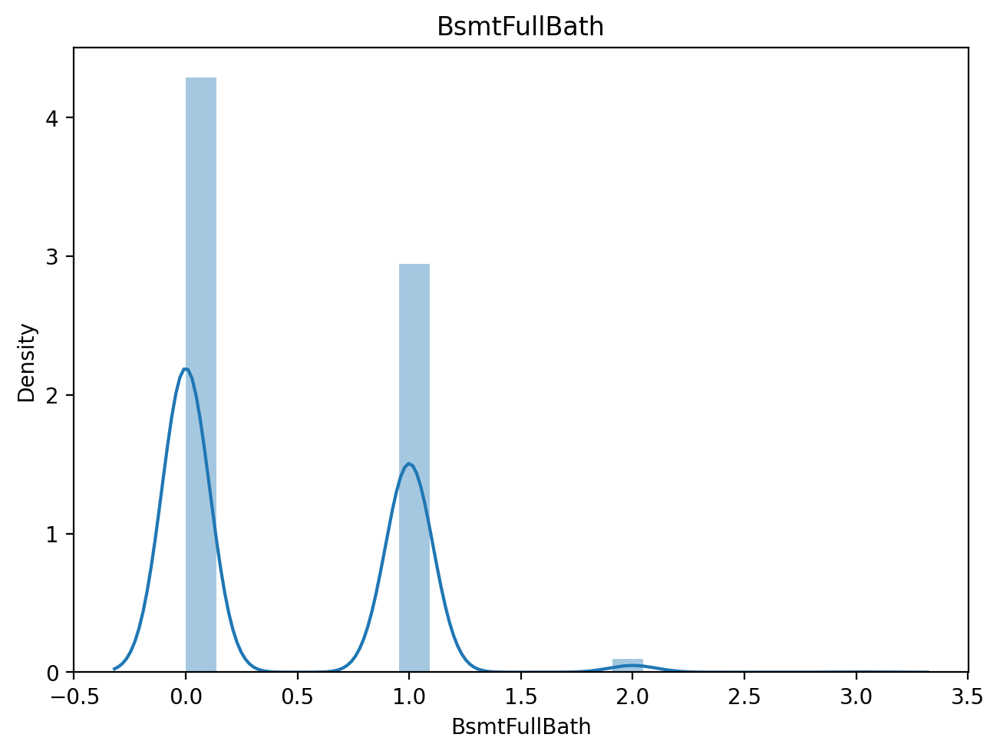

Skew is =  3.9336155129159094


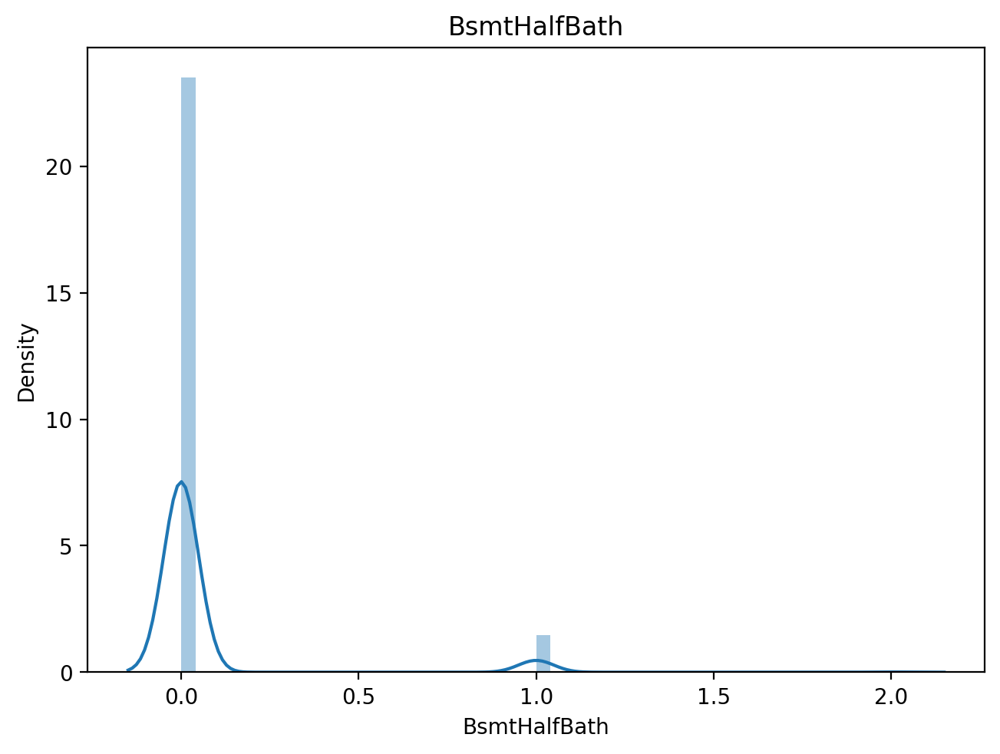

Skew is =  0.6949236492716564


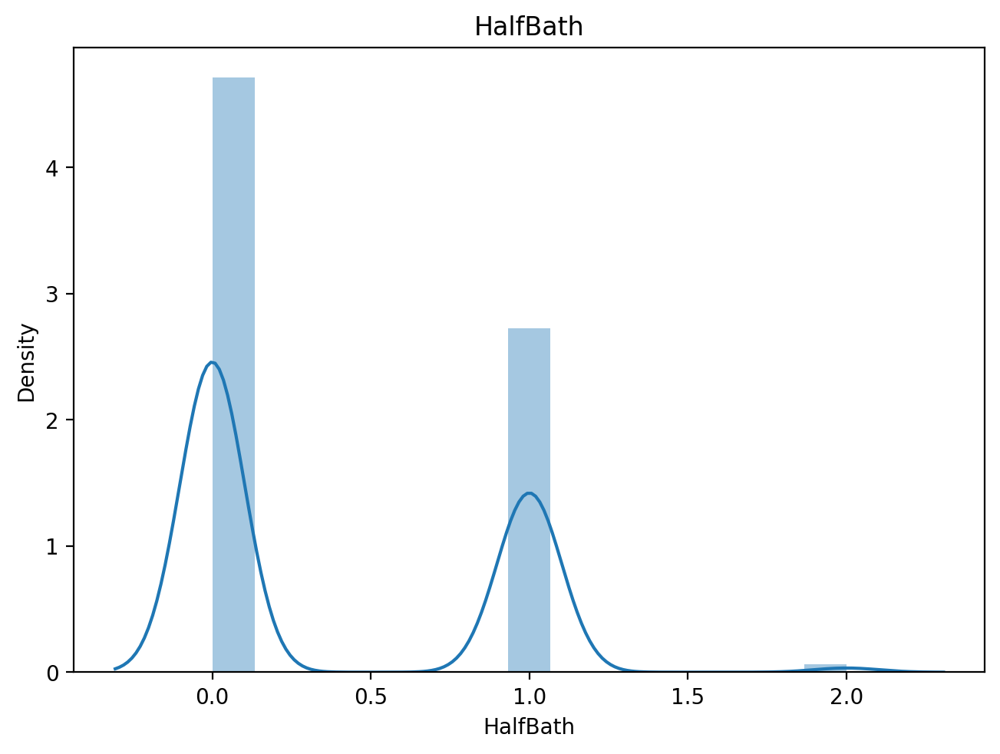

Skew is =  4.304466641562935


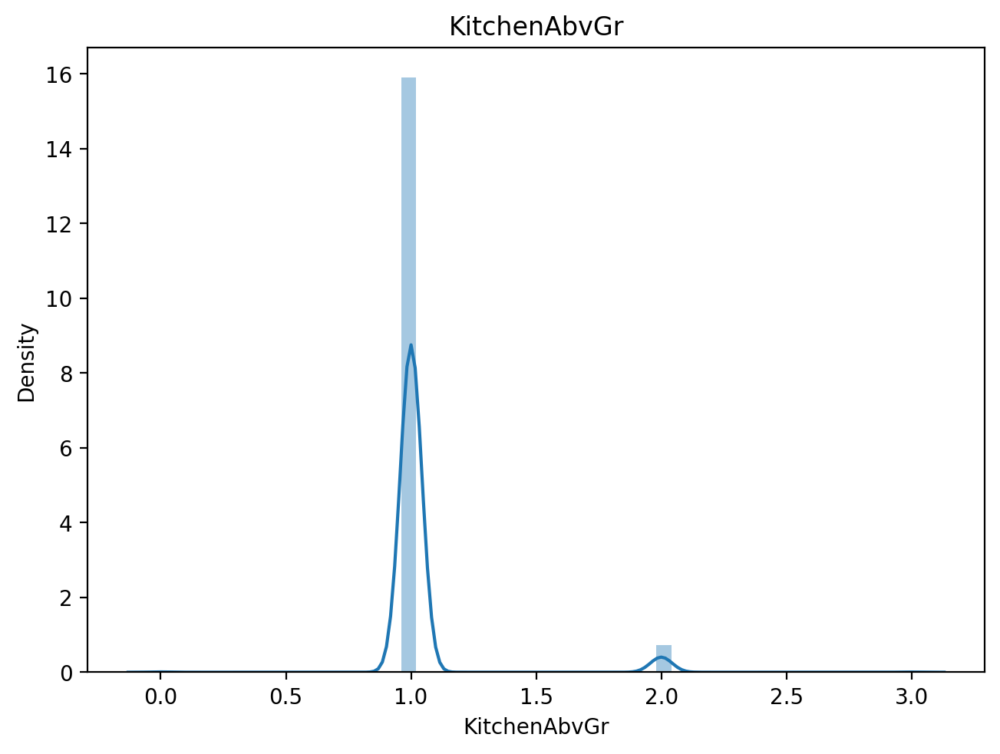

Skew is =  0.7587568676624701


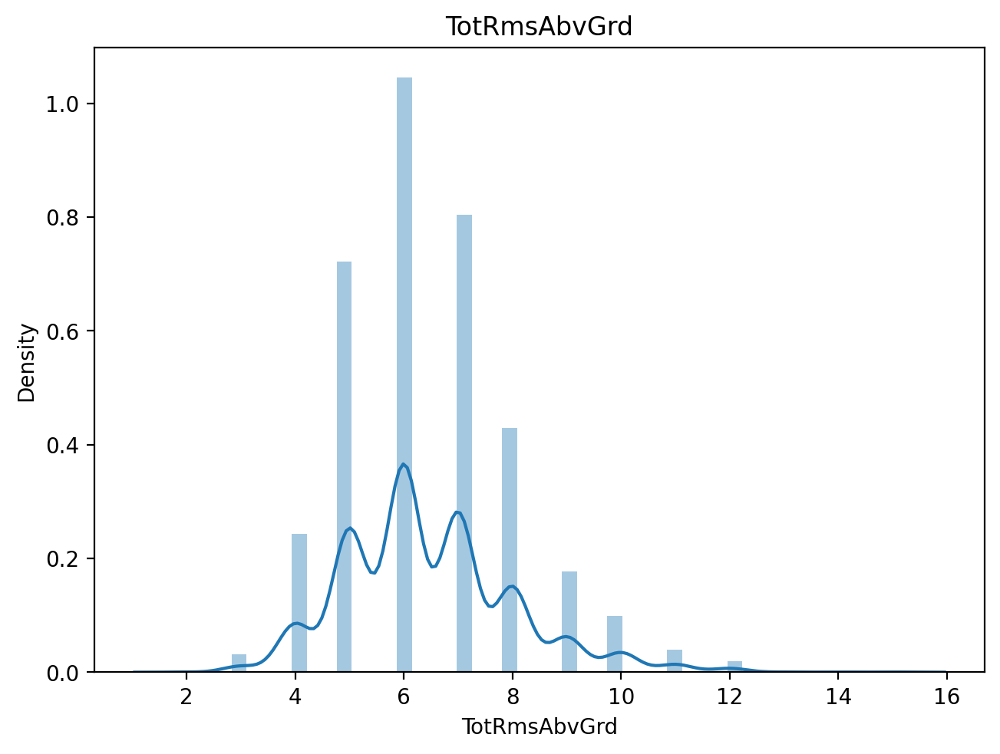

Skew is =  0.733871770878103


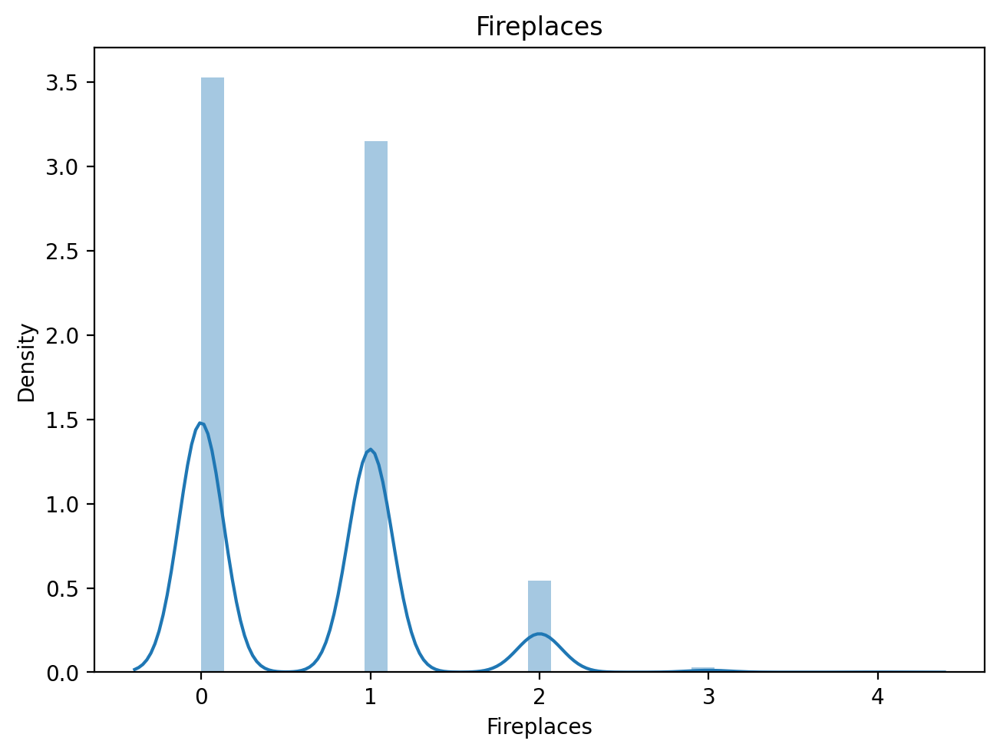

Skew is =  1.8433802126628294


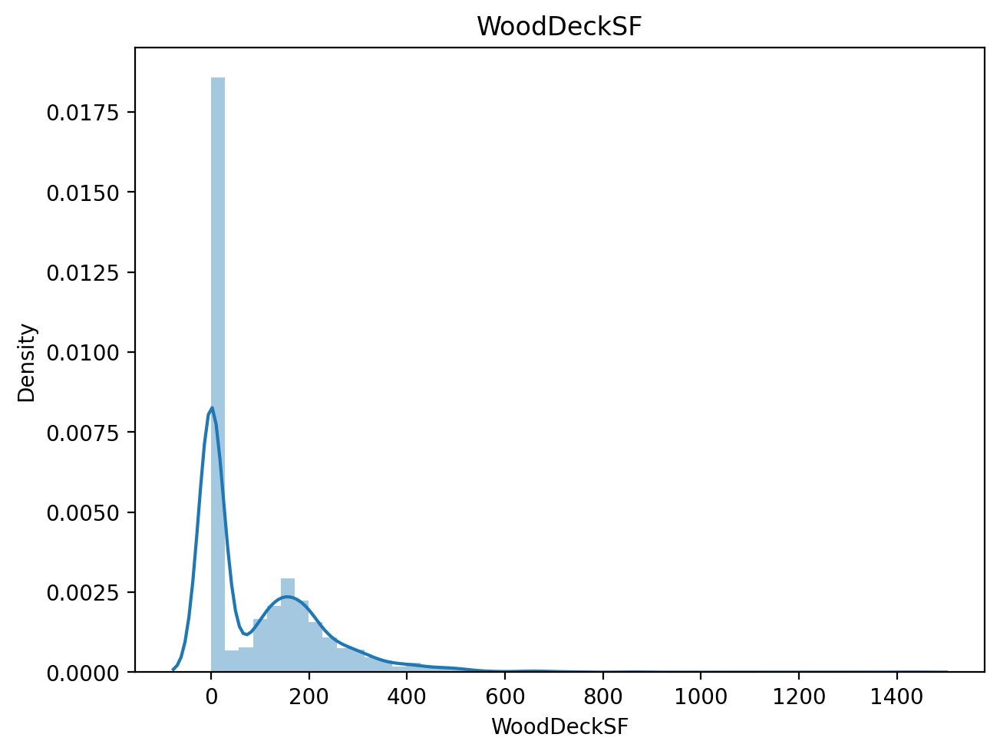

Skew is =  2.5364173160468444


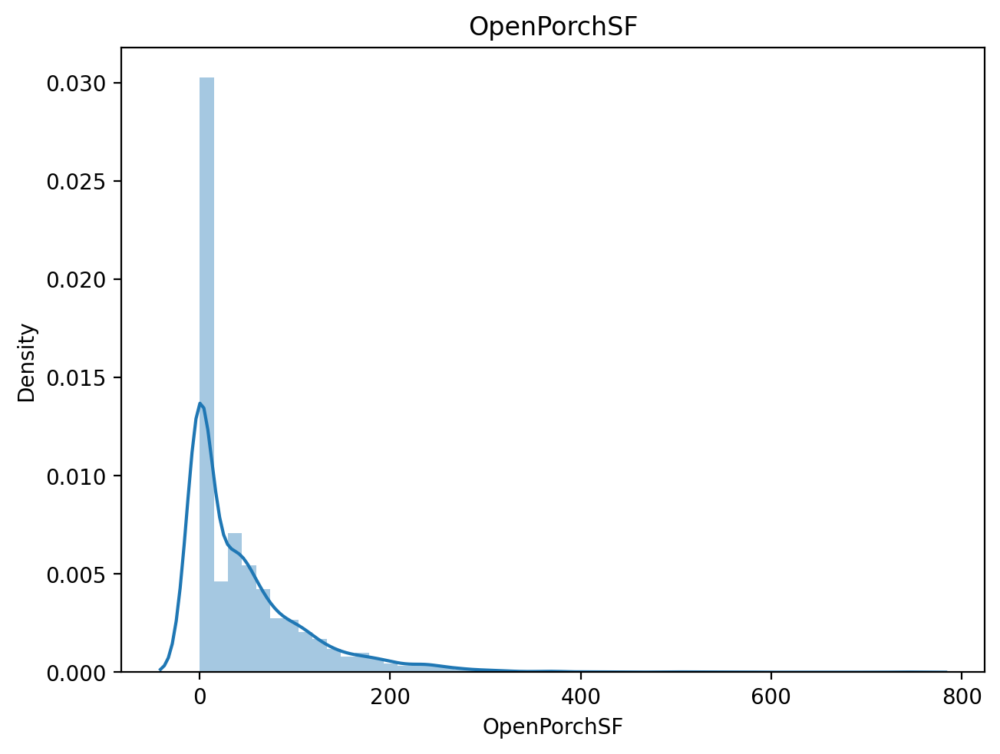

Skew is =  4.005950070504265


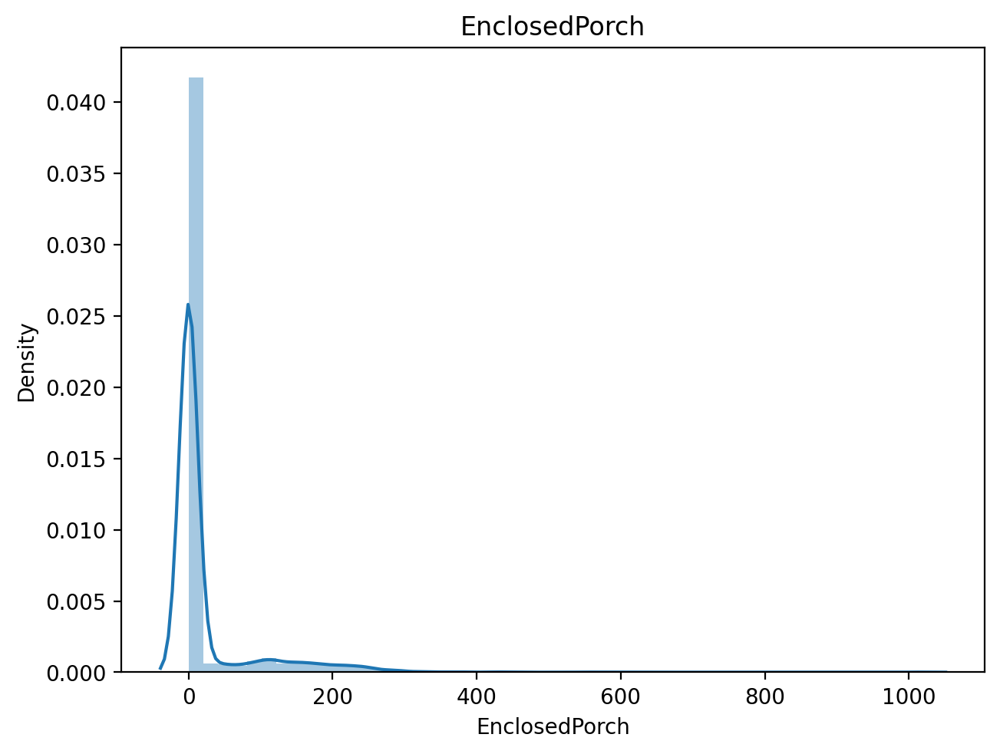

Skew is =  11.381914394786643


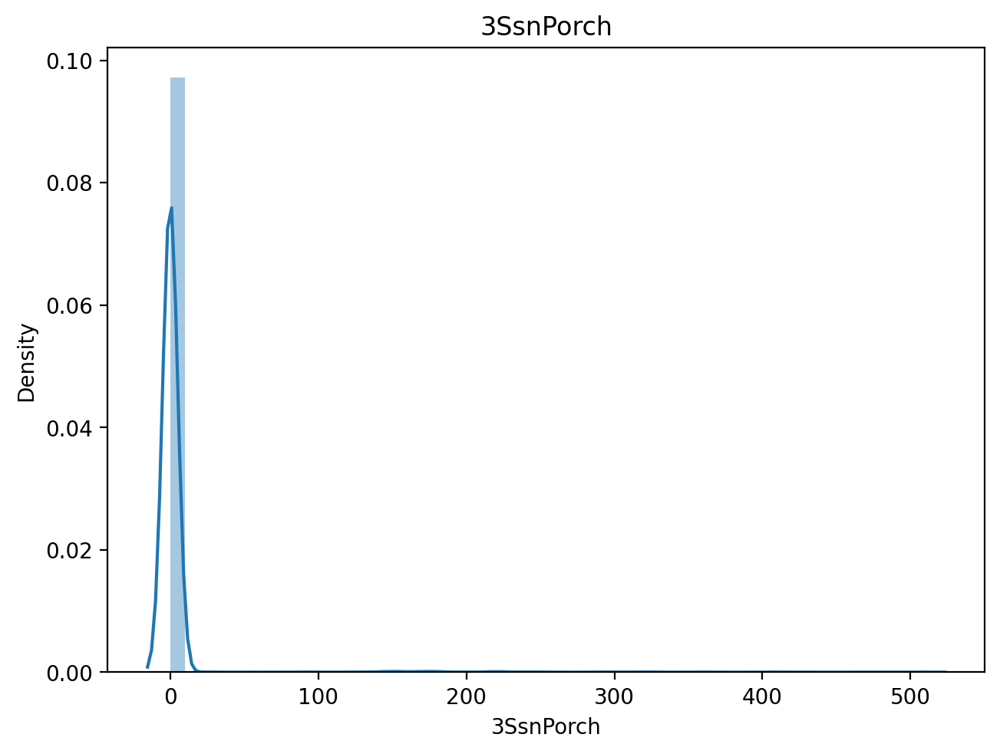

Skew is =  3.948723141292199


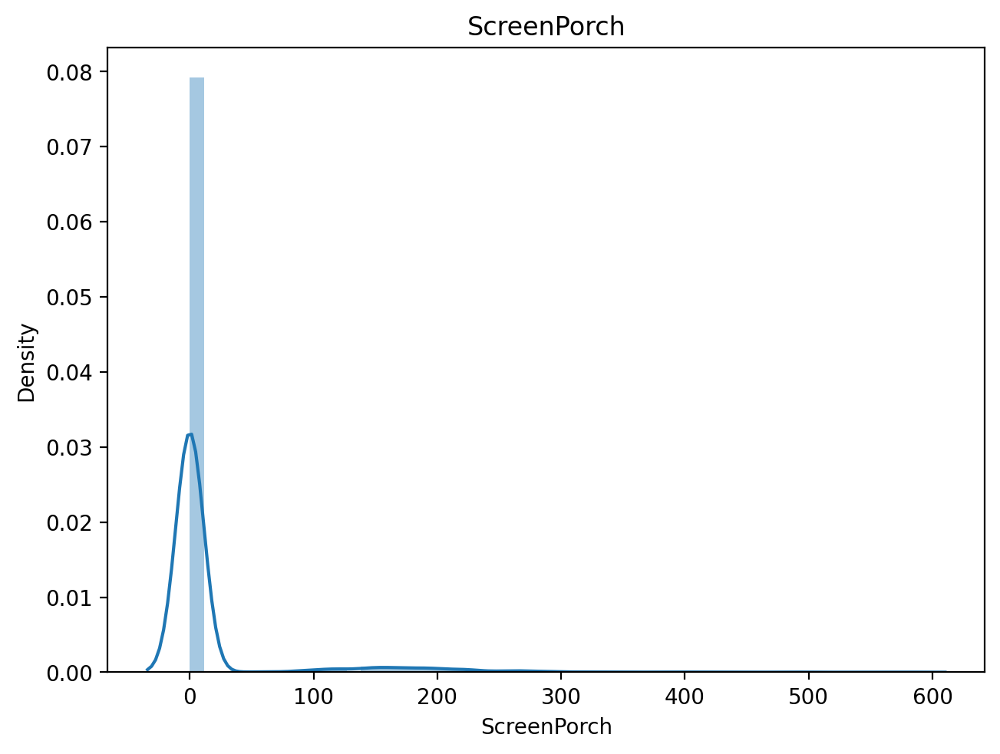

Skew is =  16.9070172435751


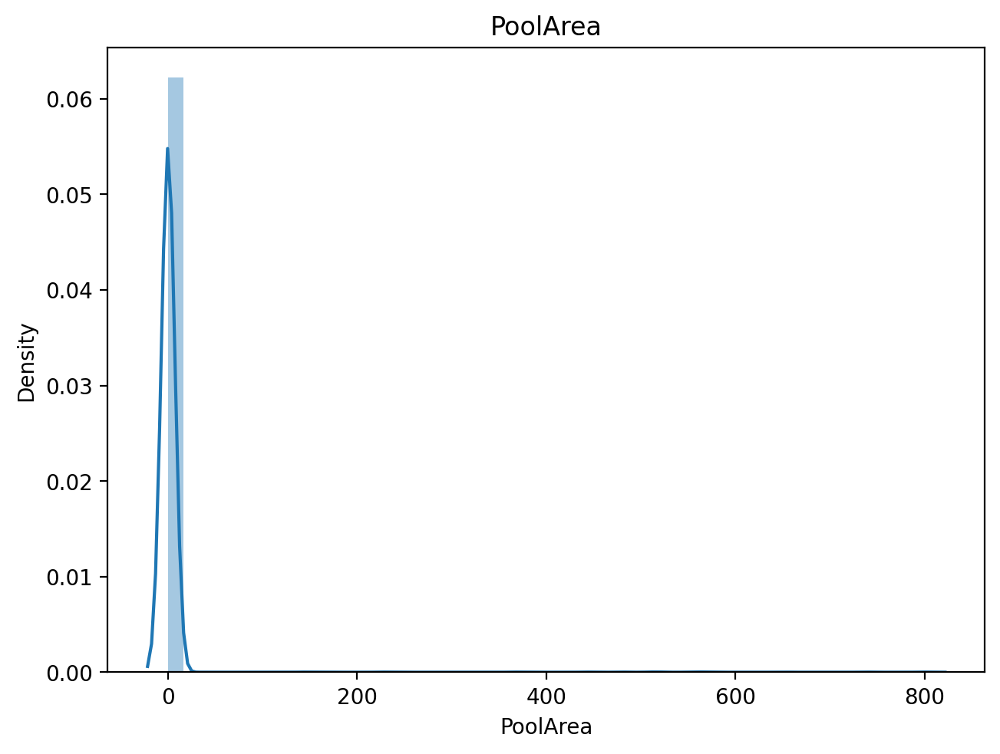

Skew is =  21.958480324447216


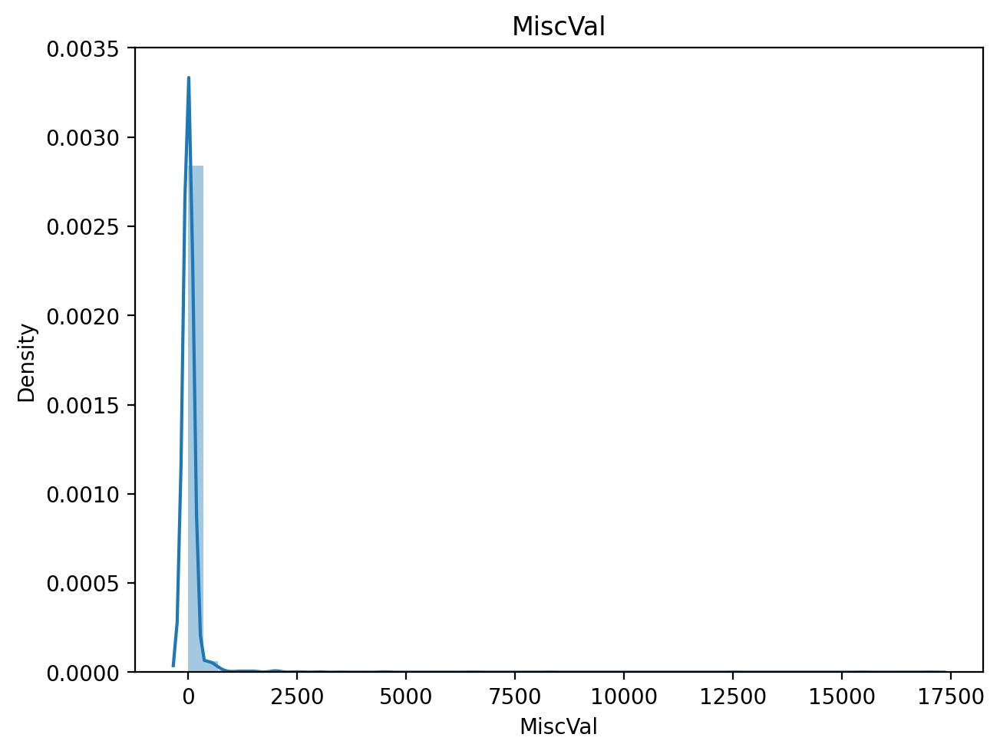

Skew is =  14.891972126230131


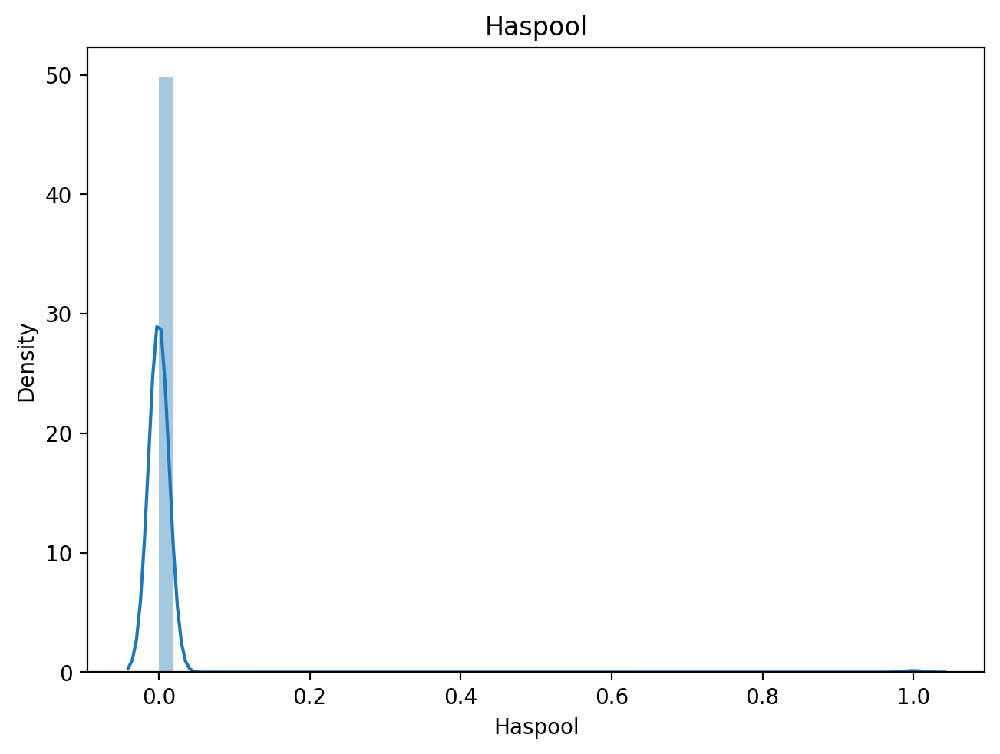

Skew is =  -3.957941095301558


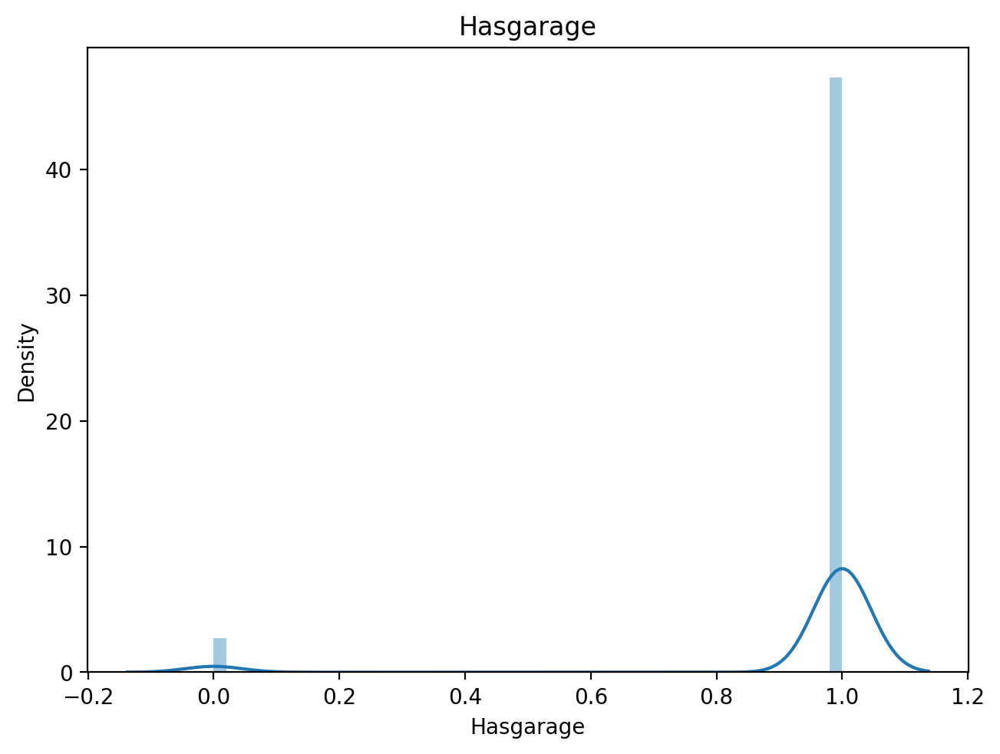

Skew is =  -5.872475706699865


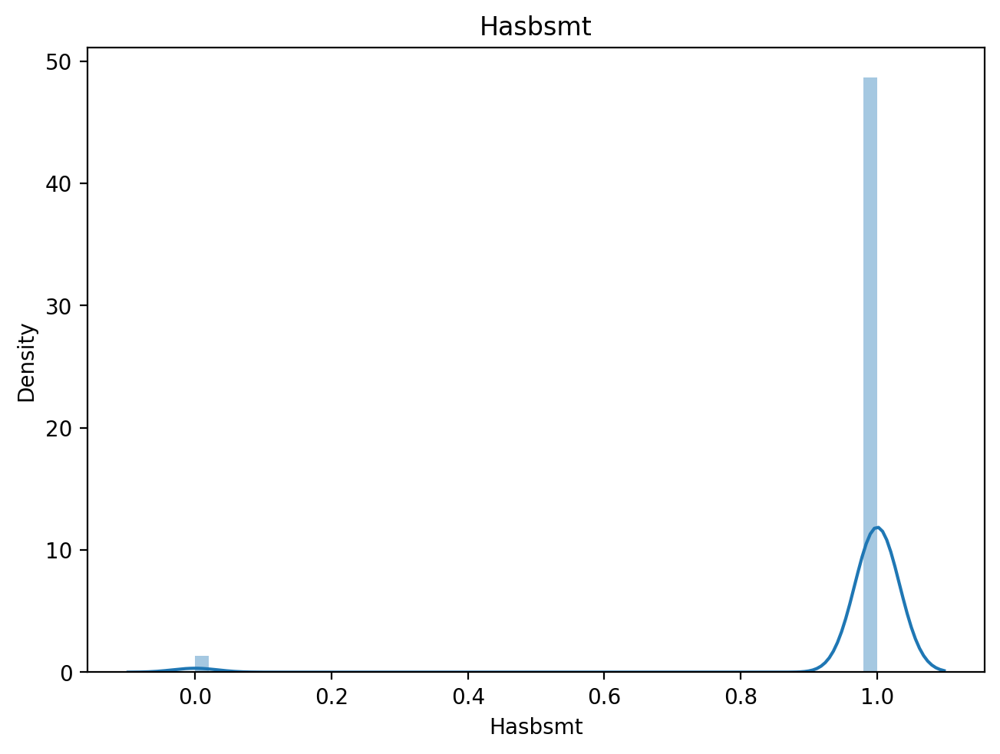

In [73]:
for feat in numeric_features:
    #Plot only the highly skewed >0.5 and <-0.5
    if (combined_df[feat].skew() > 0.5) or (combined_df[feat].skew() < -0.5):
        plt.figure(constrained_layout=True)
        
        #Plot the hist
        sns.distplot(combined_df[feat])
        
        #Set title
        plt.title(feat)
        
        #Set ticklabels
        plt.ticklabel_format(style='plain', axis='y') #Disable scientific notation;
        
        #Print the skew value
        print('Skew is = ',combined_df[feat].skew())
        plt.show() 

Most of not all of our features are right Skewed

In [74]:
#Transforming numeric features to fix the skewenes
for num in numeric_features:
    combined_df.loc[:,num] = np.log1p(combined_df[num])

In [75]:
combined_df[numeric_features].head()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,Haspool,Has2ndFlr,Hasgarage,Hasbsmt,Hasfireplace
0,4.110874,4.189655,9.042040,2.079442,1.791759,5.283204,6.561031,0.0,5.017280,6.753438,6.753438,6.751101,0.0,7.444833,0.693147,0.000000,1.098612,0.693147,1.386294,0.693147,2.197225,0.000000,7.602900,1.098612,6.308098,0.000000,4.127134,0.000000,0.0,0.0,0.0,0.0,0.0,0.693147,0.693147,0.693147,0.000000
1,3.044522,4.394449,9.169623,1.945910,2.197225,0.000000,6.886532,0.0,5.652489,7.141245,7.141245,0.000000,0.0,7.141245,0.000000,0.693147,1.098612,0.000000,1.386294,0.693147,1.945910,0.693147,7.589336,1.098612,6.133398,5.700444,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.693147,0.693147,0.693147
2,4.110874,4.234107,9.328212,2.079442,1.791759,5.093750,6.188264,0.0,6.075346,6.825460,6.825460,6.765039,0.0,7.488294,0.693147,0.000000,1.098612,0.693147,1.386294,0.693147,1.945910,0.693147,7.601902,1.098612,6.411818,0.000000,3.761200,0.000000,0.0,0.0,0.0,0.0,0.0,0.693147,0.693147,0.693147,0.693147
3,4.262680,4.110874,9.164401,2.079442,1.791759,0.000000,5.379897,0.0,6.293419,6.629363,6.869014,6.629363,0.0,7.448916,0.693147,0.000000,0.693147,0.000000,1.386294,0.693147,2.079442,0.693147,7.600402,1.386294,6.466145,0.000000,3.583519,5.609472,0.0,0.0,0.0,0.0,0.0,0.693147,0.693147,0.693147,0.693147
4,4.110874,4.442651,9.565284,2.197225,1.791759,5.860786,6.486161,0.0,6.196444,7.044033,7.044033,6.960348,0.0,7.695758,0.693147,0.000000,1.098612,0.693147,1.609438,0.693147,2.302585,0.693147,7.601402,1.386294,6.729824,5.262690,4.442651,0.000000,0.0,0.0,0.0,0.0,0.0,0.693147,0.693147,0.693147,0.693147


# Dummy

In [76]:
#List of object columns
object_column = [each for each in combined_df.columns if combined_df[each].dtype == 'O']
print(object_column)

['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature', 'MoSold', 'YrSold', 'SaleType', 'SaleCondition']


In [77]:
#Number of unique values in each object column
for each in object_column:
    print(each,':', combined_df[each].nunique())

MSZoning : 5
Street : 2
Alley : 3
LotShape : 4
LandContour : 4
LotConfig : 5
LandSlope : 3
Neighborhood : 25
Condition1 : 9
Condition2 : 8
BldgType : 5
HouseStyle : 8
YearBuilt : 118
YearRemodAdd : 61
RoofStyle : 6
RoofMatl : 8
Exterior1st : 15
Exterior2nd : 16
MasVnrType : 4
ExterQual : 4
ExterCond : 5
Foundation : 6
BsmtQual : 5
BsmtCond : 5
BsmtExposure : 5
BsmtFinType1 : 7
BsmtFinType2 : 7
Heating : 6
HeatingQC : 5
CentralAir : 2
Electrical : 5
KitchenQual : 4
Functional : 7
FireplaceQu : 6
GarageType : 7
GarageFinish : 4
GarageQual : 6
GarageCond : 6
PavedDrive : 3
PoolQC : 4
Fence : 5
MiscFeature : 5
MoSold : 12
YrSold : 5
SaleType : 9
SaleCondition : 6


## Create Dummies:

In [78]:
#take copy of data (no need for it) you can do dummies directily
combined_df_dummy = combined_df.copy(deep=True)
combined_df_dummy = pd.get_dummies(combined_df_dummy)

In [79]:
#Print the shape
print(combined_df_dummy.shape)
combined_df_dummy.head()

(2919, 497)


,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,Haspool,Has2ndFlr,Hasgarage,Hasbsmt,Hasfireplace,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,Alley_Grvl,Alley_None,Alley_Pave,LotShape_IR1,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_Corner,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Gtl,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Artery,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Artery,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Fin,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,YearBuilt_1872,YearBuilt_1875,YearBuilt_1879,YearBuilt_1880,YearBuilt_1882,YearBuilt_1885,YearBuilt_1890,YearBuilt_1892,YearBuilt_1893,YearBuilt_1895,YearBuilt_1896,YearBuilt_1898,YearBuilt_1900,YearBuilt_1901,YearBuilt_1902,YearBuilt_1904,YearBuilt_1905,YearBuilt_1906,YearBuilt_1907,YearBuilt_1908,YearBuilt_1910,YearBuilt_1911,YearBuilt_1912,YearBuilt_1913,YearBuilt_1914,YearBuilt_1915,YearBuilt_1916,YearBuilt_1917,YearBuilt_1918,YearBuilt_1919,YearBuilt_1920,YearBuilt_1921,YearBuilt_1922,YearBuilt_1923,YearBuilt_1924,YearBuilt_1925,YearBuilt_1926,YearBuilt_1927,YearBuilt_1928,YearBuilt_1929,YearBuilt_1930,YearBuilt_1931,YearBuilt_1932,YearBuilt_1934,YearBuilt_1935,YearBuilt_1936,YearBuilt_1937,YearBuilt_1938,YearBuilt_1939,YearBuilt_1940,YearBuilt_1941,YearBuilt_1942,YearBuilt_1945,YearBuilt_1946,YearBuilt_1947,YearBuilt_1948,YearBuilt_1949,YearBuilt_1950,YearBuilt_1951,YearBuilt_1952,YearBuilt_1953,YearBuilt_1954,YearBuilt_1955,YearBuilt_1956,YearBuilt_1957,YearBuilt_1958,YearBuilt_1959,YearBuilt_1960,YearBuilt_1961,YearBuilt_1962,YearBuilt_1963,YearBuilt_1964,YearBuilt_1965,YearBuilt_1966,YearBuilt_1967,YearBuilt_1968,YearBuilt_1969,YearBuilt_1970,YearBuilt_1971,YearBuilt_1972,YearBuilt_1973,YearBuilt_1974,YearBuilt_1975,YearBuilt_1976,YearBuilt_1977,YearBuilt_1978,YearBuilt_1979,YearBuilt_1980,YearBuilt_1981,YearBuilt_1982,YearBuilt_1983,YearBuilt_1984,YearBuilt_1985,YearBuilt_1986,YearBuilt_1987,YearBuilt_1988,YearBuilt_1989,YearBuilt_1990,YearBuilt_1991,YearBuilt_1992,YearBuilt_1993,YearBuilt_1994,YearBuilt_1995,YearBuilt_1996,YearBuilt_1997,YearBuilt_1998,YearBuilt_1999,YearBuilt_2000,YearBuilt_2001,YearBuilt_2002,YearBuilt_2003,YearBuilt_2004,YearBuilt_2005,YearBuilt_2006,YearBuilt_2007,YearBuilt_2008,YearBuilt_2009,YearBuilt_2010,YearRemodAdd_1950,YearRemodAdd_1951,YearRemodAdd_1952,YearRemodAdd_1953,YearRemodAdd_1954,YearRemodAdd_1955,YearRemodAdd_1956,YearRemodAdd_1957,YearRemodAdd_1958,YearRemodAdd_1959,YearRemodAdd_1960,YearRemodAdd_1961,YearRemodAdd_1962,YearRemodAdd_1963,YearRemodAdd_1964,YearRemodAdd_1965,YearRemodAdd_1966,YearRemodAdd_1967,YearRemodAdd_1968,YearRemodAdd_1969,YearRemodAdd_1970,YearRemodAdd_1971,YearRemodAdd_1972,YearRemodAdd_1973,YearRemodAdd_1974,Ye

---

## Split the dataset back

In [80]:
# Split the dataset back to train and test
sale_lim = len(y) #len of the target
train_df = combined_df_dummy[:sale_lim] #take all rows till len of y
test_df = combined_df_dummy[sale_lim:] #take from len of y to the end

In [81]:
#Add target to the train
train_df['SalePrice'] = train.SalePrice 

In [82]:
train_df.head()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,Haspool,Has2ndFlr,Hasgarage,Hasbsmt,Hasfireplace,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,Alley_Grvl,Alley_None,Alley_Pave,LotShape_IR1,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_Corner,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Gtl,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Artery,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Artery,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Fin,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,YearBuilt_1872,YearBuilt_1875,YearBuilt_1879,YearBuilt_1880,YearBuilt_1882,YearBuilt_1885,YearBuilt_1890,YearBuilt_1892,YearBuilt_1893,YearBuilt_1895,YearBuilt_1896,YearBuilt_1898,YearBuilt_1900,YearBuilt_1901,YearBuilt_1902,YearBuilt_1904,YearBuilt_1905,YearBuilt_1906,YearBuilt_1907,YearBuilt_1908,YearBuilt_1910,YearBuilt_1911,YearBuilt_1912,YearBuilt_1913,YearBuilt_1914,YearBuilt_1915,YearBuilt_1916,YearBuilt_1917,YearBuilt_1918,YearBuilt_1919,YearBuilt_1920,YearBuilt_1921,YearBuilt_1922,YearBuilt_1923,YearBuilt_1924,YearBuilt_1925,YearBuilt_1926,YearBuilt_1927,YearBuilt_1928,YearBuilt_1929,YearBuilt_1930,YearBuilt_1931,YearBuilt_1932,YearBuilt_1934,YearBuilt_1935,YearBuilt_1936,YearBuilt_1937,YearBuilt_1938,YearBuilt_1939,YearBuilt_1940,YearBuilt_1941,YearBuilt_1942,YearBuilt_1945,YearBuilt_1946,YearBuilt_1947,YearBuilt_1948,YearBuilt_1949,YearBuilt_1950,YearBuilt_1951,YearBuilt_1952,YearBuilt_1953,YearBuilt_1954,YearBuilt_1955,YearBuilt_1956,YearBuilt_1957,YearBuilt_1958,YearBuilt_1959,YearBuilt_1960,YearBuilt_1961,YearBuilt_1962,YearBuilt_1963,YearBuilt_1964,YearBuilt_1965,YearBuilt_1966,YearBuilt_1967,YearBuilt_1968,YearBuilt_1969,YearBuilt_1970,YearBuilt_1971,YearBuilt_1972,YearBuilt_1973,YearBuilt_1974,YearBuilt_1975,YearBuilt_1976,YearBuilt_1977,YearBuilt_1978,YearBuilt_1979,YearBuilt_1980,YearBuilt_1981,YearBuilt_1982,YearBuilt_1983,YearBuilt_1984,YearBuilt_1985,YearBuilt_1986,YearBuilt_1987,YearBuilt_1988,YearBuilt_1989,YearBuilt_1990,YearBuilt_1991,YearBuilt_1992,YearBuilt_1993,YearBuilt_1994,YearBuilt_1995,YearBuilt_1996,YearBuilt_1997,YearBuilt_1998,YearBuilt_1999,YearBuilt_2000,YearBuilt_2001,YearBuilt_2002,YearBuilt_2003,YearBuilt_2004,YearBuilt_2005,YearBuilt_2006,YearBuilt_2007,YearBuilt_2008,YearBuilt_2009,YearBuilt_2010,YearRemodAdd_1950,YearRemodAdd_1951,YearRemodAdd_1952,YearRemodAdd_1953,YearRemodAdd_1954,YearRemodAdd_1955,YearRemodAdd_1956,YearRemodAdd_1957,YearRemodAdd_1958,YearRemodAdd_1959,YearRemodAdd_1960,YearRemodAdd_1961,YearRemodAdd_1962,YearRemodAdd_1963,YearRemodAdd_1964,YearRemodAdd_1965,YearRemodAdd_1966,YearRemodAdd_1967,YearRemodAdd_1968,YearRemodAdd_1969,YearRemodAdd_1970,YearRemodAdd_1971,YearRemodAdd_1972,YearRemodAdd_1973,YearRemodAdd_1974,Ye

In [83]:
test_df.head()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,Haspool,Has2ndFlr,Hasgarage,Hasbsmt,Hasfireplace,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,Alley_Grvl,Alley_None,Alley_Pave,LotShape_IR1,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_Corner,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Gtl,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Artery,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Artery,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Fin,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,YearBuilt_1872,YearBuilt_1875,YearBuilt_1879,YearBuilt_1880,YearBuilt_1882,YearBuilt_1885,YearBuilt_1890,YearBuilt_1892,YearBuilt_1893,YearBuilt_1895,YearBuilt_1896,YearBuilt_1898,YearBuilt_1900,YearBuilt_1901,YearBuilt_1902,YearBuilt_1904,YearBuilt_1905,YearBuilt_1906,YearBuilt_1907,YearBuilt_1908,YearBuilt_1910,YearBuilt_1911,YearBuilt_1912,YearBuilt_1913,YearBuilt_1914,YearBuilt_1915,YearBuilt_1916,YearBuilt_1917,YearBuilt_1918,YearBuilt_1919,YearBuilt_1920,YearBuilt_1921,YearBuilt_1922,YearBuilt_1923,YearBuilt_1924,YearBuilt_1925,YearBuilt_1926,YearBuilt_1927,YearBuilt_1928,YearBuilt_1929,YearBuilt_1930,YearBuilt_1931,YearBuilt_1932,YearBuilt_1934,YearBuilt_1935,YearBuilt_1936,YearBuilt_1937,YearBuilt_1938,YearBuilt_1939,YearBuilt_1940,YearBuilt_1941,YearBuilt_1942,YearBuilt_1945,YearBuilt_1946,YearBuilt_1947,YearBuilt_1948,YearBuilt_1949,YearBuilt_1950,YearBuilt_1951,YearBuilt_1952,YearBuilt_1953,YearBuilt_1954,YearBuilt_1955,YearBuilt_1956,YearBuilt_1957,YearBuilt_1958,YearBuilt_1959,YearBuilt_1960,YearBuilt_1961,YearBuilt_1962,YearBuilt_1963,YearBuilt_1964,YearBuilt_1965,YearBuilt_1966,YearBuilt_1967,YearBuilt_1968,YearBuilt_1969,YearBuilt_1970,YearBuilt_1971,YearBuilt_1972,YearBuilt_1973,YearBuilt_1974,YearBuilt_1975,YearBuilt_1976,YearBuilt_1977,YearBuilt_1978,YearBuilt_1979,YearBuilt_1980,YearBuilt_1981,YearBuilt_1982,YearBuilt_1983,YearBuilt_1984,YearBuilt_1985,YearBuilt_1986,YearBuilt_1987,YearBuilt_1988,YearBuilt_1989,YearBuilt_1990,YearBuilt_1991,YearBuilt_1992,YearBuilt_1993,YearBuilt_1994,YearBuilt_1995,YearBuilt_1996,YearBuilt_1997,YearBuilt_1998,YearBuilt_1999,YearBuilt_2000,YearBuilt_2001,YearBuilt_2002,YearBuilt_2003,YearBuilt_2004,YearBuilt_2005,YearBuilt_2006,YearBuilt_2007,YearBuilt_2008,YearBuilt_2009,YearBuilt_2010,YearRemodAdd_1950,YearRemodAdd_1951,YearRemodAdd_1952,YearRemodAdd_1953,YearRemodAdd_1954,YearRemodAdd_1955,YearRemodAdd_1956,YearRemodAdd_1957,YearRemodAdd_1958,YearRemodAdd_1959,YearRemodAdd_1960,YearRemodAdd_1961,YearRemodAdd_1962,YearRemodAdd_1963,YearRemodAdd_1964,YearRemodAdd_1965,YearRemodAdd_1966,YearRemodAdd_1967,YearRemodAdd_1968,YearRemodAdd_1969,YearRemodAdd_1970,YearRemodAdd_1971,YearRemodAdd_1972,YearRemodAdd_1973,YearRemodAdd_1974,Ye

In [84]:
train.shape, test.shape

((1460, 80), (1459, 80))

In [85]:
train_df.shape, test_df.shape

((1460, 498), (1459, 497))

In [86]:
#Write it to csv
train_df.to_csv("../data/house/cleaned_train.csv", index=False)

In [87]:
#Write it to csv
test_df.to_csv("../data/house/cleaned_test.csv", index=False)

----

# Modeling

# Read the data

In [88]:
#read data
train = pd.read_csv('../data/house/cleaned_train.csv')
test = pd.read_csv('../data/house/cleaned_test.csv')

In [89]:
train.head()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,Haspool,Has2ndFlr,Hasgarage,Hasbsmt,Hasfireplace,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,Alley_Grvl,Alley_None,Alley_Pave,LotShape_IR1,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_Corner,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Gtl,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Artery,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Artery,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Fin,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,YearBuilt_1872,YearBuilt_1875,YearBuilt_1879,YearBuilt_1880,YearBuilt_1882,YearBuilt_1885,YearBuilt_1890,YearBuilt_1892,YearBuilt_1893,YearBuilt_1895,YearBuilt_1896,YearBuilt_1898,YearBuilt_1900,YearBuilt_1901,YearBuilt_1902,YearBuilt_1904,YearBuilt_1905,YearBuilt_1906,YearBuilt_1907,YearBuilt_1908,YearBuilt_1910,YearBuilt_1911,YearBuilt_1912,YearBuilt_1913,YearBuilt_1914,YearBuilt_1915,YearBuilt_1916,YearBuilt_1917,YearBuilt_1918,YearBuilt_1919,YearBuilt_1920,YearBuilt_1921,YearBuilt_1922,YearBuilt_1923,YearBuilt_1924,YearBuilt_1925,YearBuilt_1926,YearBuilt_1927,YearBuilt_1928,YearBuilt_1929,YearBuilt_1930,YearBuilt_1931,YearBuilt_1932,YearBuilt_1934,YearBuilt_1935,YearBuilt_1936,YearBuilt_1937,YearBuilt_1938,YearBuilt_1939,YearBuilt_1940,YearBuilt_1941,YearBuilt_1942,YearBuilt_1945,YearBuilt_1946,YearBuilt_1947,YearBuilt_1948,YearBuilt_1949,YearBuilt_1950,YearBuilt_1951,YearBuilt_1952,YearBuilt_1953,YearBuilt_1954,YearBuilt_1955,YearBuilt_1956,YearBuilt_1957,YearBuilt_1958,YearBuilt_1959,YearBuilt_1960,YearBuilt_1961,YearBuilt_1962,YearBuilt_1963,YearBuilt_1964,YearBuilt_1965,YearBuilt_1966,YearBuilt_1967,YearBuilt_1968,YearBuilt_1969,YearBuilt_1970,YearBuilt_1971,YearBuilt_1972,YearBuilt_1973,YearBuilt_1974,YearBuilt_1975,YearBuilt_1976,YearBuilt_1977,YearBuilt_1978,YearBuilt_1979,YearBuilt_1980,YearBuilt_1981,YearBuilt_1982,YearBuilt_1983,YearBuilt_1984,YearBuilt_1985,YearBuilt_1986,YearBuilt_1987,YearBuilt_1988,YearBuilt_1989,YearBuilt_1990,YearBuilt_1991,YearBuilt_1992,YearBuilt_1993,YearBuilt_1994,YearBuilt_1995,YearBuilt_1996,YearBuilt_1997,YearBuilt_1998,YearBuilt_1999,YearBuilt_2000,YearBuilt_2001,YearBuilt_2002,YearBuilt_2003,YearBuilt_2004,YearBuilt_2005,YearBuilt_2006,YearBuilt_2007,YearBuilt_2008,YearBuilt_2009,YearBuilt_2010,YearRemodAdd_1950,YearRemodAdd_1951,YearRemodAdd_1952,YearRemodAdd_1953,YearRemodAdd_1954,YearRemodAdd_1955,YearRemodAdd_1956,YearRemodAdd_1957,YearRemodAdd_1958,YearRemodAdd_1959,YearRemodAdd_1960,YearRemodAdd_1961,YearRemodAdd_1962,YearRemodAdd_1963,YearRemodAdd_1964,YearRemodAdd_1965,YearRemodAdd_1966,YearRemodAdd_1967,YearRemodAdd_1968,YearRemodAdd_1969,YearRemodAdd_1970,YearRemodAdd_1971,YearRemodAdd_1972,YearRemodAdd_1973,YearRemodAdd_1974,Ye

In [90]:
test.head()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,Haspool,Has2ndFlr,Hasgarage,Hasbsmt,Hasfireplace,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,Alley_Grvl,Alley_None,Alley_Pave,LotShape_IR1,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_Corner,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Gtl,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Artery,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Artery,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Fin,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,YearBuilt_1872,YearBuilt_1875,YearBuilt_1879,YearBuilt_1880,YearBuilt_1882,YearBuilt_1885,YearBuilt_1890,YearBuilt_1892,YearBuilt_1893,YearBuilt_1895,YearBuilt_1896,YearBuilt_1898,YearBuilt_1900,YearBuilt_1901,YearBuilt_1902,YearBuilt_1904,YearBuilt_1905,YearBuilt_1906,YearBuilt_1907,YearBuilt_1908,YearBuilt_1910,YearBuilt_1911,YearBuilt_1912,YearBuilt_1913,YearBuilt_1914,YearBuilt_1915,YearBuilt_1916,YearBuilt_1917,YearBuilt_1918,YearBuilt_1919,YearBuilt_1920,YearBuilt_1921,YearBuilt_1922,YearBuilt_1923,YearBuilt_1924,YearBuilt_1925,YearBuilt_1926,YearBuilt_1927,YearBuilt_1928,YearBuilt_1929,YearBuilt_1930,YearBuilt_1931,YearBuilt_1932,YearBuilt_1934,YearBuilt_1935,YearBuilt_1936,YearBuilt_1937,YearBuilt_1938,YearBuilt_1939,YearBuilt_1940,YearBuilt_1941,YearBuilt_1942,YearBuilt_1945,YearBuilt_1946,YearBuilt_1947,YearBuilt_1948,YearBuilt_1949,YearBuilt_1950,YearBuilt_1951,YearBuilt_1952,YearBuilt_1953,YearBuilt_1954,YearBuilt_1955,YearBuilt_1956,YearBuilt_1957,YearBuilt_1958,YearBuilt_1959,YearBuilt_1960,YearBuilt_1961,YearBuilt_1962,YearBuilt_1963,YearBuilt_1964,YearBuilt_1965,YearBuilt_1966,YearBuilt_1967,YearBuilt_1968,YearBuilt_1969,YearBuilt_1970,YearBuilt_1971,YearBuilt_1972,YearBuilt_1973,YearBuilt_1974,YearBuilt_1975,YearBuilt_1976,YearBuilt_1977,YearBuilt_1978,YearBuilt_1979,YearBuilt_1980,YearBuilt_1981,YearBuilt_1982,YearBuilt_1983,YearBuilt_1984,YearBuilt_1985,YearBuilt_1986,YearBuilt_1987,YearBuilt_1988,YearBuilt_1989,YearBuilt_1990,YearBuilt_1991,YearBuilt_1992,YearBuilt_1993,YearBuilt_1994,YearBuilt_1995,YearBuilt_1996,YearBuilt_1997,YearBuilt_1998,YearBuilt_1999,YearBuilt_2000,YearBuilt_2001,YearBuilt_2002,YearBuilt_2003,YearBuilt_2004,YearBuilt_2005,YearBuilt_2006,YearBuilt_2007,YearBuilt_2008,YearBuilt_2009,YearBuilt_2010,YearRemodAdd_1950,YearRemodAdd_1951,YearRemodAdd_1952,YearRemodAdd_1953,YearRemodAdd_1954,YearRemodAdd_1955,YearRemodAdd_1956,YearRemodAdd_1957,YearRemodAdd_1958,YearRemodAdd_1959,YearRemodAdd_1960,YearRemodAdd_1961,YearRemodAdd_1962,YearRemodAdd_1963,YearRemodAdd_1964,YearRemodAdd_1965,YearRemodAdd_1966,YearRemodAdd_1967,YearRemodAdd_1968,YearRemodAdd_1969,YearRemodAdd_1970,YearRemodAdd_1971,YearRemodAdd_1972,YearRemodAdd_1973,YearRemodAdd_1974,Ye

# train_test_split

[Effect of transforming the targets in regression model scikit-learn](https://scikit-learn.org/stable/auto_examples/compose/plot_transformed_target.html)

[How transformations can help in removing Skewness and increasing accuracy of Linear Regression?](https://anshikaaxena.medium.com/how-skewed-data-can-skrew-your-linear-regression-model-accuracy-and-transfromation-can-help-62c6d3fe4c53)

- Transforming target sometimes give a better result than dealing with the original values.
- logarithmic (`np.log1p`) and an exponential function (`np.expm1`) will be used to transform the targets before training a linear regression model and using it for prediction.

- I've tested all models on original train, scaled_train, Norm_train, but all of these were either giving bad results in general or high RMSE which is our metric. 
- And even for the Model score wasn't that good. I thinked about the target might be the reason due to the high variance between the values and if i can make the differences limited to a constant value it may affect my result, i did simple research about Transforming the target or applying any type of transformation in regressions problems and i found some new and old cases and theories that support it. I might be wrong but the results says the oppsite as long we invert the transformation at the prediction results it should be okay.
- After that i tested out and got a better result more than it was before. So at the end i found it effective for this dataset.

In [91]:
# get the target and transform it check the link above 
y = np.log1p(train.pop('SalePrice'))

In [92]:
#Split the data to train and test set
X_train, X_test, y_train, y_test =  train_test_split(train, y, test_size=0.10, random_state=2)

#Check on the dataset shape
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(1314, 497) (146, 497) (1314,) (146,)


----

# Functions

In [93]:
def cal_RMSE(y_true, y_pred):
    """A function to calculate RMSE and return it, parms: y_true, y_pred"""
    return np.sqrt(mean_squared_error(y_true, y_pred))

In [94]:
#Create a scoring data frame and functiont to add score
rmse_df = pd.DataFrame(columns=['Model','Test'])

def add_score(model_name, score):    
    global rmse_df
    #Appened model with the score
    rmse_df = rmse_df.append({'Model':model_name,
                              'Test':score},ignore_index=True).sort_values('Test').reset_index(drop=True)
    return rmse_df.sort_values('Test')

---

- We have 439 features which is very high for a number of features so we will use Lasso to eliminate and reduce it then apply it on the data later on modeling. But first we will try to use all data first.
- I'm using first the CV for Regularzation models so i can get the best alpha.

# LinearRegression

In [95]:
# linear model
lm = LinearRegression()

#fit
lm.fit(X_train, y_train)

LinearRegression()

In [96]:
#Baseline intercept
lm.intercept_

-5.446502382162647

In [97]:
print(f"Train Accuracy: {lm.score(X_train, y_train)}")
print(f"Test Accuracy:  {lm.score(X_test, y_test)}")

Train Accuracy: 0.9562179817742624
Test Accuracy:  0.8928791908317651


In [98]:
#Predict
test_predict_lr = lm.predict(X_test)

In [99]:
add_score('LinearRegression', cal_RMSE(y_test, test_predict_lr))

,Model,Test
0,LinearRegression,0.135733


----

# RidgeCV

In [100]:
# ridgecv
ridgecv = RidgeCV()

#fit
ridgecv.fit(X_train, y_train)

#return params
ridgecv.get_params()

{'alphas': array([ 0.1,  1. , 10. ]),
 'cv': None,
 'fit_intercept': True,
 'gcv_mode': None,
 'normalize': False,
 'scoring': None,
 'store_cv_values': False}

In [101]:
print(f"Train Accuracy: {ridgecv.score(X_train, y_train)}")
print(f"Test Accuracy: {ridgecv.score(X_test, y_test)}")

Train Accuracy: 0.9323524569287603
Test Accuracy: 0.9257935722033103


In [102]:
#Predict
pred_ridge_test = ridgecv.predict(X_test)

RidgeCV performed better than LR.

In [103]:
#Add model + score
add_score('RidgeCV', cal_RMSE(y_test, pred_ridge_test))

,Model,Test
0,RidgeCV,0.112971
1,LinearRegression,0.135733


----

# LassoCV

In [104]:
#LassoCV
Lasso_cv = LassoCV()

#fit
Lasso_cv.fit(X_train, y_train)

#return params
Lasso_cv.get_params()

{'alphas': None,
 'copy_X': True,
 'cv': None,
 'eps': 0.001,
 'fit_intercept': True,
 'max_iter': 1000,
 'n_alphas': 100,
 'n_jobs': None,
 'normalize': False,
 'positive': False,
 'precompute': 'auto',
 'random_state': None,
 'selection': 'cyclic',
 'tol': 0.0001,
 'verbose': False}

In [105]:
#best alpha
print(f'Best alpha is = {Lasso_cv.alpha_}')

Best alpha is = 0.0005985857699659334


In [106]:
print(f"Train Accuracy: {Lasso_cv.score(X_train, y_train)}")
print(f"Test Accuracy: {Lasso_cv.score(X_test, y_test)}")

Train Accuracy: 0.9257572644371329
Test Accuracy: 0.9264818828561275


In [107]:
#predict
pred_train = Lasso_cv.predict(X_train)
pred_test = Lasso_cv.predict(X_test)

In [108]:
#Add model + score
add_score('LassoCV', cal_RMSE(y_test, pred_test))

,Model,Test
0,LassoCV,0.112446
1,RidgeCV,0.112971
2,LinearRegression,0.135733


---

# ElasticNetCV

In [109]:
# ElasticNetCV
elastic = ElasticNetCV(n_alphas=200, l1_ratio=np.linspace(0.1,1,10))

#fit
elastic.fit(X_train, y_train)

#return params
elastic.get_params()

{'alphas': None,
 'copy_X': True,
 'cv': None,
 'eps': 0.001,
 'fit_intercept': True,
 'l1_ratio': array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 'max_iter': 1000,
 'n_alphas': 200,
 'n_jobs': None,
 'normalize': False,
 'positive': False,
 'precompute': 'auto',
 'random_state': None,
 'selection': 'cyclic',
 'tol': 0.0001,
 'verbose': 0}

In [110]:
#print best alpha and l1_ratio
print(f'Best alpha is = {elastic.alpha_}')
print(f'Best l1_ratio is = {elastic.l1_ratio_}')

Best alpha is = 0.0005771512341844989
Best l1_ratio is = 1.0


Since l1_ration is 1 no need to check the score because it's lasso.

In [111]:
#Predic
elastic_pred = elastic.predict(X_test)

In [112]:
#Add model + score
add_score('ElasticNetCV', cal_RMSE(y_test, elastic_pred))

,Model,Test
0,ElasticNetCV,0.112383
1,LassoCV,0.112446
2,RidgeCV,0.112971
3,LinearRegression,0.135733


ElasticNet has the lowest RMSE score among other models, I'm considering Lasso the same because Elastic l1_ratio were = 1.<br>So it's a lasso also, summary the top 3 models for the original data without feature selection from lasso:
 - ElasticNet or Lasso
 - RidgeCV
 - XGBRegressor

---

# Select features using Lasso

In [113]:
#Get the 0's features and zip it with the name of corrosond column
selected_features = zip(abs(Lasso_cv.coef_), train.columns )

#Get only the non 0's features
selected_features = [j[1] for i, j in enumerate(selected_features) if j[0] != 0] 
      
selected_features

['MSSubClass',
 'LotArea',
 'OverallQual',
 'OverallCond',
 'BsmtFinSF1',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 '1stFlrSF',
 '2ndFlrSF',
 'LowQualFinSF',
 'GrLivArea',
 'BsmtFullBath',
 'FullBath',
 'HalfBath',
 'Fireplaces',
 'GarageCars',
 'WoodDeckSF',
 'OpenPorchSF',
 'EnclosedPorch',
 '3SsnPorch',
 'ScreenPorch',
 'MiscVal',
 'MSZoning_C (all)',
 'MSZoning_FV',
 'MSZoning_RM',
 'Alley_Grvl',
 'LotShape_IR1',
 'LandContour_Bnk',
 'LotConfig_Corner',
 'LotConfig_CulDSac',
 'LotConfig_FR2',
 'LandSlope_Mod',
 'Neighborhood_BrkSide',
 'Neighborhood_ClearCr',
 'Neighborhood_Crawfor',
 'Neighborhood_Edwards',
 'Neighborhood_IDOTRR',
 'Neighborhood_MeadowV',
 'Neighborhood_Mitchel',
 'Neighborhood_NAmes',
 'Neighborhood_NoRidge',
 'Neighborhood_NridgHt',
 'Neighborhood_OldTown',
 'Neighborhood_Somerst',
 'Neighborhood_StoneBr',
 'Condition1_Artery',
 'Condition1_Norm',
 'Condition2_PosN',
 'BldgType_1Fam',
 'HouseStyle_2Story',
 'YearBuilt_1910',
 'YearBuilt_1920',
 'YearBuilt_19

In [114]:
print(f' Percent of columns has been deleted = {round(np.count_nonzero(Lasso_cv.coef_ == 0)/len(Lasso_cv.coef_)*100)}%')

 Percent of columns has been deleted = 77%


---

# Models after feature selection

In [115]:
#selecting the data after lasso feature selection
Xs_train = X_train.iloc[:,Lasso_cv.coef_!=0]
Xs_test  = X_test.iloc[:,Lasso_cv.coef_!=0]

In [116]:
X_train.shape, X_test.shape

((1314, 497), (146, 497))

In [117]:
Xs_train.shape, Xs_test.shape

((1314, 114), (146, 114))

## Define the models

In [118]:
#creating all previous all models
lr_s = LinearRegression()

ridge_s = Ridge(alpha=ridgecv.alpha_)

lasso_s = Lasso(alpha=Lasso_cv.alpha_)

elastic_s = ElasticNet(alpha=elastic.alpha_, l1_ratio = elastic.l1_ratio_)

## Fitt models

In [119]:
#Fitting for all models
lr_s.fit(Xs_train, y_train)       # LinearRegression

ridge_s.fit(Xs_train, y_train)    # Ridge

lasso_s.fit(Xs_train, y_train)    # Lasso

elastic_s.fit(Xs_train, y_train)  # ElasticNet

ElasticNet(alpha=0.0005771512341844989, l1_ratio=1.0)

## Predict models

In [120]:
#Predicting for all models
lr_s_pred = lr_s.predict(Xs_test)

ridge_s_pred = ridge_s.predict(Xs_test)

lasso_s_pred = lasso_s.predict(Xs_test)

elastic_s_pred = elastic_s.predict(Xs_test)

In [121]:
#New dataframe for RMSE score after F-selection
rmse_selected = pd.DataFrame(columns=['RMSE'])

#Add models + scores
rmse_selected.loc['LinearRegression']  =  cal_RMSE(y_test, lr_s_pred)
rmse_selected.loc['Ridge'] = cal_RMSE(y_test, ridge_s_pred)
rmse_selected.loc['Lasso'] = cal_RMSE(y_test, lasso_s_pred)
rmse_selected.loc['Elastic'] = cal_RMSE(y_test, elastic_s_pred)

#drop the index and sort thed ata frame
rmse_selected.sort_values('RMSE', inplace=True)

In [122]:
rmse_selected

,RMSE
Elastic,0.112384
Lasso,0.112446
Ridge,0.113276
LinearRegression,0.117224


---

# Advanced Models

###  RandomForestRegressor with GridSearchCV

In [123]:
#Params dict
rf_params = {'n_estimators': [100, 150, 200, 250],
             'max_features':['sqrt',.6, .8, 1],
             'max_depth': [2, 4, 8, 10],
             'max_samples':[.4, .5, .6],
             'bootstrap':[True,False]}

In [124]:
#Grid RF search
rf_gs = GridSearchCV(RandomForestRegressor(), rf_params, verbose=1, scoring='neg_mean_squared_error' ,n_jobs=8)

#fit
rf_gs.fit(Xs_train, y_train)

#params
rf_gs.get_params()

Fitting 5 folds for each of 384 candidates, totalling 1920 fits


[Parallel(n_jobs=8)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    5.0s
[Parallel(n_jobs=8)]: Done 184 tasks      | elapsed:   10.0s
[Parallel(n_jobs=8)]: Done 434 tasks      | elapsed:   19.0s
[Parallel(n_jobs=8)]: Done 784 tasks      | elapsed:   35.3s
[Parallel(n_jobs=8)]: Done 1234 tasks      | elapsed:   57.6s
[Parallel(n_jobs=8)]: Done 1784 tasks      | elapsed:  1.6min
[Parallel(n_jobs=8)]: Done 1920 out of 1920 | elapsed:  1.8min finished


{'cv': None,
 'error_score': nan,
 'estimator__bootstrap': True,
 'estimator__ccp_alpha': 0.0,
 'estimator__criterion': 'mse',
 'estimator__max_depth': None,
 'estimator__max_features': 'auto',
 'estimator__max_leaf_nodes': None,
 'estimator__max_samples': None,
 'estimator__min_impurity_decrease': 0.0,
 'estimator__min_impurity_split': None,
 'estimator__min_samples_leaf': 1,
 'estimator__min_samples_split': 2,
 'estimator__min_weight_fraction_leaf': 0.0,
 'estimator__n_estimators': 100,
 'estimator__n_jobs': None,
 'estimator__oob_score': False,
 'estimator__random_state': None,
 'estimator__verbose': 0,
 'estimator__warm_start': False,
 'estimator': RandomForestRegressor(),
 'iid': 'deprecated',
 'n_jobs': 8,
 'param_grid': {'n_estimators': [100, 150, 200, 250],
  'max_features': ['sqrt', 0.6, 0.8, 1],
  'max_depth': [2, 4, 8, 10],
  'max_samples': [0.4, 0.5, 0.6],
  'bootstrap': [True, False]},
 'pre_dispatch': '2*n_jobs',
 'refit': True,
 'return_train_score': False,
 'scoring': '

In [125]:
#Best params
rf_gs.best_params_

{'bootstrap': True,
 'max_depth': 10,
 'max_features': 0.6,
 'max_samples': 0.6,
 'n_estimators': 200}

In [126]:
#predicting with best mdoel
rf_predict = rf_gs.best_estimator_.predict(Xs_test)

In [127]:
rf = rf_gs.best_estimator_

In [128]:
#Add model + score
rmse_selected.loc['RandomForestRegressor'] = cal_RMSE(y_test, rf_predict)

---

### ExtraTreesRegressor wiht GridSearchCV 

In [129]:
et_params = {'n_estimators': [100, 150, 200, 250],
             'max_features':['sqrt', .5, 1],
             'max_depth': [2, 4, 8, None],
             'max_samples':[.5, 1],
             'bootstrap':[True, False]
            }

In [130]:
#Grid with et
et_gs = GridSearchCV(ExtraTreesRegressor(), et_params, cv=5, verbose=1, scoring='neg_mean_squared_error', n_jobs=8)

#fit grid et
et_gs.fit(Xs_train, y_train)

#return params
et_gs.get_params()

Fitting 5 folds for each of 192 candidates, totalling 960 fits


[Parallel(n_jobs=8)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  52 tasks      | elapsed:    1.0s
[Parallel(n_jobs=8)]: Done 352 tasks      | elapsed:    7.3s
[Parallel(n_jobs=8)]: Done 852 tasks      | elapsed:   20.4s
[Parallel(n_jobs=8)]: Done 945 out of 960 | elapsed:   26.9s remaining:    0.3s
[Parallel(n_jobs=8)]: Done 960 out of 960 | elapsed:   27.5s finished


{'cv': 5,
 'error_score': nan,
 'estimator__bootstrap': False,
 'estimator__ccp_alpha': 0.0,
 'estimator__criterion': 'mse',
 'estimator__max_depth': None,
 'estimator__max_features': 'auto',
 'estimator__max_leaf_nodes': None,
 'estimator__max_samples': None,
 'estimator__min_impurity_decrease': 0.0,
 'estimator__min_impurity_split': None,
 'estimator__min_samples_leaf': 1,
 'estimator__min_samples_split': 2,
 'estimator__min_weight_fraction_leaf': 0.0,
 'estimator__n_estimators': 100,
 'estimator__n_jobs': None,
 'estimator__oob_score': False,
 'estimator__random_state': None,
 'estimator__verbose': 0,
 'estimator__warm_start': False,
 'estimator': ExtraTreesRegressor(),
 'iid': 'deprecated',
 'n_jobs': 8,
 'param_grid': {'n_estimators': [100, 150, 200, 250],
  'max_features': ['sqrt', 0.5, 1],
  'max_depth': [2, 4, 8, None],
  'max_samples': [0.5, 1],
  'bootstrap': [True, False]},
 'pre_dispatch': '2*n_jobs',
 'refit': True,
 'return_train_score': False,
 'scoring': 'neg_mean_squar

In [131]:
#Get the best params
et_gs.best_params_

{'bootstrap': False,
 'max_depth': None,
 'max_features': 0.5,
 'max_samples': 0.5,
 'n_estimators': 150}

In [132]:
#predicting with best model
et_pred = et_gs.best_estimator_.predict(Xs_test)

In [133]:
et = et_gs.best_estimator_

In [134]:
#Add model + score
rmse_selected.loc['ExtraTreesRegressor'] = cal_RMSE(y_test, et_pred)

---

### DecisionTreeRegressor with GridSearchCV

In [135]:
dtr_params = {'splitter':['best', 'random'],
             'max_depth': [5, 10, 15, 20, 25, 30, None],
             'max_features':['auto', 'sqrt', 'log2', None]}

In [136]:
#Grid with et
dtr_gs = GridSearchCV(DecisionTreeRegressor(), dtr_params, cv=5, verbose=1, n_jobs=8, scoring='neg_mean_squared_error')

#fit grid et
dtr_gs.fit(Xs_train, y_train)

#return params
dtr_gs.get_params()

Fitting 5 folds for each of 56 candidates, totalling 280 fits


[Parallel(n_jobs=8)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  56 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 280 out of 280 | elapsed:    0.4s finished


{'cv': 5,
 'error_score': nan,
 'estimator__ccp_alpha': 0.0,
 'estimator__criterion': 'mse',
 'estimator__max_depth': None,
 'estimator__max_features': None,
 'estimator__max_leaf_nodes': None,
 'estimator__min_impurity_decrease': 0.0,
 'estimator__min_impurity_split': None,
 'estimator__min_samples_leaf': 1,
 'estimator__min_samples_split': 2,
 'estimator__min_weight_fraction_leaf': 0.0,
 'estimator__presort': 'deprecated',
 'estimator__random_state': None,
 'estimator__splitter': 'best',
 'estimator': DecisionTreeRegressor(),
 'iid': 'deprecated',
 'n_jobs': 8,
 'param_grid': {'splitter': ['best', 'random'],
  'max_depth': [5, 10, 15, 20, 25, 30, None],
  'max_features': ['auto', 'sqrt', 'log2', None]},
 'pre_dispatch': '2*n_jobs',
 'refit': True,
 'return_train_score': False,
 'scoring': 'neg_mean_squared_error',
 'verbose': 1}

In [137]:
#Get the best params
dtr_gs.best_params_

{'max_depth': 30, 'max_features': 'auto', 'splitter': 'best'}

In [138]:
dt = dtr_gs.best_estimator_

In [139]:
predict_dtr = dt.predict(Xs_test)

In [140]:
#Add model + score
rmse_selected.loc['DecisionTreeRegressor'] = cal_RMSE(y_test, predict_dtr)

---

# XGBRegressor

In [141]:
#All value for hyperparameters extracted by GridSearch not the best but it give good results.
xgb = XGBRegressor(colsample_bytree=0.25,
                   gamma=0.0,
                   learning_rate=0.01,
                   max_depth=3,
                   n_estimators=1000,
                   n_jobs=8,
                   reg_alpha=0.25,
                   reg_lambda=0.40,
                   subsample=1.0)

xgb.fit(Xs_train, y_train)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.25, gamma=0.0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.01, max_delta_step=0, max_depth=3,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=1000, n_jobs=8, num_parallel_tree=1, random_state=0,
             reg_alpha=0.25, reg_lambda=0.4, scale_pos_weight=1, subsample=1.0,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [142]:
predict_xgb = xgb.predict(Xs_test)

In [143]:
#Add model + score
rmse_selected.loc['XGBRegressor'] = cal_RMSE(y_test, predict_xgb)

---

# Plot RMSE for models

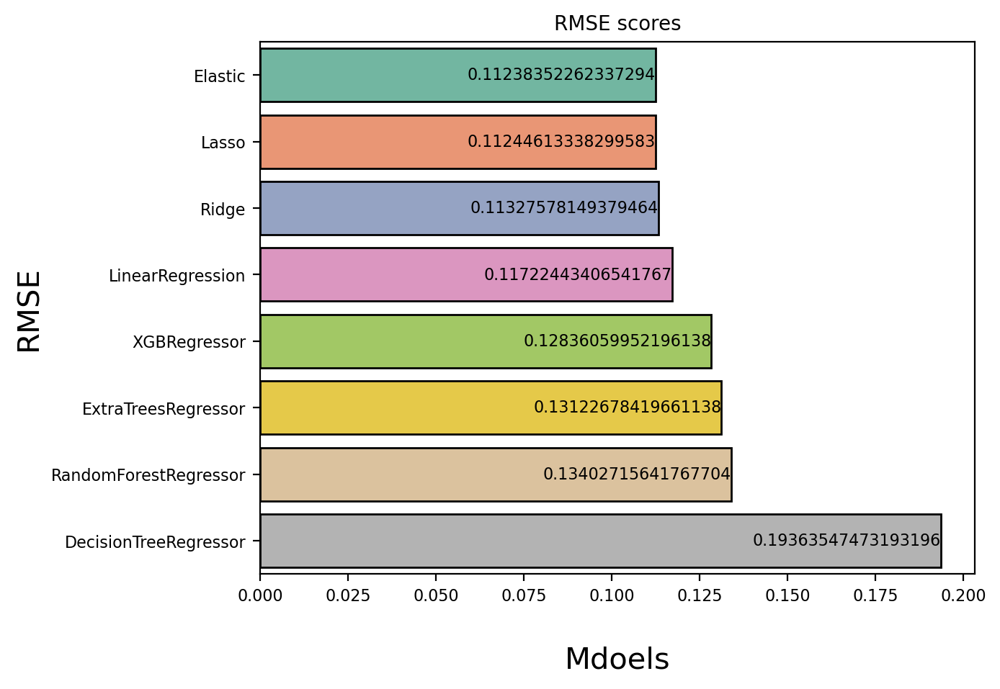

In [144]:
rmse_selected.sort_values('RMSE', inplace=True)

# plt.figure(figsize=(15,8))
sns.barplot(data = rmse_selected,
            x= 'RMSE',
            y= rmse_selected.index,
            orient='h',
            palette='Set2',
            edgecolor='black')

#Print each value for each bar
for index, value in enumerate(rmse_selected.RMSE):
    plt.text(value, index, value, fontdict={'size':8, 'color':'black'}, ha='right', va='center')

#Decoration
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)
plt.xlabel('\nMdoels', fontsize=15)
plt.ylabel('RMSE', fontsize=15);
plt.title('RMSE scores', fontsize=10 );

- Models after lasso eliminated the columns with low imporatance are better than mdoels with the full columns.<br><br>
- ElasticNet performs best among other models, comparing to other advance model i used it's seems the wasy we cleaned and prepare the data were not the best or in the best shape for these powerfull algorithms like XGB, eTRees.
<br>
- Here i'll do an enhancing for the prediction by using `stacking`.<br><br>

- I did i bit research about how to improve models, scores, etc.. and this is one methode from a lot of methodes like `boosting` and `bagging`. <br><br>

- There is a lib for it and functions that can do it better but as long as we're not allowed to use anything far away from the course line topics, **`i'll try to use the logic of this idea and try to apply it in simple and manual way like just add the two predcitoins and devide by number of models used`**.<br><br>

- This methode boosted our score for our submission on Kaggle from 0.12708 to 0.12510.<br><br>

- First i'll see what `Elastic` can do alone.<br><br>
- Second i'll go with `Elastic` and `XGB` since Lasso almost the same results as Elastic i'll try to have a low RMSE with Mid RMSE by that i assume i'll make some balance in the predictions.<br><br>

- Third, I'll try to combine the `Elastic, Lasso, XGB` and see the score since Elastic and lasso almost the same RMSE combining them will give a good prediction for two of them and with `XGB` we will have a balanced predction after adding them all.<br><br>

- Finaly i'll show the score for each section and prediction.

---

# Kaggle Submission

In [155]:
#Read submission file
submission = pd.read_csv("../data/house/house_sample_submission.csv")

### First submission for us on Kaggle

![](../assets/images/first_scores.png)

As we can see first two subs were errors 😊, but i was testing and get used to Kaggle, so our first score was `0.60795` RMSE and it was the baseline model then i decided to not include it in the Notebook file. I tried to re-sub with Ridge after it was the best that time and we got `0.19902` RMSE.

----

# ElasticNet

In [146]:
#Transform the results then write the results to df
submission.iloc[:,1] = np.expm1(elastic_s.predict(test[selected_features]))

#Write to csv for submission
submission.to_csv('../data/house/ElasticNet_prediction.csv', index=False)

# Score

![](../assets/images/el_score.png)

This is the score for Elastic model in Kaggle. This mdoel comes after bulding so many model and try different methods and do FE again etc..

---

## XGB with ElasticNet

In [147]:
# Adding the predictions of first model with the second and devide them by number of models
elastic_s_prediction = elastic_s.predict(test[selected_features])
xgb_prediction = xgb.predict(test[selected_features])
                                       

test_pred = (elastic_s_prediction + xgb_prediction)/2

#Transform the results then write the results to df
submission.iloc[:,1] = np.expm1(test_pred)

#Write to csv for submission
submission.to_csv('../data/house/XGB_and_ElasticNet_prediction.csv', index=False)

# Score

![](../assets/images/el_&_xgb_score.png)

This the improved score by using stacking logic for both XGB and Elastic.

---

## Lasso, ElasticNet, and XGB

In [148]:
# Adding the predictions of models and devide them by number of models
lasso_s_prediction = lasso_s.predict(test[selected_features])

#Prediction
test_pred = (elastic_s_prediction + lasso_s_prediction + xgb_prediction)/3

#Write the results
submission.iloc[:,1] = np.expm1(test_pred)

#Write to csv for submission
submission.to_csv('../data/house/Lasso_XGB_ElasticNet_prediction.csv', index=False)

# Score

![](../assets/images/el__xgb_la_score.png)

---

This is our final score for submission, it's a combination of Lasso, ElasticNet and XGB.
 - We placed on the top `20%`.

![](../assets/images/final_score_sub.png)